<center><b><u>IDEAS / FUTURE PLANS</u></b></center> 

- Can train with only expert or naive sessions
- ^ these results with just expert sessions are most telling, since we're not forcing rote memorization with the naive performances
- ^ Can do this last, Lur wants stuff for his grant!
- Include all the mice
- Pre and post-turn.
- Cross-validation. It will average over 8 or so models with more orthogonal splits than re-training and avg'ing.
- Can get more resolution than single vs all. E.g. single, double, triple, quadruple sessions datasets. Can even permutate the latter types to include non-consecutive days.
- <small><sub>(LATER) Marj and I's input subset on the neurons. Lur's grad student found 25% are hub / highly important</sub></small>
- <small><sub>^ if cell IDs are consistent, then we can literally get at turnover / drift counts by comparing sessions!</sub></small>
- <small><sub>(LATER) Decoders trained on all dates for 1 mouse vs other mice's combined dates validation data</sub></small>

In [1]:
import os
import cv2
import math
import numpy as np
import pandas as pd

base_dir = '/home/rbain/Desktop/ali_data'
save_dir = os.path.join(base_dir, "results")
data_dir = os.path.join(save_dir, "data")
os.makedirs(data_dir, exist_ok=True)
max_f = 1200
# mice_ids = ['m9r'] # for debugging
mice_ids = ['m8l','m9r','m11n','m12lr','m13l','m14r','m15n','m16l','m17r',
            'm19n','m21r','m22l','m23r','m25lr','m26r','m27l','m30lr',
            'm31r','m32l','m33r','m36rr','m37l','m38n','m39rr','m40l']

In [2]:
# see what mice IDs are available to choose from
!ls $base_dir

'~$e2_matchedvunmatched_decoding.xlsx'	 m15n	 m25lr	 m33r	 m8l
 crossreg				 m16l	 m26r	 m34n	 m9r
 desktop.ini				 m17r	 m27l	 m36rr	 mice_params
 guide.txt				 m18ll	 m29n	 m37l	 min4r
 m11n					 m19n	 m2r	 m38n	 results
 m12lr					 m21r	 m30lr	 m39rr	 sequential
 m13l					 m22l	 m31r	 m40l	 sn
 m14r					 m23r	 m32l	 m41r	 snr


### Find max fluorescence.
##### Only needs to run once per dataset.

In [ ]:
# slowly find max fluorescence in whole dataset
max_f = -1
for m_id in mice_ids:
  # parent dir with potentially multiple days of recordings
  s2_dir = os.path.join(base_dir, m_id, 's2')
  s2_days_unfiltered = os.listdir(s2_dir)
  s2_days = [] # for filtered version
  # keep just dirs; remove files
  for fn in s2_days_unfiltered:
    s2_day = os.path.join(base_dir, m_id, 's2', fn)
    if os.path.isdir(s2_day):
      s2_days.append(s2_day)
  assert len(s2_days) > 0, f'mouse {m_id} is missing s2 day dir'

  # single day's s2 recording directory
  for s2_day in s2_days:
    # time is everything before final "/"
    t = s2_day.split("/")[-1]
    flourescence_csv = os.path.join(s2_day, f'calcium_raw_{t}.csv')
    if os.path.isfile(flourescence_csv):
      flourescence = pd.read_csv(flourescence_csv)
      for i in range(len(flourescence.columns)-1):
        if flourescence[str(i)].max() > max_f:
          max_f = flourescence[str(i)].max()
          print(f'[1] new max flourescence found: {max_f}')
          avg_f = flourescence[str(i)].mean()
          print(f'[2] mean flourescence found: {avg_f}')


[1] new max flourescence found: 358.77552263091616
[2] mean flourescence found: 26.53345355726876
[1] new max flourescence found: 680.2280938640173
[2] mean flourescence found: 109.05588838409847
[1] new max flourescence found: 710.3196690525145
[2] mean flourescence found: 131.33432348747604
[1] new max flourescence found: 1002.1352831996528
[2] mean flourescence found: 192.6756207986993
[1] new max flourescence found: 1148.3191881707453
[2] mean flourescence found: 123.7024351488722
[1] new max flourescence found: 1545.907997189842
[2] mean flourescence found: 204.29782205912338
[1] new max flourescence found: 1956.4443406016217
[2] mean flourescence found: 371.8412226478263
[1] new max flourescence found: 2178.0087118098127
[2] mean flourescence found: 332.05778318482186


KeyboardInterrupt: ignored

### create and save dataset.csv and acc.csv to gdrive:
Uses clean INIT and clean FTP (follow the pattern) trials when calculating the accuracies for each mouses' training days.

started processing: /home/rbain/Desktop/ali_data/m8l/s2/05_19_2022___10_56_04
started processing: /home/rbain/Desktop/ali_data/m9r/s2/05_19_2022___14_54_17
started processing: /home/rbain/Desktop/ali_data/m9r/s2/05_20_2022___15_58_30
100 images created so far!


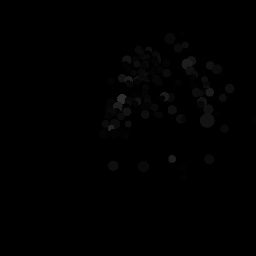

started processing: /home/rbain/Desktop/ali_data/m9r/s2/05_23_2022___13_10_04
started processing: /home/rbain/Desktop/ali_data/m9r/s2/05_24_2022___11_33_56
200 images created so far!


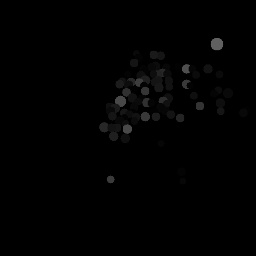

started processing: /home/rbain/Desktop/ali_data/m9r/s2/05_25_2022___11_46_10
started processing: /home/rbain/Desktop/ali_data/m9r/s2/05_26_2022___13_46_39
300 images created so far!


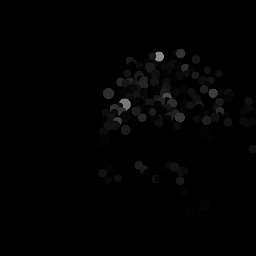

started processing: /home/rbain/Desktop/ali_data/m11n/s2/05_23_2022___14_43_33
started processing: /home/rbain/Desktop/ali_data/m11n/s2/05_25_2022___13_30_35
started processing: /home/rbain/Desktop/ali_data/m11n/s2/05_26_2022___10_43_19
400 images created so far!


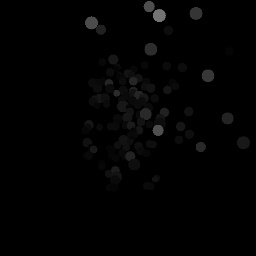

started processing: /home/rbain/Desktop/ali_data/m11n/s2/05_30_2022___13_43_49
started processing: /home/rbain/Desktop/ali_data/m11n/s2/05_31_2022___13_45_39
started processing: /home/rbain/Desktop/ali_data/m11n/s2/06_03_2022___13_15_37
started processing: /home/rbain/Desktop/ali_data/m11n/s2/06_06_2022___16_03_04
500 images created so far!


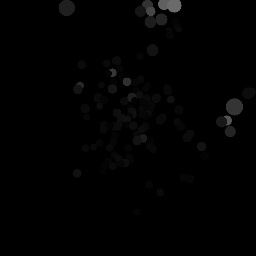

started processing: /home/rbain/Desktop/ali_data/m11n/s2/06_07_2022___11_33_41
started processing: /home/rbain/Desktop/ali_data/m11n/s2/06_09_2022___13_07_54
600 images created so far!


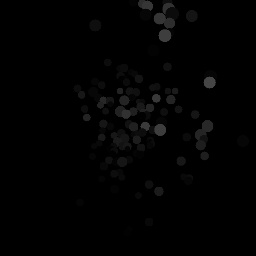

started processing: /home/rbain/Desktop/ali_data/m11n/s2/06_13_2022___12_19_44
started processing: /home/rbain/Desktop/ali_data/m11n/s2/06_14_2022___12_16_23
700 images created so far!


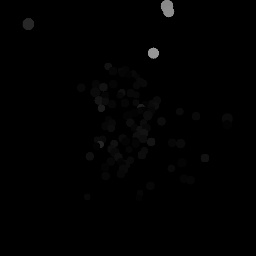

started processing: /home/rbain/Desktop/ali_data/m11n/s2/06_16_2022___13_21_13
started processing: /home/rbain/Desktop/ali_data/m11n/s2/06_17_2022___12_56_13
started processing: /home/rbain/Desktop/ali_data/m11n/s2/09_27_2022___12_35_02
800 images created so far!


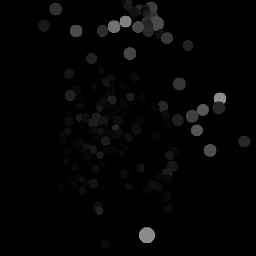

started processing: /home/rbain/Desktop/ali_data/m11n/s2/09_28_2022___13_42_54
900 images created so far!


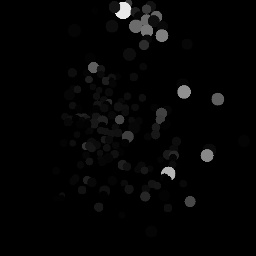

1000 images created so far!


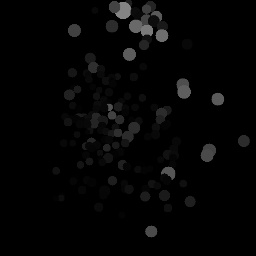

started processing: /home/rbain/Desktop/ali_data/m11n/s2/09_29_2022___12_06_15
1100 images created so far!


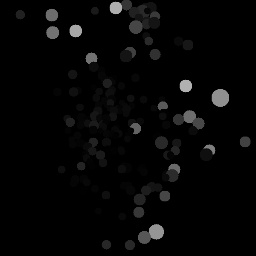

started processing: /home/rbain/Desktop/ali_data/m12lr/s2/05_17_2022___16_15_20
started processing: /home/rbain/Desktop/ali_data/m12lr/s2/05_18_2022___13_28_32
1200 images created so far!


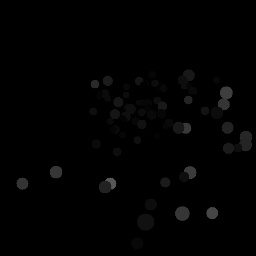

started processing: /home/rbain/Desktop/ali_data/m12lr/s2/05_20_2022___15_00_32
1300 images created so far!


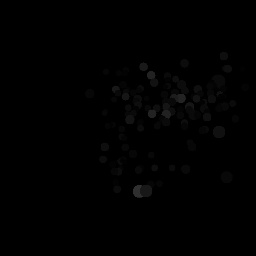

started processing: /home/rbain/Desktop/ali_data/m12lr/s2/05_23_2022___13_56_29
1400 images created so far!


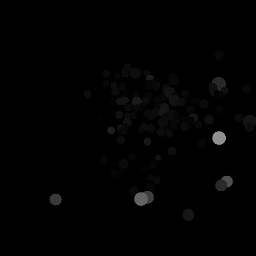

started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_03_2022___14_00_39
started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_06_2022___15_21_48
1500 images created so far!


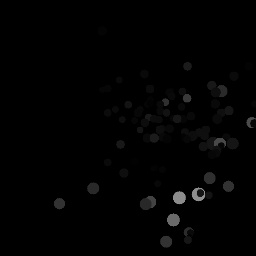

started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_07_2022___10_46_59
started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_08_2022___12_56_54
skipping 06_08_2022___12_56_54 for m12lr. No clean trials.
started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_09_2022___12_16_17
1600 images created so far!


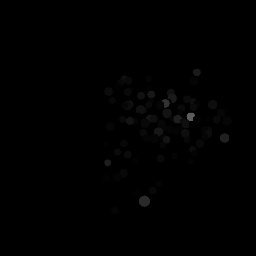

started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_10_2022___11_04_20
started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_13_2022___11_28_34
1700 images created so far!


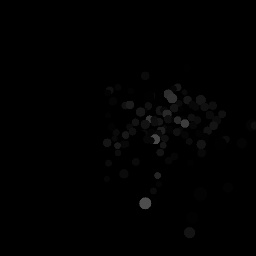

started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_16_2022___12_01_38
1800 images created so far!


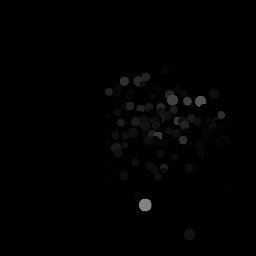

started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_27_2022___11_07_42
started processing: /home/rbain/Desktop/ali_data/m12lr/s2/06_30_2022___13_23_19
1900 images created so far!


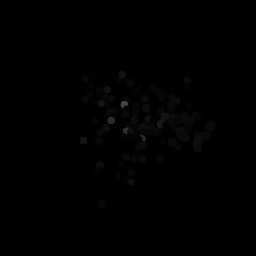

started processing: /home/rbain/Desktop/ali_data/m12lr/s2/07_01_2022___12_06_26
started processing: /home/rbain/Desktop/ali_data/m12lr/s2/07_05_2022___13_16_41
started processing: /home/rbain/Desktop/ali_data/m13l/s2/05_18_2022___11_00_50
2000 images created so far!


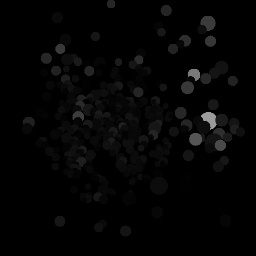

started processing: /home/rbain/Desktop/ali_data/m13l/s2/05_19_2022___10_52_09
2100 images created so far!


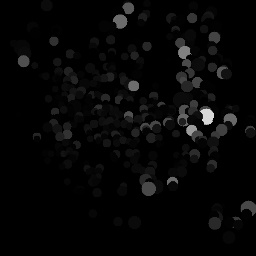

started processing: /home/rbain/Desktop/ali_data/m13l/s2/05_20_2022___13_29_47
2200 images created so far!


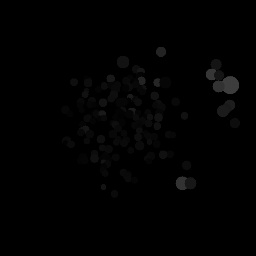

started processing: /home/rbain/Desktop/ali_data/m13l/s2/05_23_2022___12_16_16
2300 images created so far!


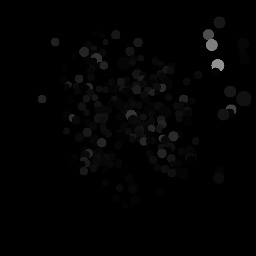

started processing: /home/rbain/Desktop/ali_data/m13l/s2/05_24_2022___10_47_34
2400 images created so far!


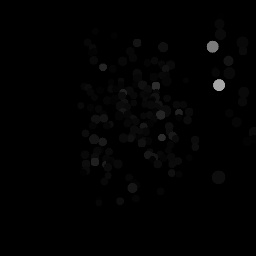

started processing: /home/rbain/Desktop/ali_data/m13l/s2/05_25_2022___10_57_17
2500 images created so far!


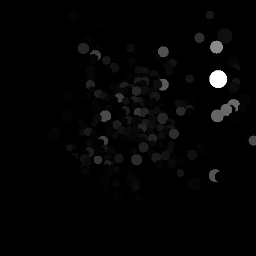

started processing: /home/rbain/Desktop/ali_data/m13l/s2/05_30_2022___11_21_25
2600 images created so far!


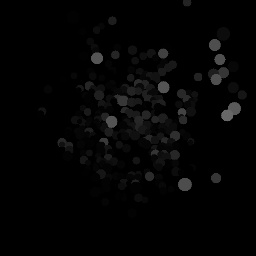

2700 images created so far!


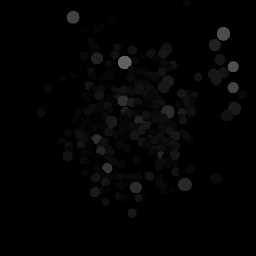

started processing: /home/rbain/Desktop/ali_data/m13l/s2/05_31_2022___10_44_15
2800 images created so far!


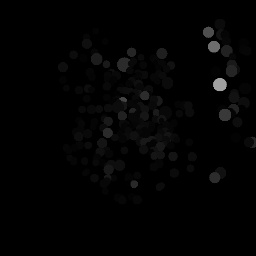

started processing: /home/rbain/Desktop/ali_data/m13l/s2/06_01_2022___11_52_48
2900 images created so far!


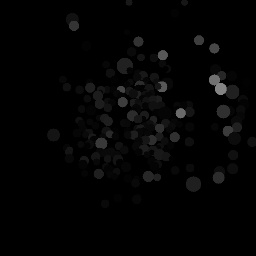

started processing: /home/rbain/Desktop/ali_data/m13l/s2/06_02_2022___09_27_13
3000 images created so far!


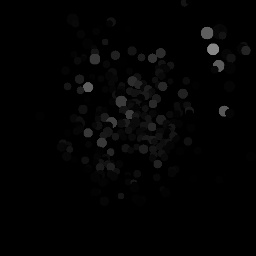

started processing: /home/rbain/Desktop/ali_data/m13l/s2/06_03_2022___11_43_02
3100 images created so far!


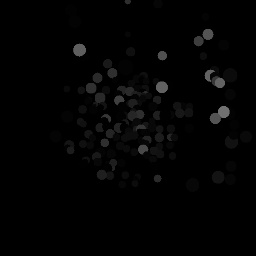

3200 images created so far!


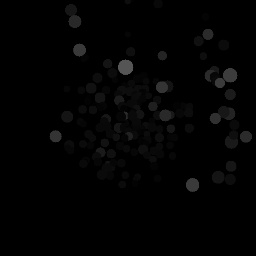

started processing: /home/rbain/Desktop/ali_data/m13l/s2/06_06_2022___11_15_10
3300 images created so far!


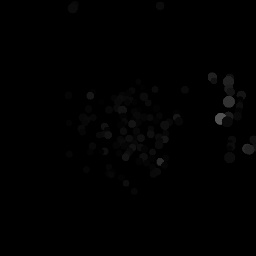

started processing: /home/rbain/Desktop/ali_data/m13l/s2/06_07_2022___08_29_11
started processing: /home/rbain/Desktop/ali_data/m13l/s2/06_08_2022___10_31_18
3400 images created so far!


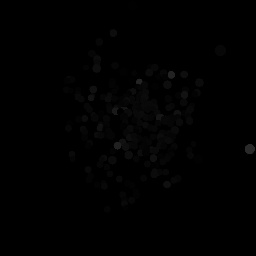

started processing: /home/rbain/Desktop/ali_data/m13l/s2/06_09_2022___10_42_36
3500 images created so far!


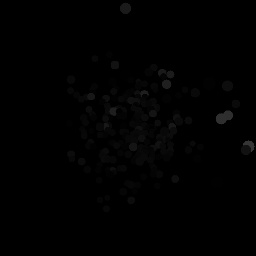

started processing: /home/rbain/Desktop/ali_data/m14r/s2/06_16_2022___13_23_42
3600 images created so far!


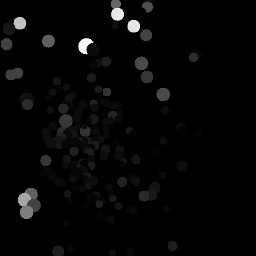

started processing: /home/rbain/Desktop/ali_data/m14r/s2/06_21_2022___11_39_13
3700 images created so far!


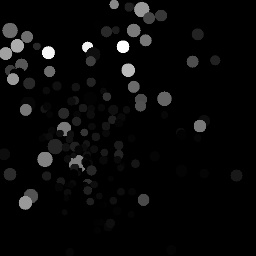

started processing: /home/rbain/Desktop/ali_data/m14r/s2/06_22_2022___11_10_06
3800 images created so far!


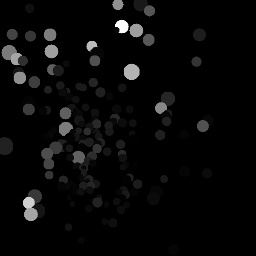

3900 images created so far!


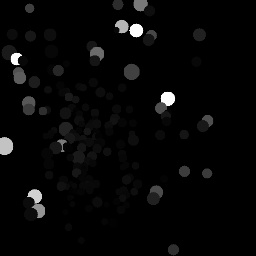

started processing: /home/rbain/Desktop/ali_data/m14r/s2/06_23_2022___12_45_42
4000 images created so far!


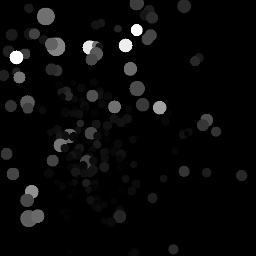

started processing: /home/rbain/Desktop/ali_data/m14r/s2/06_24_2022___12_19_23
4100 images created so far!


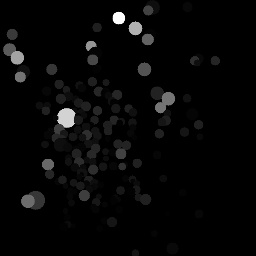

started processing: /home/rbain/Desktop/ali_data/m14r/s2/06_27_2022___12_24_48
4200 images created so far!


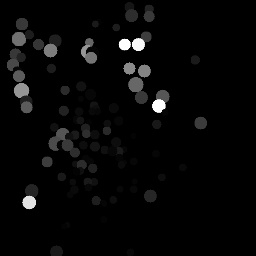

started processing: /home/rbain/Desktop/ali_data/m14r/s2/06_28_2022___10_19_39
started processing: /home/rbain/Desktop/ali_data/m14r/s2/06_29_2022___12_36_18
4300 images created so far!


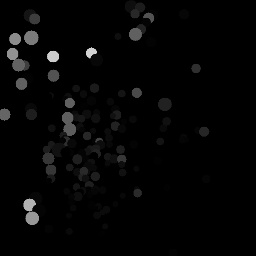

started processing: /home/rbain/Desktop/ali_data/m14r/s2/06_30_2022___10_45_09
4400 images created so far!


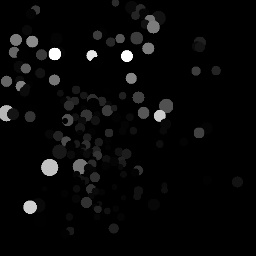

started processing: /home/rbain/Desktop/ali_data/m14r/s2/07_01_2022___12_01_01
4500 images created so far!


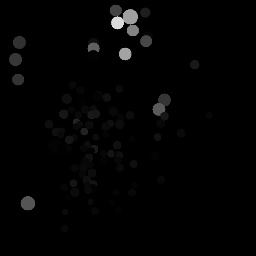

started processing: /home/rbain/Desktop/ali_data/m14r/s2/07_05_2022___10_54_12
4600 images created so far!


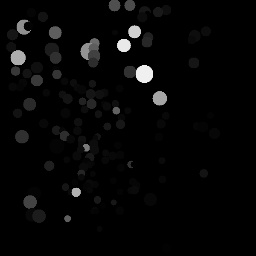

started processing: /home/rbain/Desktop/ali_data/m14r/s2/09_16_2022___13_07_05
started processing: /home/rbain/Desktop/ali_data/m14r/s2/09_19_2022___12_55_10
started processing: /home/rbain/Desktop/ali_data/m14r/s2/09_20_2022___13_47_57
started processing: /home/rbain/Desktop/ali_data/m14r/s2/09_21_2022___13_18_34
started processing: /home/rbain/Desktop/ali_data/m14r/s2/09_23_2022___13_02_27
started processing: /home/rbain/Desktop/ali_data/m14r/s2/09_26_2022___13_01_45
started processing: /home/rbain/Desktop/ali_data/m14r/s2/09_28_2022___13_49_03
started processing: /home/rbain/Desktop/ali_data/m14r/s2/09_29_2022___12_57_25
skipping 09_29_2022___12_57_25 for m14r. No clean trials.
started processing: /home/rbain/Desktop/ali_data/m14r/s2/09_30_2022___12_10_20
4700 images created so far!


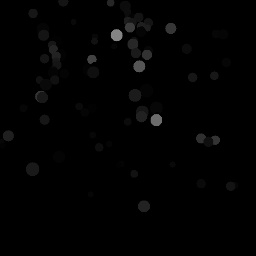

started processing: /home/rbain/Desktop/ali_data/m14r/s2/10_03_2022___13_32_34
started processing: /home/rbain/Desktop/ali_data/m14r/s2/10_04_2022___13_45_45
started processing: /home/rbain/Desktop/ali_data/m15n/s2/06_15_2022___12_52_13
4800 images created so far!


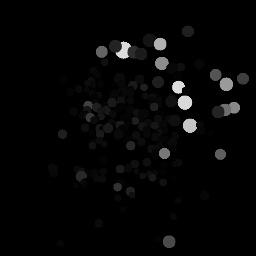

started processing: /home/rbain/Desktop/ali_data/m15n/s2/06_17_2022___12_11_05
started processing: /home/rbain/Desktop/ali_data/m15n/s2/06_22_2022___11_58_29
4900 images created so far!


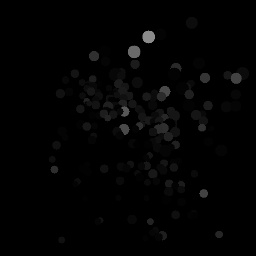

started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_16_2022___13_58_41
5000 images created so far!


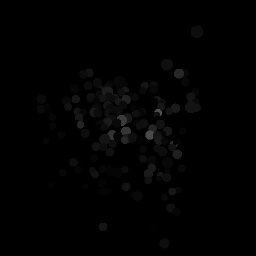

started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_19_2022___11_33_25
5100 images created so far!


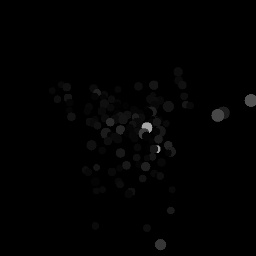

started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_20_2022___15_19_26
5200 images created so far!


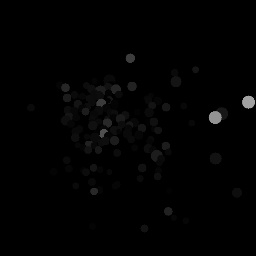

started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_21_2022___14_06_10
5300 images created so far!


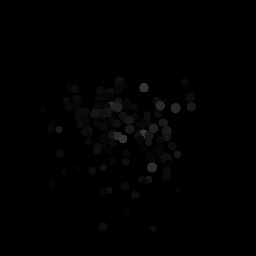

started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_22_2022___12_40_42
5400 images created so far!


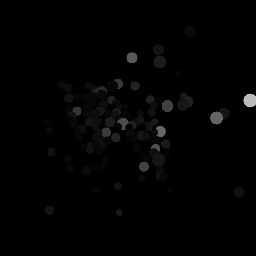

started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_23_2022___13_48_29
5500 images created so far!


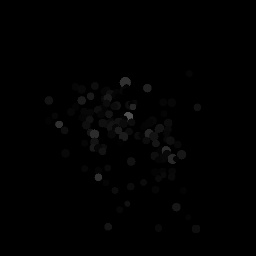

started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_26_2022___12_16_29
started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_27_2022___14_25_37
5600 images created so far!


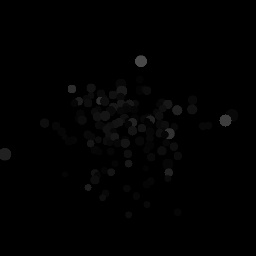

started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_28_2022___12_59_15
started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_29_2022___13_45_20
started processing: /home/rbain/Desktop/ali_data/m15n/s2/09_30_2022___11_26_00
5700 images created so far!


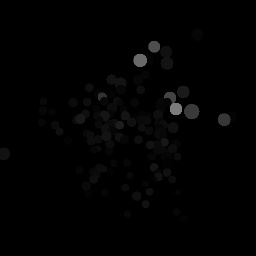

started processing: /home/rbain/Desktop/ali_data/m15n/s2/10_03_2022___14_34_49
started processing: /home/rbain/Desktop/ali_data/m15n/s2/10_04_2022___12_50_54
5800 images created so far!


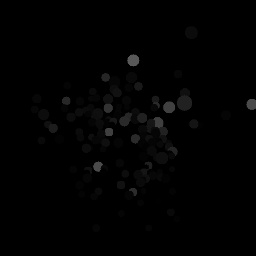

started processing: /home/rbain/Desktop/ali_data/m16l/s2/09_21_2022___14_01_55
5900 images created so far!


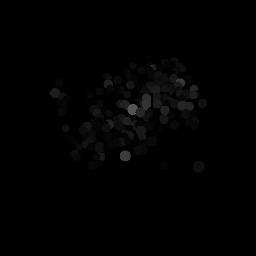

started processing: /home/rbain/Desktop/ali_data/m16l/s2/09_22_2022___12_37_05
6000 images created so far!


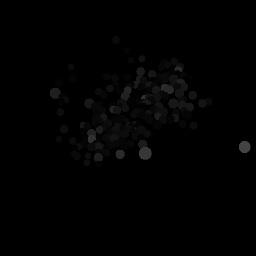

started processing: /home/rbain/Desktop/ali_data/m16l/s2/09_23_2022___13_45_35
6100 images created so far!


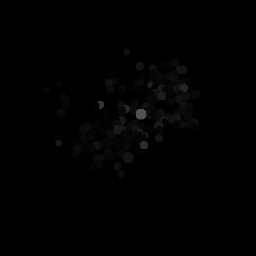

started processing: /home/rbain/Desktop/ali_data/m16l/s2/09_26_2022___12_59_00
6200 images created so far!


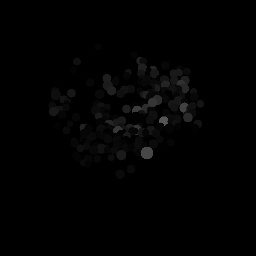

started processing: /home/rbain/Desktop/ali_data/m16l/s2/09_27_2022___14_23_15
6300 images created so far!


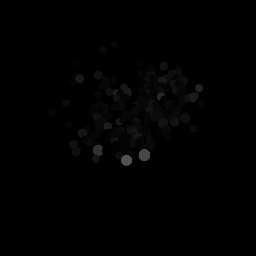

started processing: /home/rbain/Desktop/ali_data/m16l/s2/09_28_2022___12_13_11
6400 images created so far!


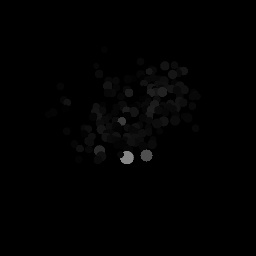

started processing: /home/rbain/Desktop/ali_data/m16l/s2/09_29_2022___13_42_31
6500 images created so far!


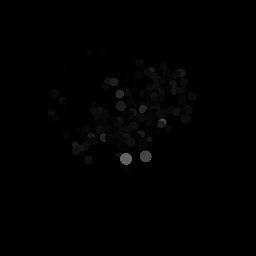

started processing: /home/rbain/Desktop/ali_data/m16l/s2/09_30_2022___12_54_19
started processing: /home/rbain/Desktop/ali_data/m16l/s2/10_03_2022___14_32_29
6600 images created so far!


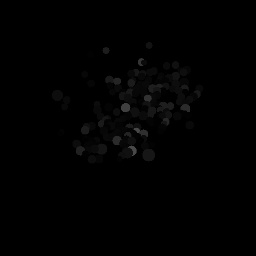

6700 images created so far!


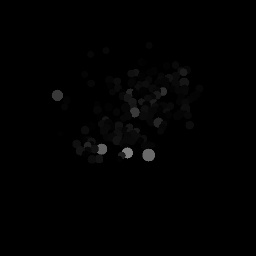

started processing: /home/rbain/Desktop/ali_data/m16l/s2/10_04_2022___13_43_22
6800 images created so far!


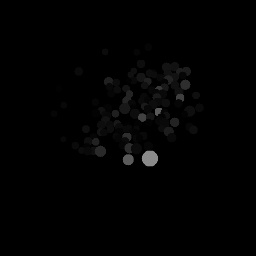

started processing: /home/rbain/Desktop/ali_data/m16l/s2/10_05_2022___16_00_33
6900 images created so far!


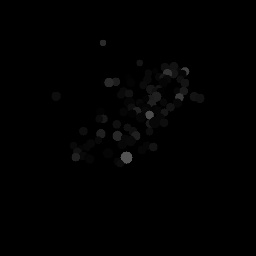

started processing: /home/rbain/Desktop/ali_data/m16l/s2/10_06_2022___16_00_24
7000 images created so far!


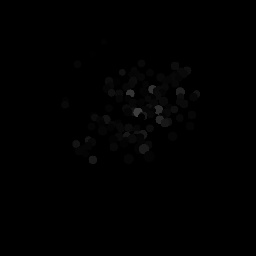

started processing: /home/rbain/Desktop/ali_data/m16l/s2/10_07_2022___14_33_41
7100 images created so far!


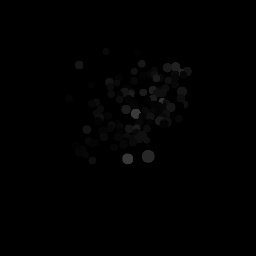

started processing: /home/rbain/Desktop/ali_data/m16l/s2/10_10_2022___13_20_45
7200 images created so far!


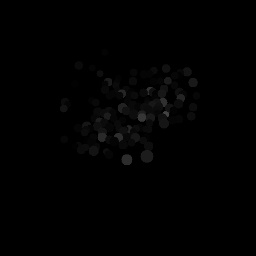

started processing: /home/rbain/Desktop/ali_data/m16l/s2/10_11_2022___13_43_22
7300 images created so far!


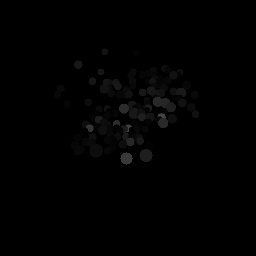

7400 images created so far!


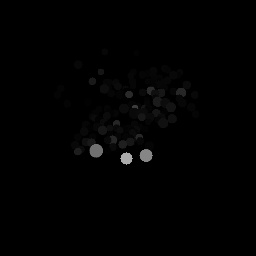

started processing: /home/rbain/Desktop/ali_data/m16l/s2/10_13_2022___12_23_50
7500 images created so far!


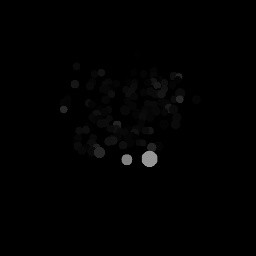

started processing: /home/rbain/Desktop/ali_data/m16l/s2/10_14_2022___15_42_11
7600 images created so far!


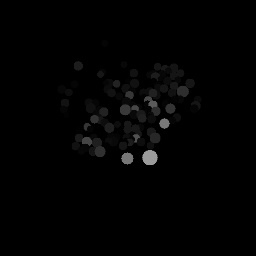

started processing: /home/rbain/Desktop/ali_data/m16l/s2/11_08_2022___17_23_19
7700 images created so far!


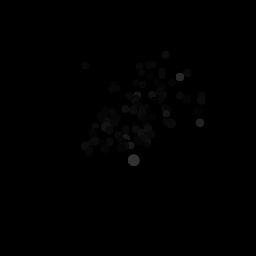

started processing: /home/rbain/Desktop/ali_data/m16l/s2/11_09_2022___11_42_28
started processing: /home/rbain/Desktop/ali_data/m16l/s2/11_10_2022___13_36_35
7800 images created so far!


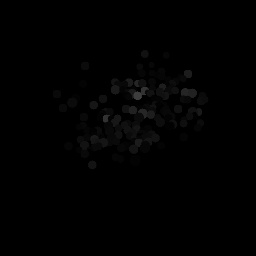

started processing: /home/rbain/Desktop/ali_data/m17r/s2/10_03_2022___12_36_52
started processing: /home/rbain/Desktop/ali_data/m17r/s2/10_04_2022___11_58_00
started processing: /home/rbain/Desktop/ali_data/m17r/s2/10_06_2022___13_49_13
7900 images created so far!


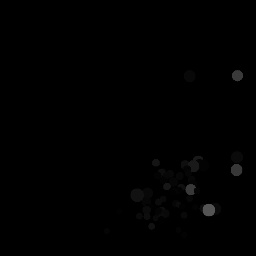

started processing: /home/rbain/Desktop/ali_data/m17r/s2/10_10_2022___11_04_53
started processing: /home/rbain/Desktop/ali_data/m17r/s2/10_11_2022___11_11_53
started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_16_2022___12_21_49
8000 images created so far!


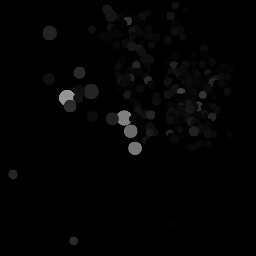

started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_19_2022___13_49_12
started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_20_2022___13_03_00
8100 images created so far!


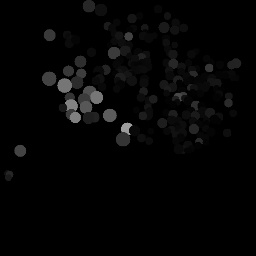

started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_21_2022___12_12_14
8200 images created so far!


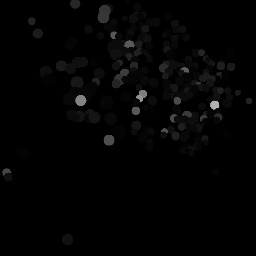

started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_22_2022___11_06_41
started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_23_2022___12_17_22
8300 images created so far!


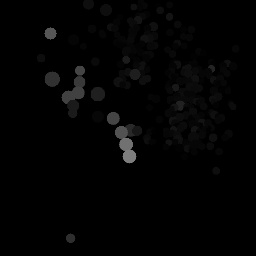

started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_27_2022___12_37_31
started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_28_2022___12_09_40
8400 images created so far!


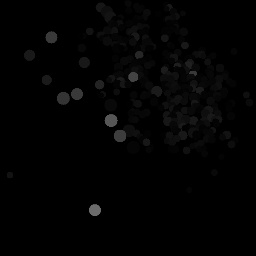

started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_29_2022___12_09_50
started processing: /home/rbain/Desktop/ali_data/m19n/s2/09_30_2022___10_41_22
8500 images created so far!


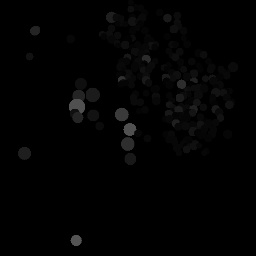

started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_03_2022___12_42_06
started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_04_2022___12_03_09
8600 images created so far!


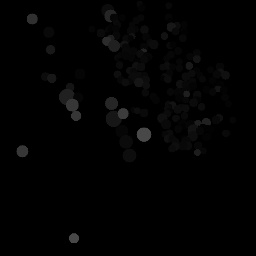

started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_05_2022___13_41_12
started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_07_2022___13_04_31
8700 images created so far!


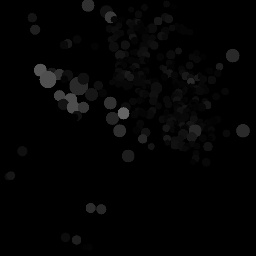

started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_10_2022___11_11_36
started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_12_2022___13_47_30
8800 images created so far!


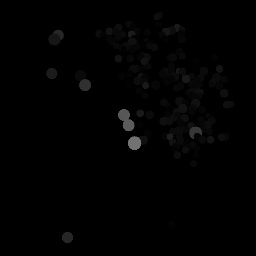

started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_13_2022___10_51_46
started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_14_2022___14_07_52
8900 images created so far!


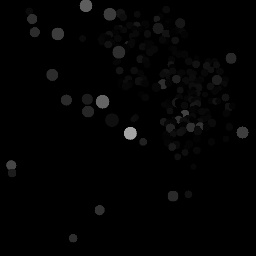

started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_28_2022___11_04_58
started processing: /home/rbain/Desktop/ali_data/m19n/s2/10_31_2022___12_20_16
9000 images created so far!


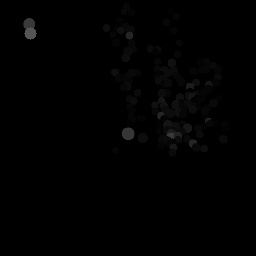

started processing: /home/rbain/Desktop/ali_data/m19n/s2/11_01_2022___12_47_51
started processing: /home/rbain/Desktop/ali_data/m19n/s2/11_02_2022___11_34_58
9100 images created so far!


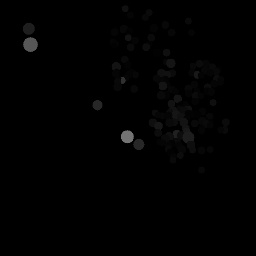

started processing: /home/rbain/Desktop/ali_data/m19n/s2/11_03_2022___12_32_03
started processing: /home/rbain/Desktop/ali_data/m19n/s2/11_07_2022___14_07_02
9200 images created so far!


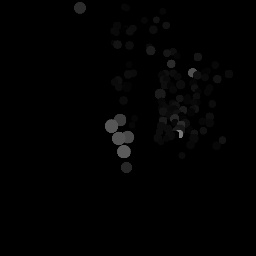

started processing: /home/rbain/Desktop/ali_data/m19n/s2/11_08_2022___12_14_16
9300 images created so far!


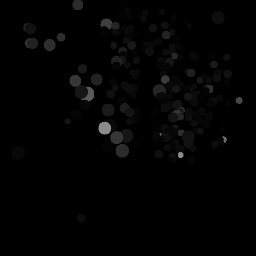

started processing: /home/rbain/Desktop/ali_data/m21r/s2/10_13_2022___10_48_01
9400 images created so far!


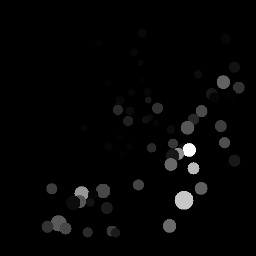

started processing: /home/rbain/Desktop/ali_data/m21r/s2/10_14_2022___14_05_42
started processing: /home/rbain/Desktop/ali_data/m21r/s2/10_28_2022___12_44_55
9500 images created so far!


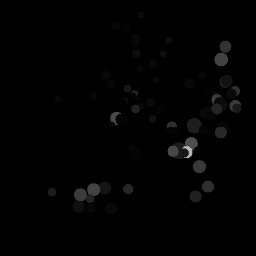

started processing: /home/rbain/Desktop/ali_data/m21r/s2/10_31_2022___12_18_01
9600 images created so far!


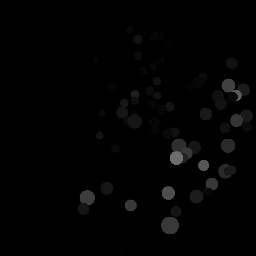

started processing: /home/rbain/Desktop/ali_data/m21r/s2/11_04_2022___14_34_14
started processing: /home/rbain/Desktop/ali_data/m21r/s2/11_08_2022___15_51_35
9700 images created so far!


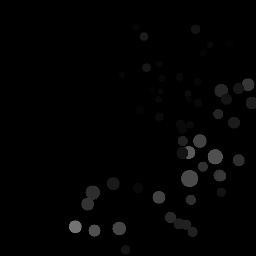

started processing: /home/rbain/Desktop/ali_data/m21r/s2/11_09_2022___12_23_52
started processing: /home/rbain/Desktop/ali_data/m21r/s2/11_10_2022___12_05_20
9800 images created so far!


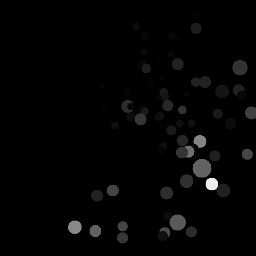

started processing: /home/rbain/Desktop/ali_data/m22l/s2/10_28_2022___12_48_45
started processing: /home/rbain/Desktop/ali_data/m22l/s2/10_31_2022___12_54_51
started processing: /home/rbain/Desktop/ali_data/m22l/s2/11_01_2022___13_25_49
9900 images created so far!


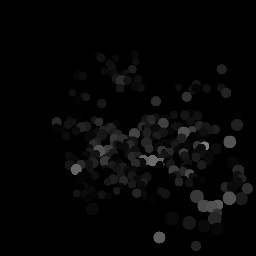

started processing: /home/rbain/Desktop/ali_data/m22l/s2/11_03_2022___13_08_05
started processing: /home/rbain/Desktop/ali_data/m22l/s2/11_04_2022___14_31_27
started processing: /home/rbain/Desktop/ali_data/m22l/s2/11_07_2022___12_32_34
started processing: /home/rbain/Desktop/ali_data/m22l/s2/11_08_2022___16_27_07
started processing: /home/rbain/Desktop/ali_data/m22l/s2/11_09_2022___11_39_33
10000 images created so far!


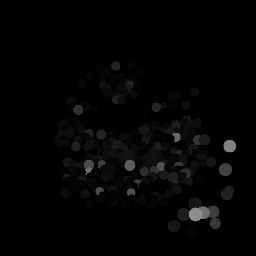

started processing: /home/rbain/Desktop/ali_data/m22l/s2/11_10_2022___12_49_47
started processing: /home/rbain/Desktop/ali_data/m22l/s2/12_01_2022___10_35_42
started processing: /home/rbain/Desktop/ali_data/m22l/s2/12_02_2022___13_19_39
10100 images created so far!


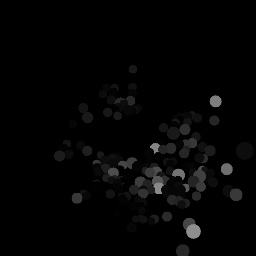

started processing: /home/rbain/Desktop/ali_data/m22l/s2/12_06_2022___13_32_46
10200 images created so far!


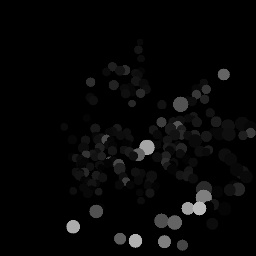

started processing: /home/rbain/Desktop/ali_data/m22l/s2/12_08_2022___11_43_27
started processing: /home/rbain/Desktop/ali_data/m22l/s2/12_14_2022___12_11_45
10300 images created so far!


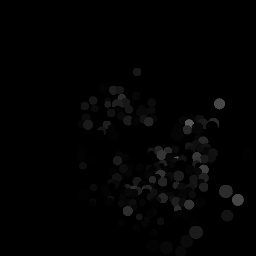

started processing: /home/rbain/Desktop/ali_data/m22l/s2/12_19_2022___11_16_52
10400 images created so far!


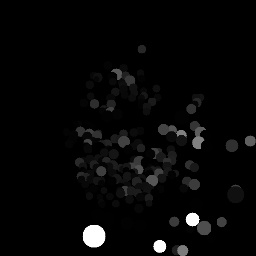

started processing: /home/rbain/Desktop/ali_data/m22l/s2/12_20_2022___12_27_06
10500 images created so far!


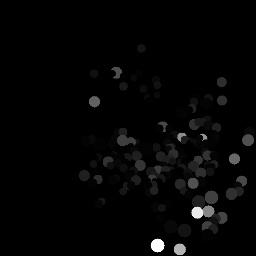

started processing: /home/rbain/Desktop/ali_data/m23r/s2/10_13_2022___11_35_28
started processing: /home/rbain/Desktop/ali_data/m23r/s2/10_14_2022___15_38_59
started processing: /home/rbain/Desktop/ali_data/m23r/s2/10_26_2022___13_33_47
started processing: /home/rbain/Desktop/ali_data/m23r/s2/10_28_2022___11_45_57
started processing: /home/rbain/Desktop/ali_data/m23r/s2/10_31_2022___13_38_23
started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_05_2022___11_52_15
10600 images created so far!


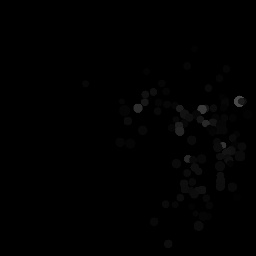

started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_06_2022___14_19_04
10700 images created so far!


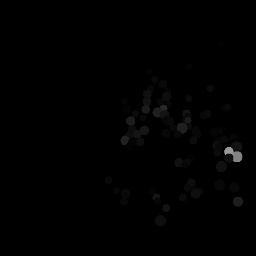

started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_07_2022___12_22_36
10800 images created so far!


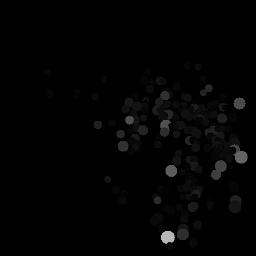

started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_08_2022___12_29_40
10900 images created so far!


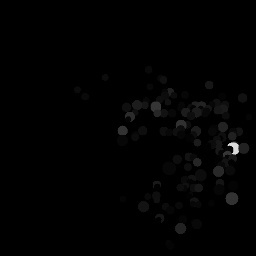

started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_13_2022___11_02_38
11000 images created so far!


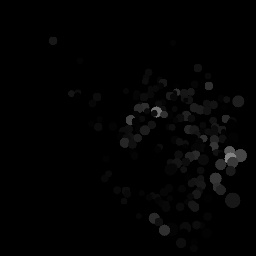

started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_14_2022___11_26_04
11100 images created so far!


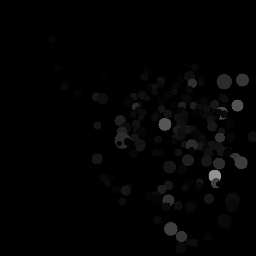

started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_15_2022___10_46_14
11200 images created so far!


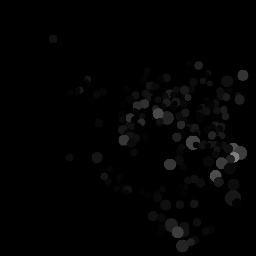

11300 images created so far!


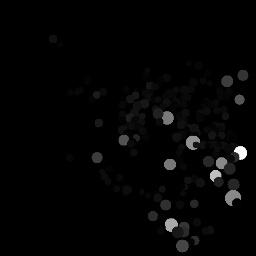

started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_16_2022___11_24_52
11400 images created so far!


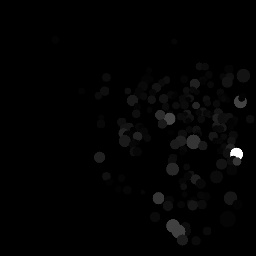

11500 images created so far!


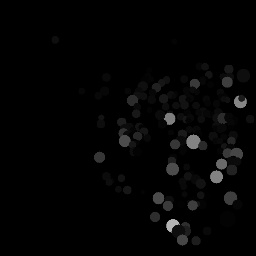

started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_20_2022___11_46_58
11600 images created so far!


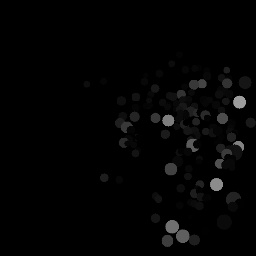

started processing: /home/rbain/Desktop/ali_data/m25lr/s2/12_21_2022___12_10_24
11700 images created so far!


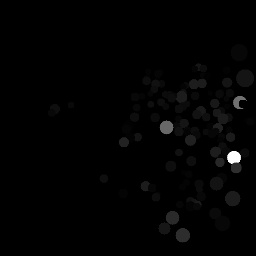

started processing: /home/rbain/Desktop/ali_data/m26r/s2/12_14_2022___11_23_32
11800 images created so far!


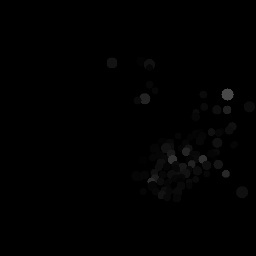

started processing: /home/rbain/Desktop/ali_data/m26r/s2/12_15_2022___10_48_12
11900 images created so far!


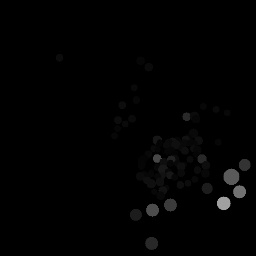

started processing: /home/rbain/Desktop/ali_data/m26r/s2/12_16_2022___11_26_38
12000 images created so far!


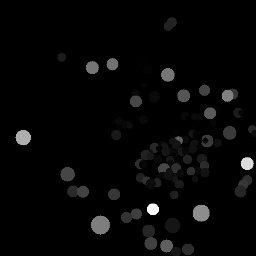

started processing: /home/rbain/Desktop/ali_data/m26r/s2/12_19_2022___11_21_35
12100 images created so far!


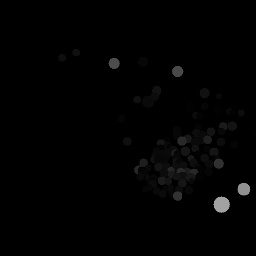

started processing: /home/rbain/Desktop/ali_data/m26r/s2/12_20_2022___11_49_48
started processing: /home/rbain/Desktop/ali_data/m26r/s2/12_21_2022___12_12_08
12200 images created so far!


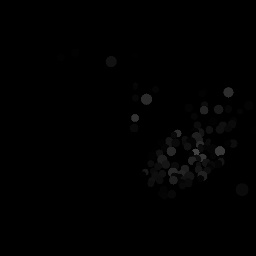

12300 images created so far!


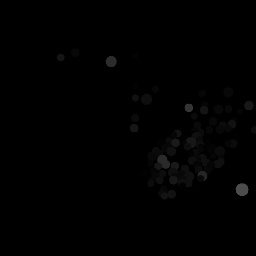

started processing: /home/rbain/Desktop/ali_data/m27l/s2/12_20_2022___11_44_34
started processing: /home/rbain/Desktop/ali_data/m30lr/s2/08_01_2023___13_10_36
12400 images created so far!


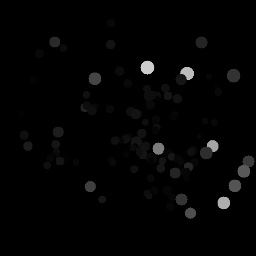

started processing: /home/rbain/Desktop/ali_data/m30lr/s2/08_02_2023___10_58_42
started processing: /home/rbain/Desktop/ali_data/m30lr/s2/08_04_2023___12_31_58
12500 images created so far!


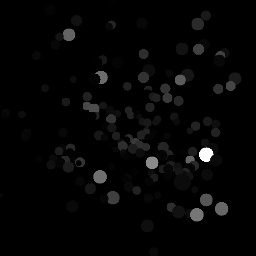

started processing: /home/rbain/Desktop/ali_data/m30lr/s2/08_08_2023___12_17_13
12600 images created so far!


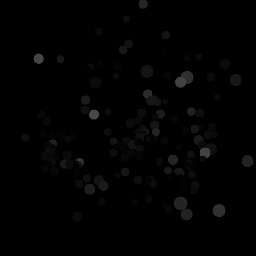

started processing: /home/rbain/Desktop/ali_data/m30lr/s2/08_11_2023___12_13_55
12700 images created so far!


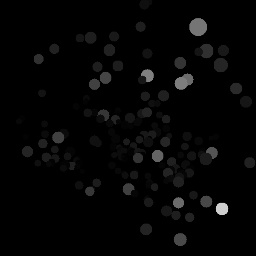

started processing: /home/rbain/Desktop/ali_data/m30lr/s2/08_14_2023___12_51_26
12800 images created so far!


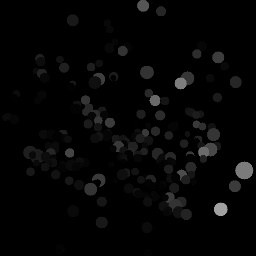

started processing: /home/rbain/Desktop/ali_data/m30lr/s2/08_15_2023___10_58_46
12900 images created so far!


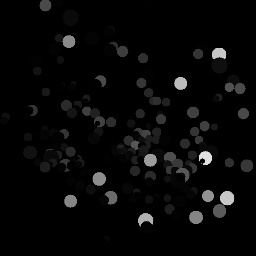

13000 images created so far!


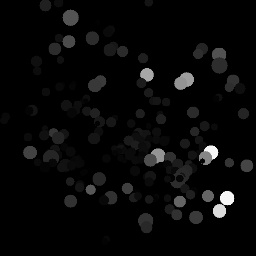

started processing: /home/rbain/Desktop/ali_data/m30lr/s2/08_16_2023___11_58_25
13100 images created so far!


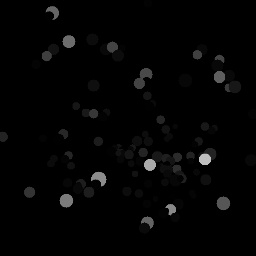

started processing: /home/rbain/Desktop/ali_data/m31r/s2/07_31_2023___10_11_30
13200 images created so far!


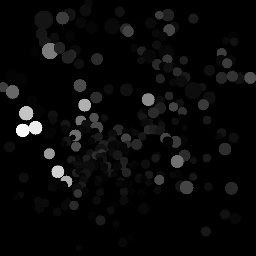

started processing: /home/rbain/Desktop/ali_data/m31r/s2/08_01_2023___13_13_06
13300 images created so far!


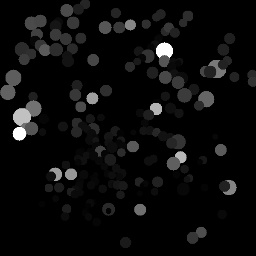

started processing: /home/rbain/Desktop/ali_data/m31r/s2/08_02_2023___11_00_31
started processing: /home/rbain/Desktop/ali_data/m31r/s2/08_03_2023___11_54_09
13400 images created so far!


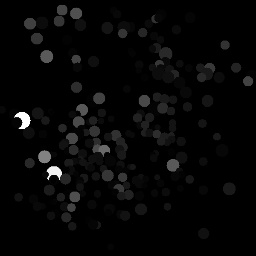

started processing: /home/rbain/Desktop/ali_data/m31r/s2/08_08_2023___12_19_49
started processing: /home/rbain/Desktop/ali_data/m31r/s2/08_09_2023___11_55_19
started processing: /home/rbain/Desktop/ali_data/m31r/s2/08_10_2023___09_36_43
13500 images created so far!


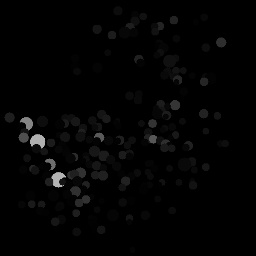

started processing: /home/rbain/Desktop/ali_data/m31r/s2/08_15_2023___11_01_03
13600 images created so far!


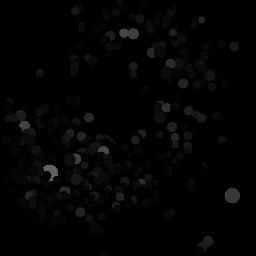

started processing: /home/rbain/Desktop/ali_data/m32l/s2/07_31_2023___10_54_35
started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_01_2023___12_13_12
13700 images created so far!


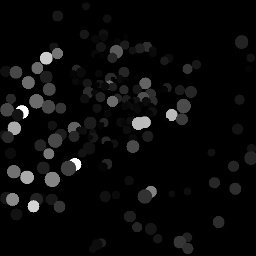

started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_02_2023___11_43_30
13800 images created so far!


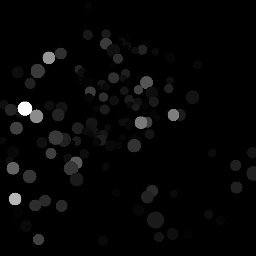

started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_04_2023___13_24_04
13900 images created so far!


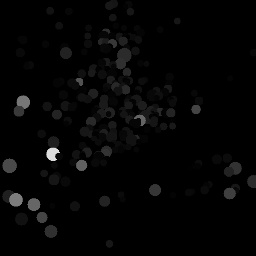

started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_08_2023___11_38_05
started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_09_2023___12_35_41
started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_10_2023___08_50_39
14000 images created so far!


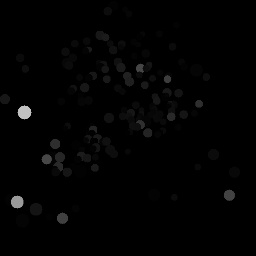

started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_11_2023___13_02_40
14100 images created so far!


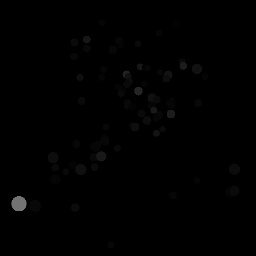

started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_14_2023___12_14_49
started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_15_2023___11_47_36
14200 images created so far!


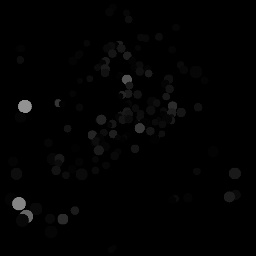

started processing: /home/rbain/Desktop/ali_data/m32l/s2/08_16_2023___11_18_18
14300 images created so far!


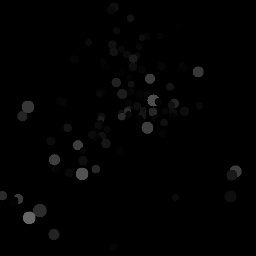

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_08_2023___11_36_13
started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_09_2023___12_32_55
started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_10_2023___08_48_41
14400 images created so far!


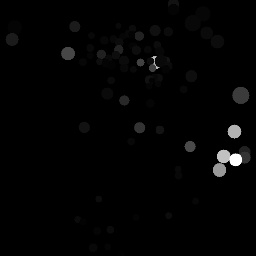

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_11_2023___13_00_23
14500 images created so far!


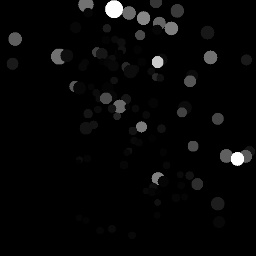

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_14_2023___12_13_00
14600 images created so far!


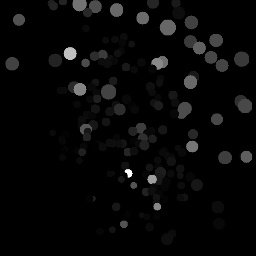

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_15_2023___11_45_01
14700 images created so far!


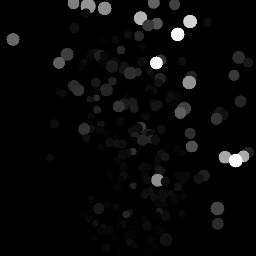

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_16_2023___11_16_07
14800 images created so far!


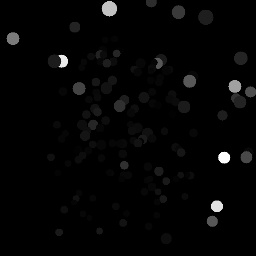

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_17_2023___13_21_18
14900 images created so far!


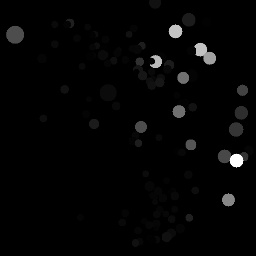

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_28_2023___11_26_14
15000 images created so far!


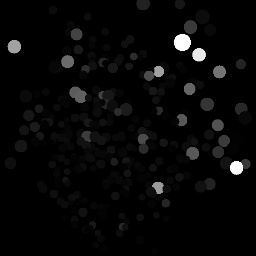

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_29_2023___14_23_54
15100 images created so far!


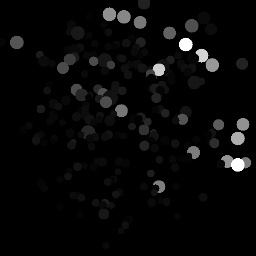

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_30_2023___13_55_16
15200 images created so far!


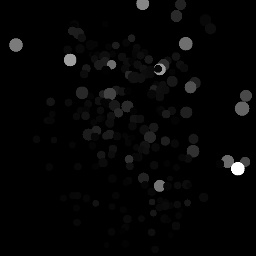

15300 images created so far!


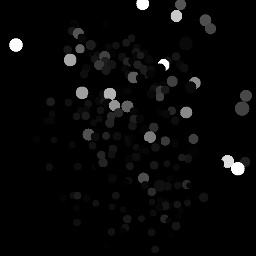

started processing: /home/rbain/Desktop/ali_data/m33r/s2/08_31_2023___11_12_53
15400 images created so far!


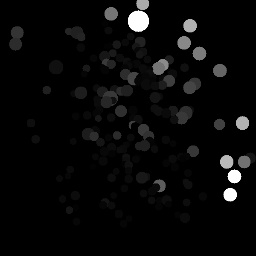

started processing: /home/rbain/Desktop/ali_data/m33r/s2/09_01_2023___12_22_25
started processing: /home/rbain/Desktop/ali_data/m33r/s2/09_11_2023___12_59_45
started processing: /home/rbain/Desktop/ali_data/m33r/s2/09_12_2023___12_44_56
started processing: /home/rbain/Desktop/ali_data/m33r/s2/09_14_2023___11_54_24
started processing: /home/rbain/Desktop/ali_data/m33r/s2/09_18_2023___14_17_49
started processing: /home/rbain/Desktop/ali_data/m33r/s2/09_19_2023___11_40_01
started processing: /home/rbain/Desktop/ali_data/m33r/s2/09_20_2023___13_53_27
started processing: /home/rbain/Desktop/ali_data/m36rr/s2/10_02_2023___12_44_34
started processing: /home/rbain/Desktop/ali_data/m36rr/s2/10_05_2023___08_51_27
started processing: /home/rbain/Desktop/ali_data/m36rr/s2/10_06_2023___12_53_20
started processing: /home/rbain/Desktop/ali_data/m36rr/s2/10_11_2023___09_52_23
started processing: /home/rbain/Desktop/ali_data/m37l/s2/10_04_2023___11_36_19
started processing: /home/rbain/Desktop/ali_data

In [116]:
import datetime
from PIL import Image
from IPython.display import display

# quick check that every mouse has the s2 data folder
for m_id in mice_ids:
  s2_dir = os.path.join(base_dir, m_id, 's2')
  mouse_has_s2 = os.path.isdir(s2_dir)
  assert mouse_has_s2, f'mouse {m_id} is missing s2 parent dir'

train_img_i = 0
# for seeing how learning occurred over training days
acc_csv = os.path.join(data_dir, f'acc.csv')
dnn_csv = os.path.join(data_dir, f'dataset.csv')
with open(acc_csv, 'w') as acc_data:
  acc_data.write("mouse id,session time,accuracy\n")
  with open(dnn_csv, 'w') as dnn_data:
    dnn_data.write("filename,mouse id,session time,stim direction,turn direction,correctness\n")
    for m_id in mice_ids:
      # parent dir with potentially multiple days of recordings
      s2_dir = os.path.join(base_dir, m_id, 's2')
      s2_days_unfiltered = os.listdir(s2_dir)
      s2_days = [] # for filtered version
      # keep just dirs; remove files
      for fn in s2_days_unfiltered:
        s2_day = os.path.join(base_dir, m_id, 's2', fn)
        if os.path.isdir(s2_day):
          s2_days.append(s2_day)
      assert len(s2_days) > 0, f'mouse {m_id} is missing s2 day dir'
      # sort days in chronological order
      s2_days_unordered = s2_days
      as_datetimes = []
      for day in s2_days_unordered:
        t = day.split("/")[-1]
        t = t.split("___")[0]
        MM = t.split("_")[0]
        DD = t.split("_")[1]
        YY = t.split("_")[2]
        dt = datetime.date(int(YY), int(MM), int(DD))
        as_datetimes.append(dt)

      # combine the parallel lists
      zipped_pairs = zip(as_datetimes, s2_days)
      # days sorted in chronological order now
      s2_days = [x for _, x in sorted(zipped_pairs)]

      # single day's s2 recording directory
      for s2_day in s2_days:
        num_trials_this_day = 0
        num_correct_trials = 0
        print(f'started processing: {s2_day}')
        # time is everything before final "/"
        t = s2_day.split("/")[-1]
        # load all the CSVs
        trial_pms_csv = os.path.join(s2_day, f'trial_parameters_{t}.csv')
        flourescence_csv = os.path.join(s2_day, f'calcium_raw_{t}.csv')
        cell_loc_csv = os.path.join(s2_day, 'cell_loc.csv')
        all_CSVs_exist = os.path.isfile(trial_pms_csv)
        all_CSVs_exist = all_CSVs_exist and os.path.isfile(flourescence_csv)
        all_CSVs_exist = all_CSVs_exist and os.path.isfile(cell_loc_csv)
        if not all_CSVs_exist:
          continue
        trial_pms = pd.read_csv(trial_pms_csv)
        flourescence = pd.read_csv(flourescence_csv)
        loc_and_size = pd.read_csv(cell_loc_csv)

        # find first clean turn_frame value (ie not NaN)
        i = -1 # allows us to increment at top of while loop
        while i < len(trial_pms.index) - 1:
          i += 1
          turn_frame = trial_pms.iloc[i]['turn_frame']
          # filter out the easier "Follow The Pattern" trials
          is_INIT = (trial_pms.iloc[i]['mode'] == "INIT")
          if is_INIT and (not np.isnan(turn_frame)):
            # represents the visual stimulus shown to the mouse
            stim_dir = trial_pms.iloc[i]['direction']
            turn_frame = int(turn_frame)
            num_trials_this_day += 1
            correct = trial_pms.iloc[i]['correctness']
            if correct == "correct":
              num_correct_trials += 1
              correct = 1
              turn_dir = stim_dir
            else:
              # incorrect turns mean that stim_dir and turn_dir are opposites
              correct = 0
              if stim_dir == 'L':
                turn_dir = 'R'
              elif stim_dir == 'R':
                turn_dir = 'L'

            # sanity check :)
            if stim_dir != 'L' and stim_dir != 'R':
              assert False, f'Improper stim direction: {stim_dir}'              
              
            # print(f'turn_frame: {turn_frame}')
            # print(f'stim_dir: {stim_dir}')

            train_img_i += 1
            # create black image
            img = np.zeros((600, 600, 3), dtype=np.uint8)
            num_cells = len(loc_and_size.index)
            for j in range(num_cells):
              x = loc_and_size.iloc[j]['center_x']
              y = loc_and_size.iloc[j]['center_y']
              center_pt = (int(x), int(y))
              size = loc_and_size.iloc[j]['size']
              # find radius of the perfect circle with the same size
              radius = math.sqrt(size / math.pi)
              radius *= 1.5
              radius = int(radius)
              num_pre_turn_frames = 20
              # calculate the color based on avg intensity 20 frames before turn
              start_i = turn_frame - num_pre_turn_frames
              # old way, for training to infer post-turn classifiers
              # post_turn_frames = flourescence.iloc[turn_frame:end_i][str(j)]
              pre_turn_frames = flourescence.iloc[start_i:turn_frame][str(j)]
              avg_f = pre_turn_frames.sum() / num_pre_turn_frames / max_f * 255
              # clip in case there's a slightly larger max_f
              avg_f = min(avg_f, 255)
              c = [avg_f, avg_f, avg_f]
              # thickness of -1 fills the whole circle instead of outlining
              cv2.circle(img, center_pt, radius, c, -1)

            small_img = cv2.resize(img, (256, 256))
            # 'L' will be class 0, 'R' will be class 1 (or vice versa)
            img_file = os.path.join(data_dir, f'{train_img_i}.jpg')
            cv2.imwrite(img_file, small_img)
            dnn_data.write(f'{train_img_i},{m_id},{t},{stim_dir},{turn_dir},{correct}\n')

            # print every 100th image
            if train_img_i % 100 == 0:
              print(f'{train_img_i} images created so far!')
              img = Image.open(img_file)
              display(img)

        if num_trials_this_day == 0:
          print(f'skipping {t} for {m_id}. No clean trials.')
        else:
          acc = num_correct_trials / num_trials_this_day
          acc_data.write(f"{m_id},{t},{acc}\n")


### PyTorch DataLoader loads our dataset.csv file

In [2]:
import os
import math
import torch
import random
import numpy as np
import pandas as pd
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset

# if the split would make it more than this number
# we will redistribute the extras to train instead
min_test_size = 15

class LocalizeDataset(Dataset):
    def __init__(self, src_dir, label_mode, train=True, transform=None, 
                 shuffle=False, split=0.85, _m_ids=False, dates=None, 
                 balance=True, **kwargs):
        # shuffle should be a seed value if not False
        good_label_mode = (label_mode == "stim_dir") or (label_mode == "turn_dir")
        good_label_mode = good_label_mode or (label_mode == "correctness")
        assert good_label_mode, 'label_mode can be "stim_dir", "turn_dir", or "correctness"'
        # m_ids and dates are parallel lists w/ ints and list of strings, respectively
        super().__init__(**kwargs)
        self.img_paths = []
        self.labels = []
        self.split = split
        self.transform = transform

        csv_f = os.path.join(src_dir, "dataset.csv")
        trials = pd.read_csv(csv_f, index_col=0)
        stim_dirs = trials[['stim direction']]
        turn_dirs = trials[['turn direction']]
        correct = trials[['correctness']]
        files = os.listdir(src_dir)
        img_files = [f for f in files if '.jpg' in f]
        if _m_ids:
            img_files = []
            # filter out any mice not listed
            for list_i, m_id in enumerate(_m_ids):
                for idx in range(len(trials)):
                    if m_id == trials['mouse id'].iloc[idx]:
                        assert dates != False, "you're using old code"
                        if type(dates) == type(None):
                            fn_base = str(idx + 1) + '.jpg'
                            file_name = os.path.join(src_dir, fn_base)
                            img_files.append(file_name)
                        else:
                            this_m_dates = dates[list_i]
                            if idx == 0:
                                print(f'this_m_dates: {this_m_dates}')
                            trial_date = trials['session time'].iloc[idx]
                            if trial_date in this_m_dates:
                                fn_base = str(idx + 1) + '.jpg'
                                file_name = os.path.join(src_dir, fn_base)
                                img_files.append(file_name)

        # remove duplicates
        img_files = list(set(img_files))
        assert len(img_files) > 0, "no images found :("

        idxs = []
        for img_f in img_files:
            idx = img_f.replace('.jpg', '').split('/')[-1]
            idxs.append(int(idx))
        idxs = sorted(idxs)
        if shuffle:
            err_txt = 'shuffle should be a seed value if not False'
            assert type(shuffle) == type(0), err_txt
            random.Random(shuffle).shuffle(idxs)

        # Number of each labels. Used in balancing
        n_l1 = 0
        n_l2 = 0
        for idx in idxs:
            img = os.path.join(src_dir, f'{idx}.jpg')
            self.img_paths.append(img)
            sd = stim_dirs.loc[idx].to_numpy()
            td = turn_dirs.loc[idx].to_numpy()
            c = correct.loc[idx].to_numpy()
            if label_mode == "stim_dir":
                if sd == 'L':
                    l = [0,1]
                    n_l1 += 1
                elif sd == 'R':
                    l = [1,0]
                    n_l2 += 1
                else:
                    assert False, f'Improper stim direction: {sd}'
            elif label_mode == "correctness":
                if c == 0:
                    l = [0,1]
                    n_l1 += 1
                elif c == 1:
                    l = [1,0]
                    n_l2 += 1
                else:
                    assert False, f'Improper correctness value: {c}'
            elif label_mode == "turn_dir":
                if td == 'L':
                    l = [0,1]
                    n_l1 += 1
                elif td == 'R':
                    l = [1,0]
                    n_l2 += 1
                else:
                    assert False, f'Improper turn direction: {td}'
            self.labels.append(l)

        print(f'n_l1: {n_l1}')
        print(f'n_l2: {n_l2}')
        
        # roughly class balance (e.g. 60-40 is ok)
        if balance:
            # the bigger one is the majority percent
            if n_l1 > n_l2:
                n_maj_perc = n_l1
                maj_perc = n_l1 / (n_l1 + n_l2)
                trim_label = [0,1]
            else:
                n_maj_perc = n_l2
                maj_perc = n_l2 / (n_l1 + n_l2)
                trim_label = [1,0]

            
            if maj_perc <= 0.60:
                print("dataset already roughly class balanced :)")
            else:
                # calculate how many to delete to make it 60%-40%
                excess = math.ceil(n_maj_perc * 1.5) # (60% is 1.5x 40%)
                bal_labels, bal_imgs = [], []
                for i,l in enumerate(self.labels):
                    if l == trim_label:
                        excess -= 1
                        if excess == 0:
                            break
                        continue
                    bal_labels.append(l)
                    bal_imgs.append(self.img_paths[i])
            
                n_rm = len(self.labels) - len(bal_labels)
                print(f'{n_rm} data points removed to be roughly class balanced.')
                self.labels = bal_labels
                self.img_paths = bal_imgs
                err_txt = "each image needs a label"
                assert len(self.labels) == len(self.img_paths), err_txt
        
        self.img_paths = np.array(self.img_paths)
        self.labels = torch.FloatTensor(np.array(self.labels))

        train_idx = int(len(self.labels) * self.split)
        # if we have more than the minimum required test examples
        # then redistribute the excess to the training split
        excess = len(self.labels) - train_idx - min_test_size
        if excess > 0:
            train_idx += excess

        if train:
            self.img_paths = self.img_paths[:train_idx]
            self.labels = self.labels[:train_idx]
            print(f'number of train images: {len(self.img_paths)}')
        else:
            self.img_paths = self.img_paths[train_idx:]
            self.labels = self.labels[train_idx:]
            print(f'number of val images: {len(self.img_paths)}')

        if excess > 0 and not train:
            assert len(self.labels) == min_test_size

    def _pil_loader(self, path):
        with open(path, "rb") as f:
            img = Image.open(f)
            img = img.convert("RGB")
            img = transforms.functional.pil_to_tensor(img)
            img = img.type(torch.float32) / 255
            return img

    def __len__(self):
        return len(self.img_paths)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        img = self._pil_loader(self.img_paths[idx])
        l = self.labels[idx]
        if self.transform is not None:
            img = self.transform(img)
        return img, l

### Calculate the normalization parameters for the images:

In [3]:
import torch
from torchvision import datasets

def get_norm_pms(m_ids, dates):
    all_data = LocalizeDataset(data_dir, label_mode="stim_dir", transform=None, 
                               split=1.0, _m_ids=m_ids, dates=dates)
    dataloader = torch.utils.data.DataLoader(all_data, batch_size=10)

    ch_means = np.array([0,0,0])
    ch_stds = np.array([0,0,0])
    i = 0
    for imgs, _l in dataloader:
        i += 1
        ch_mean = imgs.reshape(3,-1).mean(axis=1).numpy()
        ch_means = np.sum([ch_means, ch_mean], axis=0)
        ch_std = imgs.reshape(3,-1).std(axis=1).numpy()
        ch_stds = np.sum([ch_stds, ch_std], axis=0)

    # normalize i.e. find the avg
    ch_means = ch_means / i
    ch_stds = ch_stds / i
    print(f'channel means: {ch_means}')
    print(f'channel stdevs: {ch_stds}')

    return ch_means, ch_stds

### Checking that classes (i.e. left vs right turns) are roughly balanced
Currently only works for visual stimulus direction.

In [ ]:
csv_f = os.path.join(data_dir, "dataset.csv")
trials = pd.read_csv(csv_f, index_col=0)
labels = trials['stim direction']
sum = 0
for turn_dir in labels:
  if turn_dir == 'R':
    sum += 1
print(sum / len(labels))

0.49079595540575577


### Training and testing transfer learning on a resnet18 modified for binary classification

In [4]:
import os
import time
import torch
import torchvision
import numpy as np
from PIL import Image
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
from torchvision import transforms as T
from torchvision import datasets, models
from matplotlib.gridspec import GridSpec

assert torch.cuda.is_available(), "GPU not found!"
device = torch.device("cuda:1")

def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array(ch_means)
    std = np.array(ch_stds)
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

def train_model(model, save_dir, train_dl, test_dl, criterion, 
                optimizer, scheduler, num_epochs=1, save_curves=True):
    start_time = time.time()
    best_train_loss = 1e8
    best_val_loss = 1e8
    best_model_train_params_path = os.path.join(save_dir, "best_train_params.pt")
    best_model_val_params_path = os.path.join(save_dir, "best_val_params.pt")
    curves_path = os.path.join(save_dir, "learning_curves.png")

    train_curve, val_curve = [], []
    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        model.eval() # to work with logic right below
        # Each epoch has a training and validation phase
        for _p in ['train', 'val']:
            # switch between train & eval on successive runs
            if model.training:
                phase = "val"
                model.eval()
                dataloader = test_dl
            else:
                phase = 'train'
                model.train()
                dataloader = train_dl

            running_loss = 0.0
            num_instances = 0
            
            # Iterate over data.
            for inputs, labels in dataloader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad() # reset gradients
                # forward
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, labels)
                    # backward
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                running_loss += loss.item() * inputs.size(0)
                num_instances += inputs.size(0)

            if phase == 'train' and scheduler != None:
                scheduler.step()

            epoch_loss = running_loss / num_instances
            if phase == 'train':
                train_curve.append(epoch_loss)
            else:
                val_curve.append(epoch_loss)
            
            print(f'{phase} Loss: {epoch_loss:.4f}')

            # deep copy the model
            if phase == 'train' and epoch_loss < best_train_loss:
                best_train_loss = epoch_loss
                torch.save(model.state_dict(), best_model_train_params_path)
                print("new best train!")
            if phase == 'val' and epoch_loss < best_val_loss:
                best_val_loss = epoch_loss
                torch.save(model.state_dict(), best_model_val_params_path)
                print("new best val!")

        print("")

    time_elapsed = time.time() - start_time
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

    if save_curves:
        # save learning curves
        fig = plt.figure()
        ax = plt.subplot()
        x = list(range(1, num_epochs+1))
        ax.plot(x, train_curve, label="training")
        ax.plot(x, val_curve, label="validation")
        plt.title("Learning Curves")
        plt.xlabel("Training Epochs")
        plt.ylabel("Avg Instance Loss")
        plt.legend(loc="best")
        plt.tight_layout()
        plt.savefig(curves_path)
    
    # load best train_model weights
    best_train_model = torchvision.models.resnet18(weights=None)
    num_ftrs = best_train_model.fc.in_features
    best_train_model.fc = nn.Sequential(
        nn.Linear(num_ftrs, 2),
        nn.Softmax(),
    )
    best_train_model = best_train_model.to(device)
    w = torch.load(best_model_train_params_path, weights_only=True)
    best_train_model.load_state_dict(w)
    # load best val_model weights
    best_val_model = torchvision.models.resnet18(weights=None)
    best_val_model.fc = nn.Sequential(
        nn.Linear(num_ftrs, 2),
        nn.Softmax(),
    )
    best_val_model = best_val_model.to(device)
    w = torch.load(best_model_val_params_path, weights_only=True)
    best_val_model.load_state_dict(w)

    return best_train_model, best_val_model

def visualize_model(model, dataloader, num_images=16, split='val'):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//4, 4, images_so_far)
                ax.axis('off')
                guess = outputs[j].cpu().tolist()
                label = labels[j].cpu().tolist()
                if guess[0] > 0.5:
                  guess = 'R'
                else:
                  guess = 'L'
                if label[0] == 0:
                  label = 'L'
                else:
                  label = 'R'
                title = f'Predicted: {guess} \nGT: {label}'
                ax.set_title(title, fontsize=8)
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return

        model.train(mode=was_training)

def get_acc(model, dataloader, split):
    was_training = model.training
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloader):
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            for j in range(inputs.size()[0]):
                guess = outputs[j].cpu().tolist()
                label = labels[j].cpu().tolist()
                if guess[0] > 0.5:
                  guess = 'R'
                else:
                  guess = 'L'
                if label[0] == 0:
                  label = 'L'
                else:
                  label = 'R'
                total += 1
                if guess == label:
                  correct += 1

        model.train(mode=was_training)
        print(f'number correct: {correct}')
        print(f'total number: {total}')
        test_acc = correct / total * 100
        print(f'{split} accuracy: {test_acc:.1f}')
        return test_acc

### TRAINING


this_m_dates: 05_23_2022___13_10_04
n_l1: 29
n_l2: 3
29 data points removed to be roughly class balanced.
number of train images: 0
minimum number of training images: 90
skipping m9r on 05_23_2022___13_10_04

this_m_dates: 05_20_2022___15_58_30
n_l1: 65
n_l2: 31
65 data points removed to be roughly class balanced.
number of train images: 16
minimum number of training images: 90
skipping m9r on 05_20_2022___15_58_30

this_m_dates: 05_19_2022___14_54_17
n_l1: 48
n_l2: 23
48 data points removed to be roughly class balanced.
number of train images: 8
minimum number of training images: 90
skipping m9r on 05_19_2022___14_54_17

this_m_dates: 05_26_2022___13_46_39
n_l1: 40
n_l2: 9
40 data points removed to be roughly class balanced.
number of train images: 0
minimum number of training images: 90
skipping m9r on 05_26_2022___13_46_39

this_m_dates: 05_24_2022___11_33_56
n_l1: 43
n_l2: 5
43 data points removed to be roughly class balanced.
number of train images: 0
minimum number of training i

Previously trained model results found. Overwrite? [Y/n]  Y


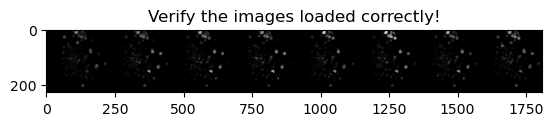

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7206
new best train!
val Loss: 0.6882
new best val!

Epoch 1/29
----------
train Loss: 0.5313
new best train!
val Loss: 0.6934

Epoch 2/29
----------
train Loss: 0.4269
new best train!
val Loss: 0.6937

Epoch 3/29
----------
train Loss: 0.3650
new best train!
val Loss: 0.6968

Epoch 4/29
----------
train Loss: 0.3357
new best train!
val Loss: 0.6953

Epoch 5/29
----------
train Loss: 0.3264
new best train!
val Loss: 0.6938

Epoch 6/29
----------
train Loss: 0.3182
new best train!
val Loss: 0.6978

Epoch 7/29
----------
train Loss: 0.3166
new best train!
val Loss: 0.7060

Epoch 8/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.7081

Epoch 9/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7105

Epoch 10/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.7115

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7129

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7110

Epoch 13/29
----------
train L

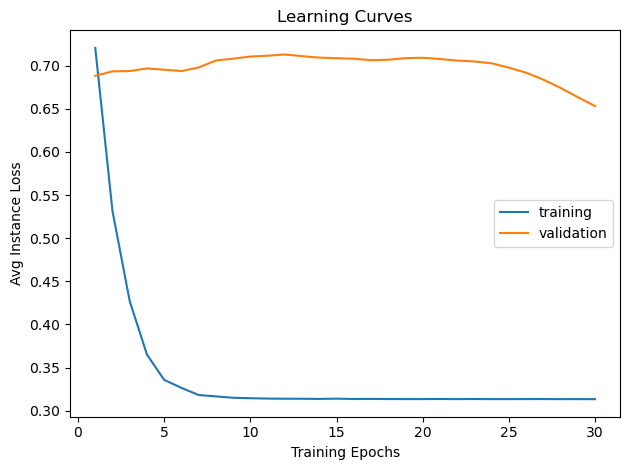

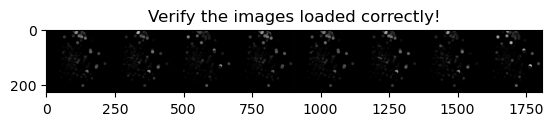

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7028
new best train!
val Loss: 0.6872
new best val!

Epoch 1/29
----------
train Loss: 0.5475
new best train!
val Loss: 0.6927

Epoch 2/29
----------
train Loss: 0.4400
new best train!
val Loss: 0.6983

Epoch 3/29
----------
train Loss: 0.3704
new best train!
val Loss: 0.6869
new best val!

Epoch 4/29
----------
train Loss: 0.3441
new best train!
val Loss: 0.6655
new best val!

Epoch 5/29
----------
train Loss: 0.3237
new best train!
val Loss: 0.6486
new best val!

Epoch 6/29
----------
train Loss: 0.3191
new best train!
val Loss: 0.6487

Epoch 7/29
----------
train Loss: 0.3168
new best train!
val Loss: 0.6627

Epoch 8/29
----------
train Loss: 0.3159
new best train!
val Loss: 0.6819

Epoch 9/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.6977

Epoch 10/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.7117

Epoch 11/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.7119

Epoch 12/29
----------
train Loss: 0.3139
new best train!
val Lo

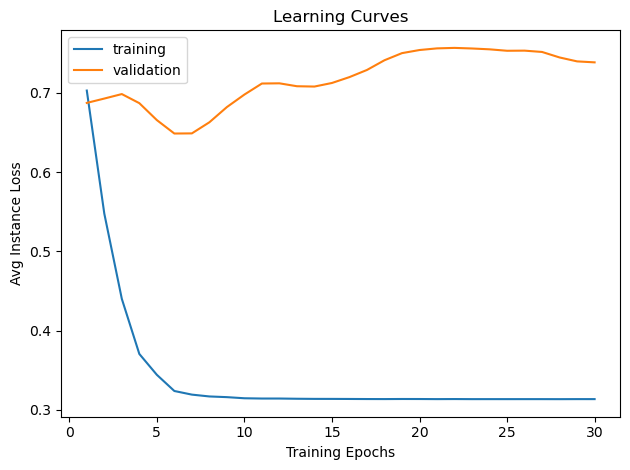

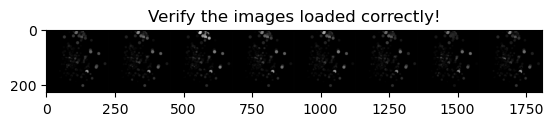

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7374
new best train!
val Loss: 0.6958
new best val!

Epoch 1/29
----------
train Loss: 0.5521
new best train!
val Loss: 0.6862
new best val!

Epoch 2/29
----------
train Loss: 0.4277
new best train!
val Loss: 0.6889

Epoch 3/29
----------
train Loss: 0.3626
new best train!
val Loss: 0.6945

Epoch 4/29
----------
train Loss: 0.3320
new best train!
val Loss: 0.6950

Epoch 5/29
----------
train Loss: 0.3224
new best train!
val Loss: 0.6950

Epoch 6/29
----------
train Loss: 0.3185
new best train!
val Loss: 0.7033

Epoch 7/29
----------
train Loss: 0.3161
new best train!
val Loss: 0.7229

Epoch 8/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.7457

Epoch 9/29
----------
train Loss: 0.3151
val Loss: 0.7628

Epoch 10/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.7724

Epoch 11/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7736

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7748

Epoch 13/29
----------
train Los

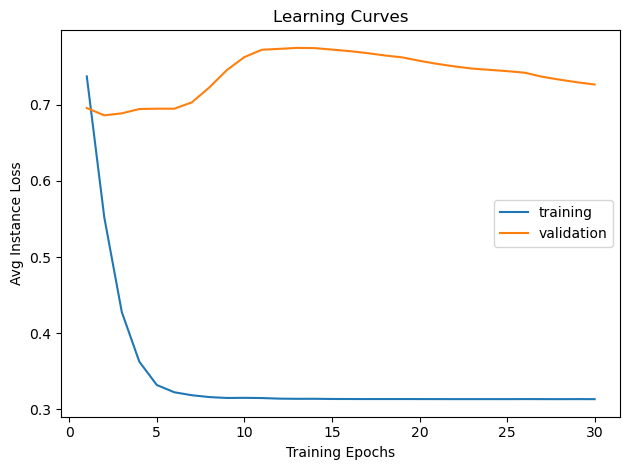

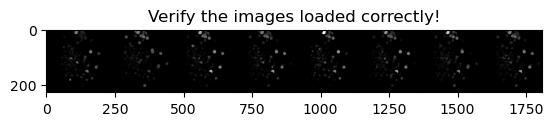

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7041
new best train!
val Loss: 0.7022
new best val!

Epoch 1/29
----------
train Loss: 0.5523
new best train!
val Loss: 0.6914
new best val!

Epoch 2/29
----------
train Loss: 0.4431
new best train!
val Loss: 0.6917

Epoch 3/29
----------
train Loss: 0.3832
new best train!
val Loss: 0.6825
new best val!

Epoch 4/29
----------
train Loss: 0.3445
new best train!
val Loss: 0.6653
new best val!

Epoch 5/29
----------
train Loss: 0.3276
new best train!
val Loss: 0.6631
new best val!

Epoch 6/29
----------
train Loss: 0.3218
new best train!
val Loss: 0.6788

Epoch 7/29
----------
train Loss: 0.3171
new best train!
val Loss: 0.6882

Epoch 8/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.6939

Epoch 9/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.6964

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.6977

Epoch 11/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.6975

Epoch 12/29
----------
train Loss: 0.3139
new best

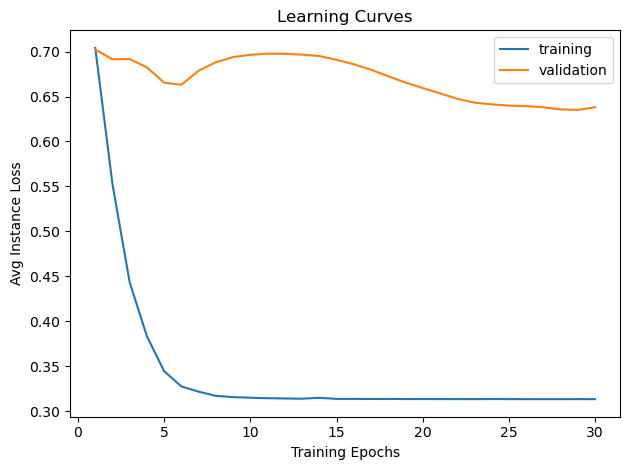

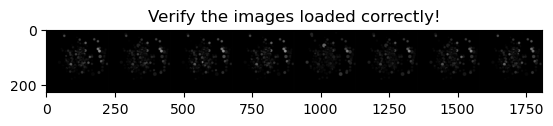

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7018
new best train!
val Loss: 0.6918
new best val!

Epoch 1/29
----------
train Loss: 0.5422
new best train!
val Loss: 0.6740
new best val!

Epoch 2/29
----------
train Loss: 0.4479
new best train!
val Loss: 0.6672
new best val!

Epoch 3/29
----------
train Loss: 0.3911
new best train!
val Loss: 0.6703

Epoch 4/29
----------
train Loss: 0.3578
new best train!
val Loss: 0.6662
new best val!

Epoch 5/29
----------
train Loss: 0.3389
new best train!
val Loss: 0.6669

Epoch 6/29
----------
train Loss: 0.3278
new best train!
val Loss: 0.6689

Epoch 7/29
----------
train Loss: 0.3195
new best train!
val Loss: 0.6679

Epoch 8/29
----------
train Loss: 0.3182
new best train!
val Loss: 0.6699

Epoch 9/29
----------
train Loss: 0.3179
new best train!
val Loss: 0.6776

Epoch 10/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.6869

Epoch 11/29
----------
train Loss: 0.3148
val Loss: 0.6941

Epoch 12/29
----------
train Loss: 0.3170
val Loss: 0.6979

Epoch 13/29
--------

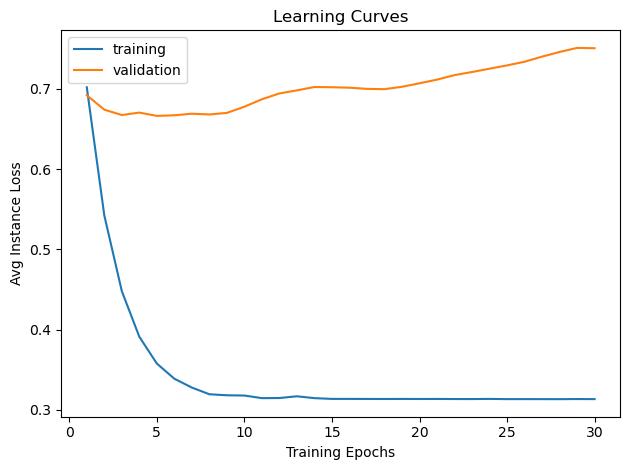

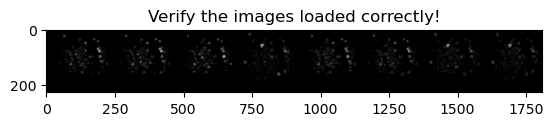

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6835
new best train!
val Loss: 0.8026
new best val!

Epoch 1/29
----------
train Loss: 0.5880
new best train!
val Loss: 0.7406
new best val!

Epoch 2/29
----------
train Loss: 0.4907
new best train!
val Loss: 0.7087
new best val!

Epoch 3/29
----------
train Loss: 0.4167
new best train!
val Loss: 0.7058
new best val!

Epoch 4/29
----------
train Loss: 0.3705
new best train!
val Loss: 0.6850
new best val!

Epoch 5/29
----------
train Loss: 0.3426
new best train!
val Loss: 0.6823
new best val!

Epoch 6/29
----------
train Loss: 0.3264
new best train!
val Loss: 0.7002

Epoch 7/29
----------
train Loss: 0.3204
new best train!
val Loss: 0.6882

Epoch 8/29
----------
train Loss: 0.3168
new best train!
val Loss: 0.6965

Epoch 9/29
----------
train Loss: 0.3155
new best train!
val Loss: 0.7439

Epoch 10/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.8109

Epoch 11/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.8688

Epoch 12/29
----------
train Loss: 0

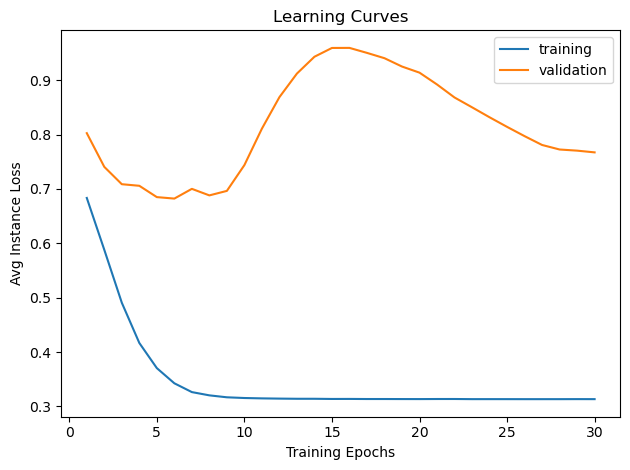

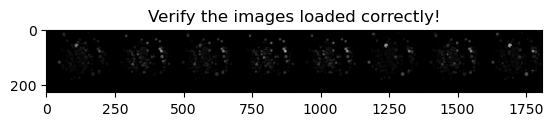

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6914
new best train!
val Loss: 0.6638
new best val!

Epoch 1/29
----------
train Loss: 0.5717
new best train!
val Loss: 0.6588
new best val!

Epoch 2/29
----------
train Loss: 0.4869
new best train!
val Loss: 0.6585
new best val!

Epoch 3/29
----------
train Loss: 0.4116
new best train!
val Loss: 0.6653

Epoch 4/29
----------
train Loss: 0.3686
new best train!
val Loss: 0.6698

Epoch 5/29
----------
train Loss: 0.3397
new best train!
val Loss: 0.6695

Epoch 6/29
----------
train Loss: 0.3252
new best train!
val Loss: 0.6700

Epoch 7/29
----------
train Loss: 0.3188
new best train!
val Loss: 0.6670

Epoch 8/29
----------
train Loss: 0.3174
new best train!
val Loss: 0.6626

Epoch 9/29
----------
train Loss: 0.3162
new best train!
val Loss: 0.6625

Epoch 10/29
----------
train Loss: 0.3156
new best train!
val Loss: 0.6672

Epoch 11/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.6750

Epoch 12/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.6870

Ep

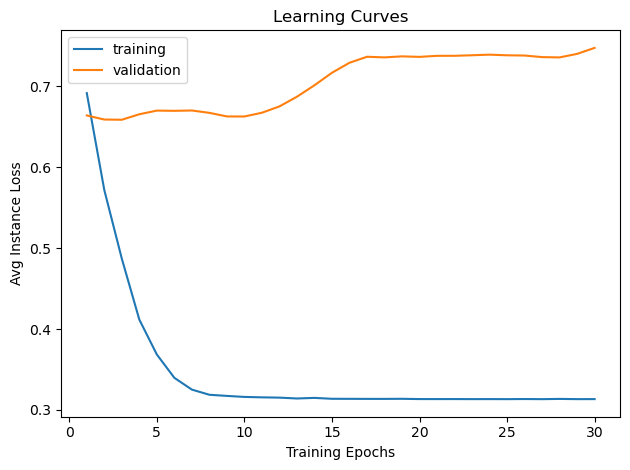

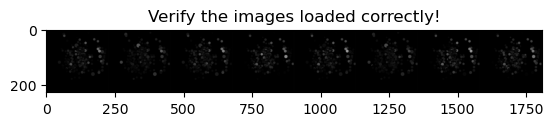

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6823
new best train!
val Loss: 0.6817
new best val!

Epoch 1/29
----------
train Loss: 0.5509
new best train!
val Loss: 0.6787
new best val!

Epoch 2/29
----------
train Loss: 0.4935
new best train!
val Loss: 0.6726
new best val!

Epoch 3/29
----------
train Loss: 0.3966
new best train!
val Loss: 0.6594
new best val!

Epoch 4/29
----------
train Loss: 0.3691
new best train!
val Loss: 0.6563
new best val!

Epoch 5/29
----------
train Loss: 0.3471
new best train!
val Loss: 0.6547
new best val!

Epoch 6/29
----------
train Loss: 0.3311
new best train!
val Loss: 0.6549

Epoch 7/29
----------
train Loss: 0.3248
new best train!
val Loss: 0.6529
new best val!

Epoch 8/29
----------
train Loss: 0.3195
new best train!
val Loss: 0.6514
new best val!

Epoch 9/29
----------
train Loss: 0.3180
new best train!
val Loss: 0.6554

Epoch 10/29
----------
train Loss: 0.3186
val Loss: 0.6562

Epoch 11/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.6617

Epoch 12/29
----------
t

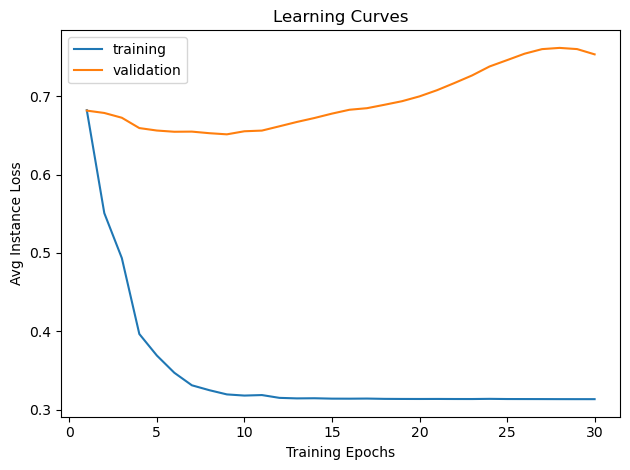

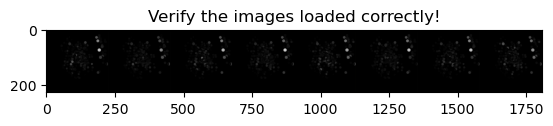

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6794
new best train!
val Loss: 0.7188
new best val!

Epoch 1/29
----------
train Loss: 0.4786
new best train!
val Loss: 0.7203

Epoch 2/29
----------
train Loss: 0.3819
new best train!
val Loss: 0.7141
new best val!

Epoch 3/29
----------
train Loss: 0.3388
new best train!
val Loss: 0.6886
new best val!

Epoch 4/29
----------
train Loss: 0.3259
new best train!
val Loss: 0.6660
new best val!

Epoch 5/29
----------
train Loss: 0.3222
new best train!
val Loss: 0.6526
new best val!

Epoch 6/29
----------
train Loss: 0.3158
new best train!
val Loss: 0.6446
new best val!

Epoch 7/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.6581

Epoch 8/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.6741

Epoch 9/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7048

Epoch 10/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7463

Epoch 11/29
----------
train Loss: 0.3136
new best train!
val Loss: 0.7748

Epoch 12/29
----------
train Loss: 0

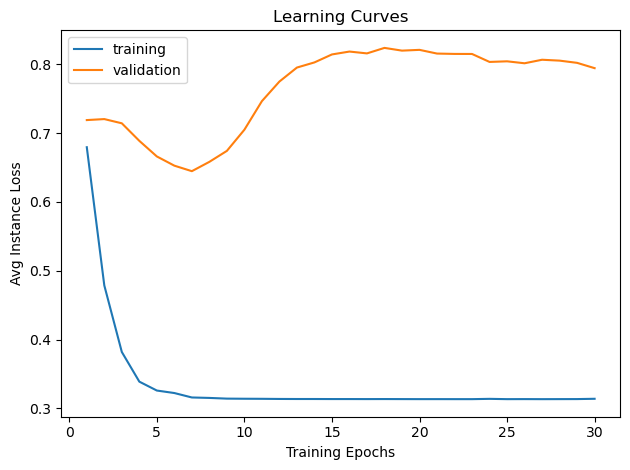

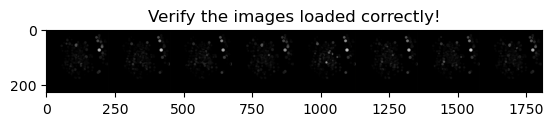

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6990
new best train!
val Loss: 0.7161
new best val!

Epoch 1/29
----------
train Loss: 0.4826
new best train!
val Loss: 0.7188

Epoch 2/29
----------
train Loss: 0.3868
new best train!
val Loss: 0.7341

Epoch 3/29
----------
train Loss: 0.3423
new best train!
val Loss: 0.7477

Epoch 4/29
----------
train Loss: 0.3270
new best train!
val Loss: 0.7595

Epoch 5/29
----------
train Loss: 0.3204
new best train!
val Loss: 0.7743

Epoch 6/29
----------
train Loss: 0.3163
new best train!
val Loss: 0.7879

Epoch 7/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.8032

Epoch 8/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.8154

Epoch 9/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.8245

Epoch 10/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.8281

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.8290

Epoch 12/29
----------
train Loss: 0.3139
val Loss: 0.8306

Epoch 13/29
----------
train Loss: 0.3136
new 

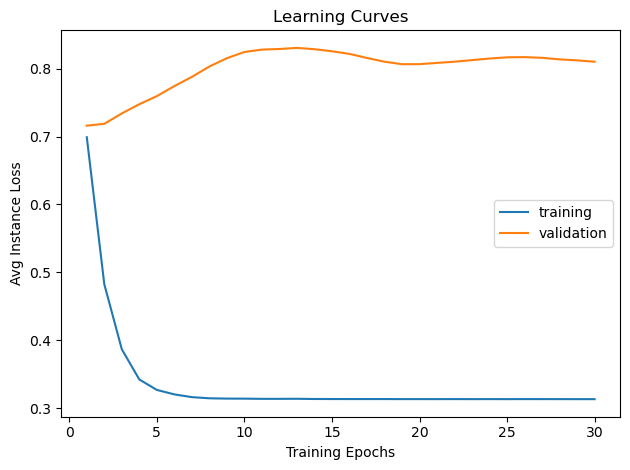

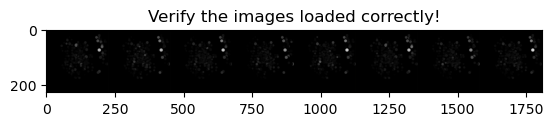

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7041
new best train!
val Loss: 0.7935
new best val!

Epoch 1/29
----------
train Loss: 0.5092
new best train!
val Loss: 0.7482
new best val!

Epoch 2/29
----------
train Loss: 0.3962
new best train!
val Loss: 0.7062
new best val!

Epoch 3/29
----------
train Loss: 0.3615
new best train!
val Loss: 0.6439
new best val!

Epoch 4/29
----------
train Loss: 0.3323
new best train!
val Loss: 0.5967
new best val!

Epoch 5/29
----------
train Loss: 0.3226
new best train!
val Loss: 0.5802
new best val!

Epoch 6/29
----------
train Loss: 0.3180
new best train!
val Loss: 0.5793
new best val!

Epoch 7/29
----------
train Loss: 0.3158
new best train!
val Loss: 0.5830

Epoch 8/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.5864

Epoch 9/29
----------
train Loss: 0.3155
val Loss: 0.5907

Epoch 10/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.5941

Epoch 11/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.6039

Epoch 12/29
----------
train Loss: 0.3

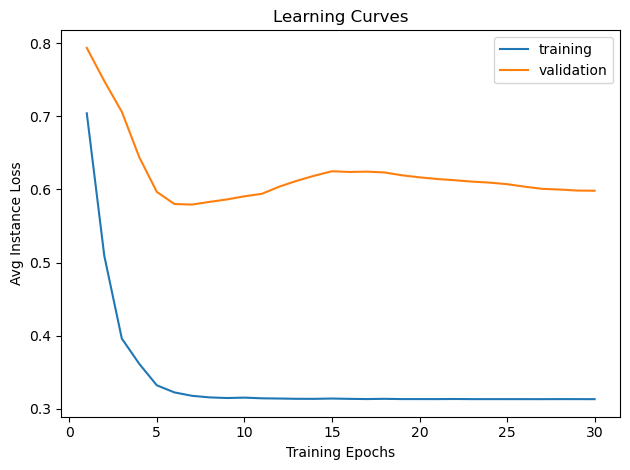

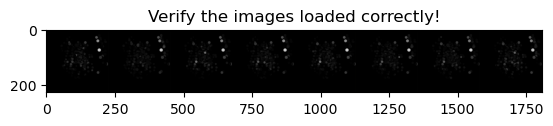

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7154
new best train!
val Loss: 0.6914
new best val!

Epoch 1/29
----------
train Loss: 0.4804
new best train!
val Loss: 0.6870
new best val!

Epoch 2/29
----------
train Loss: 0.3935
new best train!
val Loss: 0.6876

Epoch 3/29
----------
train Loss: 0.3430
new best train!
val Loss: 0.6864
new best val!

Epoch 4/29
----------
train Loss: 0.3361
new best train!
val Loss: 0.7054

Epoch 5/29
----------
train Loss: 0.3193
new best train!
val Loss: 0.7304

Epoch 6/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.7570

Epoch 7/29
----------
train Loss: 0.3172
val Loss: 0.7671

Epoch 8/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.7664

Epoch 9/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7585

Epoch 10/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7541

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7504

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7464

Epoch 13/29
------

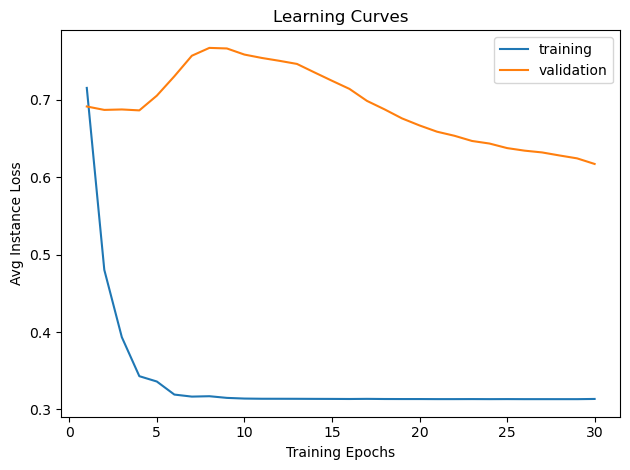

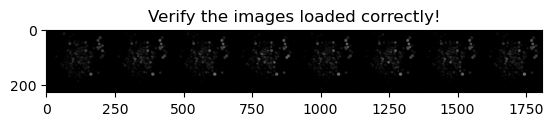

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7018
new best train!
val Loss: 0.6856
new best val!

Epoch 1/29
----------
train Loss: 0.4804
new best train!
val Loss: 0.6924

Epoch 2/29
----------
train Loss: 0.3859
new best train!
val Loss: 0.7013

Epoch 3/29
----------
train Loss: 0.3361
new best train!
val Loss: 0.7165

Epoch 4/29
----------
train Loss: 0.3257
new best train!
val Loss: 0.7511

Epoch 5/29
----------
train Loss: 0.3194
new best train!
val Loss: 0.7908

Epoch 6/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.8281

Epoch 7/29
----------
train Loss: 0.3163
new best train!
val Loss: 0.8602

Epoch 8/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.8784

Epoch 9/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.8908

Epoch 10/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.8968

Epoch 11/29
----------
train Loss: 0.3148
val Loss: 0.9015

Epoch 12/29
----------
train Loss: 0.3136
new best train!
val Loss: 0.9020

Epoch 13/29
----------
train Loss: 0.3136
val 

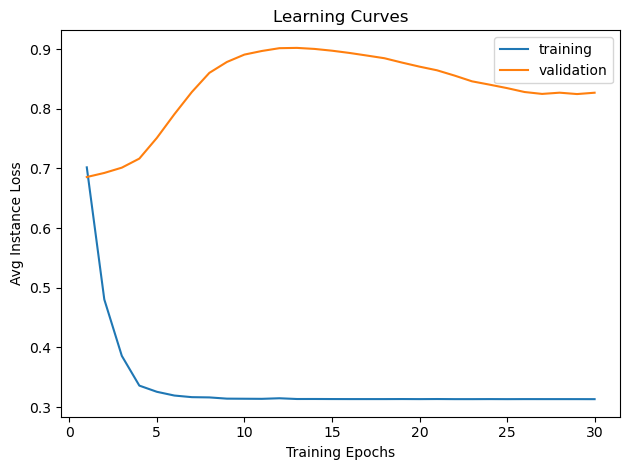

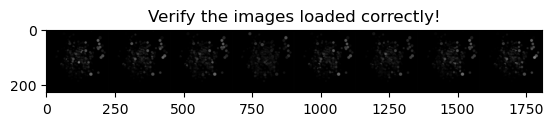

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6982
new best train!
val Loss: 0.7063
new best val!

Epoch 1/29
----------
train Loss: 0.4754
new best train!
val Loss: 0.7004
new best val!

Epoch 2/29
----------
train Loss: 0.3820
new best train!
val Loss: 0.6945
new best val!

Epoch 3/29
----------
train Loss: 0.3400
new best train!
val Loss: 0.6979

Epoch 4/29
----------
train Loss: 0.3269
new best train!
val Loss: 0.6987

Epoch 5/29
----------
train Loss: 0.3184
new best train!
val Loss: 0.6931
new best val!

Epoch 6/29
----------
train Loss: 0.3163
new best train!
val Loss: 0.6891
new best val!

Epoch 7/29
----------
train Loss: 0.3154
new best train!
val Loss: 0.6875
new best val!

Epoch 8/29
----------
train Loss: 0.3158
val Loss: 0.6897

Epoch 9/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.6919

Epoch 10/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.6900

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.6907

Epoch 12/29
----------
train Loss: 0.3137
new best t

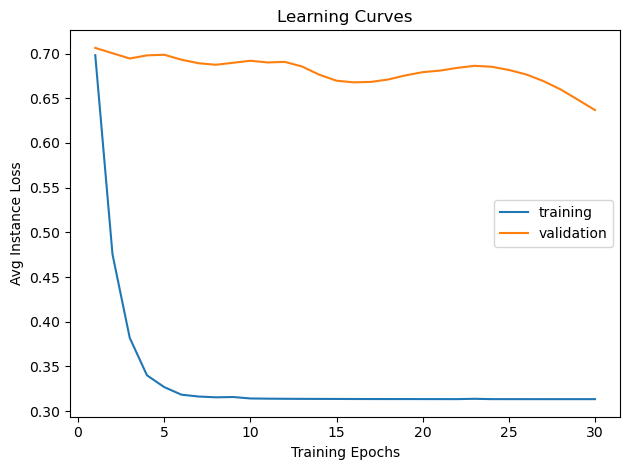

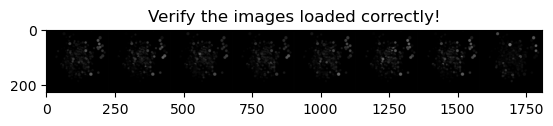

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7182
new best train!
val Loss: 0.7041
new best val!

Epoch 1/29
----------
train Loss: 0.5004
new best train!
val Loss: 0.7020
new best val!

Epoch 2/29
----------
train Loss: 0.4040
new best train!
val Loss: 0.7038

Epoch 3/29
----------
train Loss: 0.3530
new best train!
val Loss: 0.6951
new best val!

Epoch 4/29
----------
train Loss: 0.3318
new best train!
val Loss: 0.6828
new best val!

Epoch 5/29
----------
train Loss: 0.3218
new best train!
val Loss: 0.6669
new best val!

Epoch 6/29
----------
train Loss: 0.3177
new best train!
val Loss: 0.6502
new best val!

Epoch 7/29
----------
train Loss: 0.3158
new best train!
val Loss: 0.6301
new best val!

Epoch 8/29
----------
train Loss: 0.3158
val Loss: 0.6195
new best val!

Epoch 9/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.6179
new best val!

Epoch 10/29
----------
train Loss: 0.3149
val Loss: 0.6173
new best val!

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.6165
new best val!

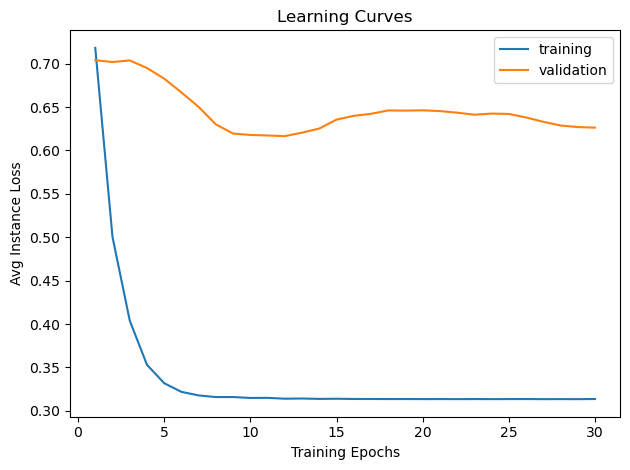

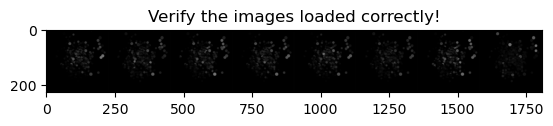

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7036
new best train!
val Loss: 0.6865
new best val!

Epoch 1/29
----------
train Loss: 0.4909
new best train!
val Loss: 0.6816
new best val!

Epoch 2/29
----------
train Loss: 0.3891
new best train!
val Loss: 0.6778
new best val!

Epoch 3/29
----------
train Loss: 0.3439
new best train!
val Loss: 0.6725
new best val!

Epoch 4/29
----------
train Loss: 0.3289
new best train!
val Loss: 0.6641
new best val!

Epoch 5/29
----------
train Loss: 0.3201
new best train!
val Loss: 0.6485
new best val!

Epoch 6/29
----------
train Loss: 0.3176
new best train!
val Loss: 0.6205
new best val!

Epoch 7/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.5992
new best val!

Epoch 8/29
----------
train Loss: 0.3159
val Loss: 0.5806
new best val!

Epoch 9/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.5674
new best val!

Epoch 10/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.5574
new best val!

Epoch 11/29
----------
train Loss: 0.3140
new best train!


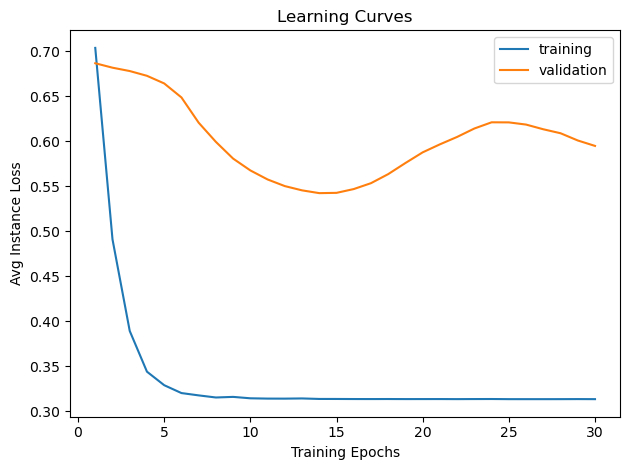

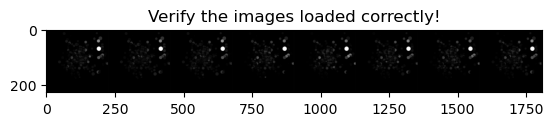

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6640
new best train!
val Loss: 0.9123
new best val!

Epoch 1/29
----------
train Loss: 0.4823
new best train!
val Loss: 0.9246

Epoch 2/29
----------
train Loss: 0.3928
new best train!
val Loss: 0.9335

Epoch 3/29
----------
train Loss: 0.3464
new best train!
val Loss: 0.9401

Epoch 4/29
----------
train Loss: 0.3282
new best train!
val Loss: 0.9304

Epoch 5/29
----------
train Loss: 0.3216
new best train!
val Loss: 0.9073
new best val!

Epoch 6/29
----------
train Loss: 0.3177
new best train!
val Loss: 0.8527
new best val!

Epoch 7/29
----------
train Loss: 0.3162
new best train!
val Loss: 0.7786
new best val!

Epoch 8/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.7185
new best val!

Epoch 9/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.6747
new best val!

Epoch 10/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.6446
new best val!

Epoch 11/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.6407
new best val!

Epoch 12

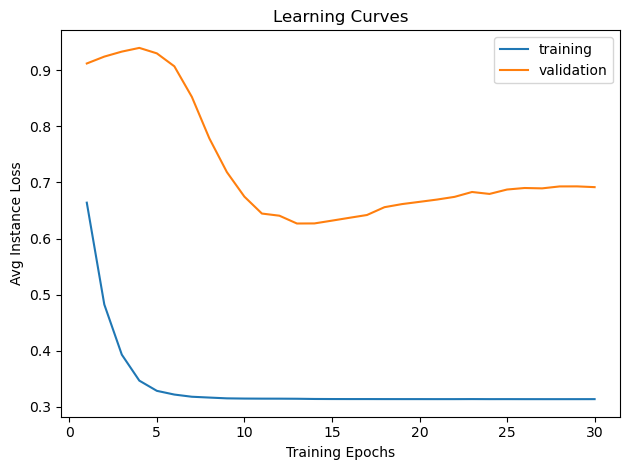

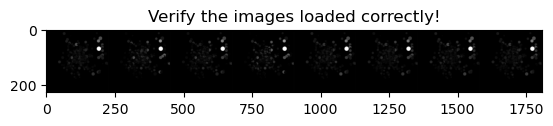

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6773
new best train!
val Loss: 0.6673
new best val!

Epoch 1/29
----------
train Loss: 0.5593
new best train!
val Loss: 0.6720

Epoch 2/29
----------
train Loss: 0.4505
new best train!
val Loss: 0.6766

Epoch 3/29
----------
train Loss: 0.3836
new best train!
val Loss: 0.6815

Epoch 4/29
----------
train Loss: 0.3430
new best train!
val Loss: 0.6858

Epoch 5/29
----------
train Loss: 0.3274
new best train!
val Loss: 0.6905

Epoch 6/29
----------
train Loss: 0.3223
new best train!
val Loss: 0.6931

Epoch 7/29
----------
train Loss: 0.3169
new best train!
val Loss: 0.6866

Epoch 8/29
----------
train Loss: 0.3155
new best train!
val Loss: 0.6736

Epoch 9/29
----------
train Loss: 0.3157
val Loss: 0.6585
new best val!

Epoch 10/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.6452
new best val!

Epoch 11/29
----------
train Loss: 0.3144
val Loss: 0.6415
new best val!

Epoch 12/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.6356
new best val!

Epoch 

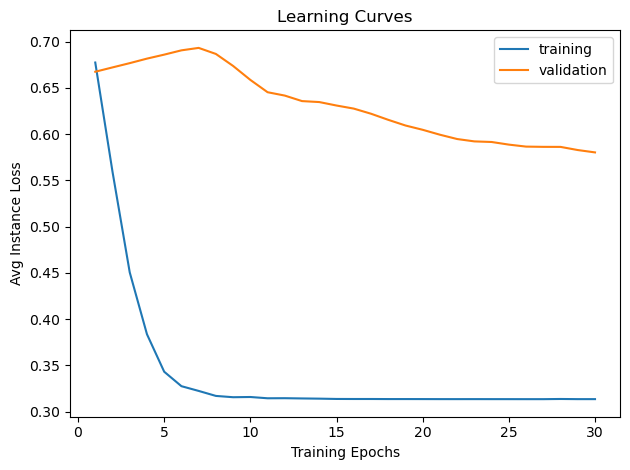

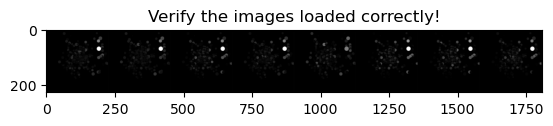

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6993
new best train!
val Loss: 0.6962
new best val!

Epoch 1/29
----------
train Loss: 0.5349
new best train!
val Loss: 0.6886
new best val!

Epoch 2/29
----------
train Loss: 0.4400
new best train!
val Loss: 0.6811
new best val!

Epoch 3/29
----------
train Loss: 0.3858
new best train!
val Loss: 0.6785
new best val!

Epoch 4/29
----------
train Loss: 0.3474
new best train!
val Loss: 0.6884

Epoch 5/29
----------
train Loss: 0.3273
new best train!
val Loss: 0.7002

Epoch 6/29
----------
train Loss: 0.3220
new best train!
val Loss: 0.7026

Epoch 7/29
----------
train Loss: 0.3188
new best train!
val Loss: 0.7045

Epoch 8/29
----------
train Loss: 0.3193
val Loss: 0.7150

Epoch 9/29
----------
train Loss: 0.3190
val Loss: 0.7314

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7454

Epoch 11/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7588

Epoch 12/29
----------
train Loss: 0.3145
val Loss: 0.7685

Epoch 13/29
----------
train Loss: 0

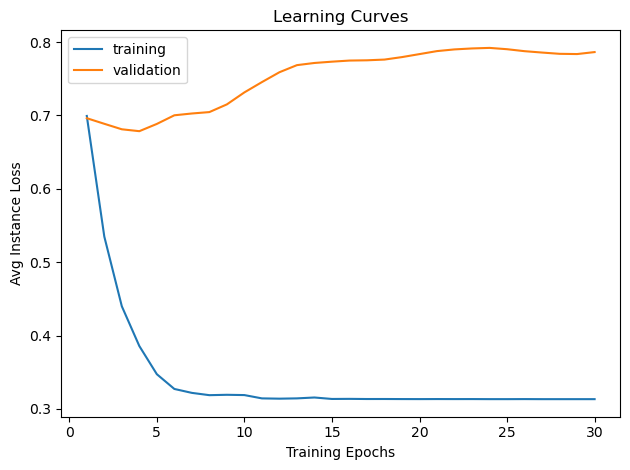

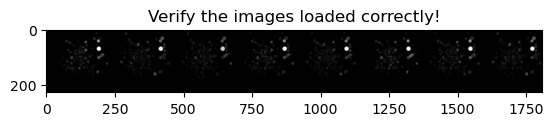

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6833
new best train!
val Loss: 0.7022
new best val!

Epoch 1/29
----------
train Loss: 0.5218
new best train!
val Loss: 0.7122

Epoch 2/29
----------
train Loss: 0.4354
new best train!
val Loss: 0.7205

Epoch 3/29
----------
train Loss: 0.3698
new best train!
val Loss: 0.7212

Epoch 4/29
----------
train Loss: 0.3452
new best train!
val Loss: 0.7166

Epoch 5/29
----------
train Loss: 0.3327
new best train!
val Loss: 0.7055

Epoch 6/29
----------
train Loss: 0.3206
new best train!
val Loss: 0.7025

Epoch 7/29
----------
train Loss: 0.3174
new best train!
val Loss: 0.7144

Epoch 8/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.7297

Epoch 9/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.7457

Epoch 10/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7558

Epoch 11/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.7515

Epoch 12/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7485

Epoch 13/29
----------
train L

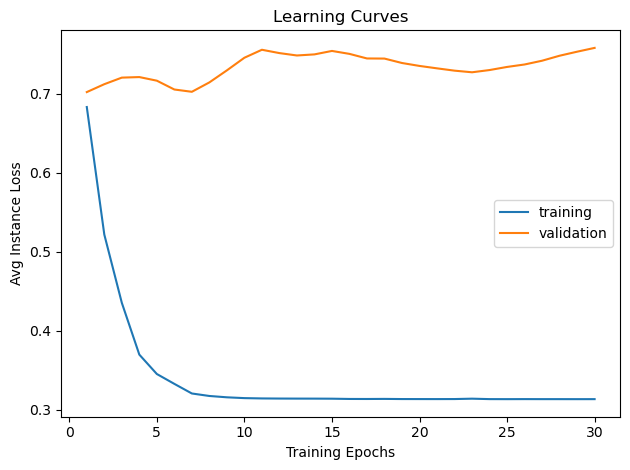

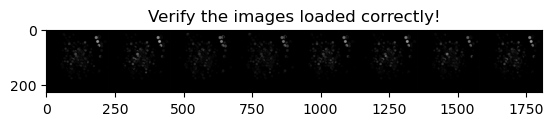

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6891
new best train!
val Loss: 0.7005
new best val!

Epoch 1/29
----------
train Loss: 0.4936
new best train!
val Loss: 0.7269

Epoch 2/29
----------
train Loss: 0.3930
new best train!
val Loss: 0.7474

Epoch 3/29
----------
train Loss: 0.3501
new best train!
val Loss: 0.7834

Epoch 4/29
----------
train Loss: 0.3325
new best train!
val Loss: 0.8276

Epoch 5/29
----------
train Loss: 0.3217
new best train!
val Loss: 0.8638

Epoch 6/29
----------
train Loss: 0.3169
new best train!
val Loss: 0.8812

Epoch 7/29
----------
train Loss: 0.3155
new best train!
val Loss: 0.8877

Epoch 8/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.8856

Epoch 9/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.8699

Epoch 10/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.8431

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.8080

Epoch 12/29
----------
train Loss: 0.3143
val Loss: 0.7835

Epoch 13/29
----------
train Loss: 0.3136
new 

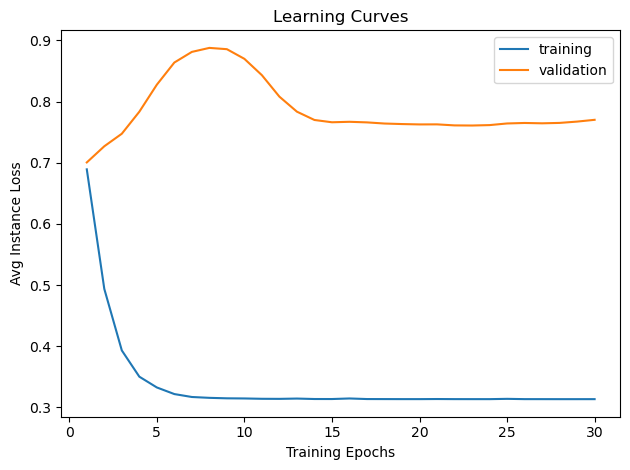

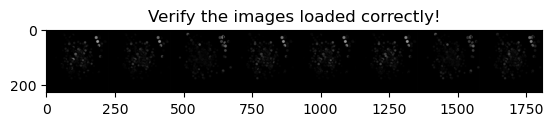

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7177
new best train!
val Loss: 0.6787
new best val!

Epoch 1/29
----------
train Loss: 0.5276
new best train!
val Loss: 0.6446
new best val!

Epoch 2/29
----------
train Loss: 0.4166
new best train!
val Loss: 0.6439
new best val!

Epoch 3/29
----------
train Loss: 0.3736
new best train!
val Loss: 0.6628

Epoch 4/29
----------
train Loss: 0.3415
new best train!
val Loss: 0.6766

Epoch 5/29
----------
train Loss: 0.3275
new best train!
val Loss: 0.6758

Epoch 6/29
----------
train Loss: 0.3211
new best train!
val Loss: 0.6806

Epoch 7/29
----------
train Loss: 0.3179
new best train!
val Loss: 0.6845

Epoch 8/29
----------
train Loss: 0.3166
new best train!
val Loss: 0.6875

Epoch 9/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.6966

Epoch 10/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.7029

Epoch 11/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7064

Epoch 12/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7070

Ep

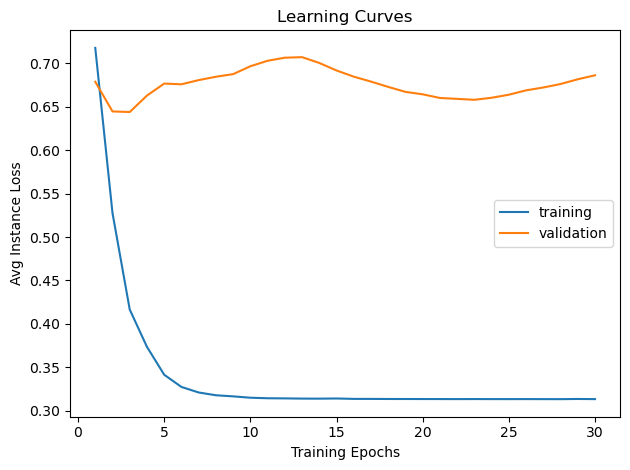

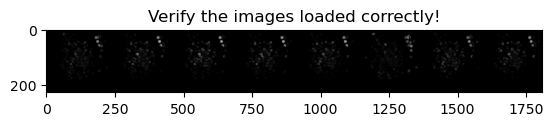

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6986
new best train!
val Loss: 0.6783
new best val!

Epoch 1/29
----------
train Loss: 0.4962
new best train!
val Loss: 0.7556

Epoch 2/29
----------
train Loss: 0.4012
new best train!
val Loss: 0.7960

Epoch 3/29
----------
train Loss: 0.3557
new best train!
val Loss: 0.8105

Epoch 4/29
----------
train Loss: 0.3284
new best train!
val Loss: 0.8268

Epoch 5/29
----------
train Loss: 0.3226
new best train!
val Loss: 0.8441

Epoch 6/29
----------
train Loss: 0.3182
new best train!
val Loss: 0.8513

Epoch 7/29
----------
train Loss: 0.3188
val Loss: 0.8425

Epoch 8/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.8318

Epoch 9/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7995

Epoch 10/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7552

Epoch 11/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7159

Epoch 12/29
----------
train Loss: 0.3142
val Loss: 0.6784

Epoch 13/29
----------
train Loss: 0.3139
new best train!
val 

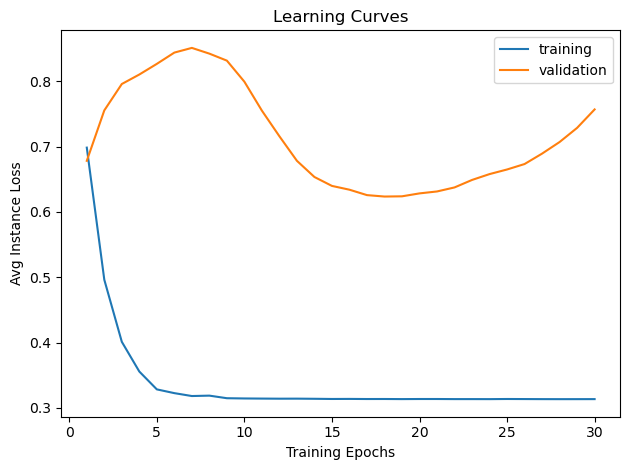

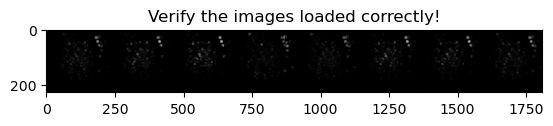

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7011
new best train!
val Loss: 0.6851
new best val!

Epoch 1/29
----------
train Loss: 0.5239
new best train!
val Loss: 0.7181

Epoch 2/29
----------
train Loss: 0.4162
new best train!
val Loss: 0.7672

Epoch 3/29
----------
train Loss: 0.3613
new best train!
val Loss: 0.7954

Epoch 4/29
----------
train Loss: 0.3367
new best train!
val Loss: 0.7976

Epoch 5/29
----------
train Loss: 0.3249
new best train!
val Loss: 0.7726

Epoch 6/29
----------
train Loss: 0.3185
new best train!
val Loss: 0.7364

Epoch 7/29
----------
train Loss: 0.3173
new best train!
val Loss: 0.6931

Epoch 8/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.6663
new best val!

Epoch 9/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.6488
new best val!

Epoch 10/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.6347
new best val!

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.6283
new best val!

Epoch 12/29
----------
train Loss: 0.3138
val Loss

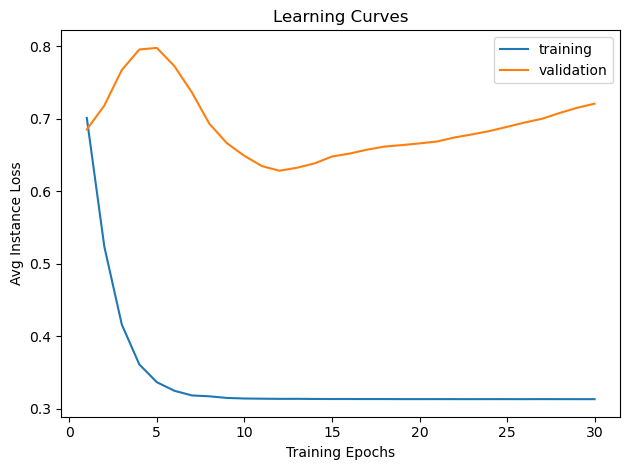

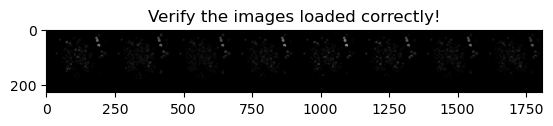

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6765
new best train!
val Loss: 0.6776
new best val!

Epoch 1/29
----------
train Loss: 0.4716
new best train!
val Loss: 0.6774
new best val!

Epoch 2/29
----------
train Loss: 0.3775
new best train!
val Loss: 0.6753
new best val!

Epoch 3/29
----------
train Loss: 0.3470
new best train!
val Loss: 0.6749
new best val!

Epoch 4/29
----------
train Loss: 0.3253
new best train!
val Loss: 0.6768

Epoch 5/29
----------
train Loss: 0.3190
new best train!
val Loss: 0.6788

Epoch 6/29
----------
train Loss: 0.3161
new best train!
val Loss: 0.6769

Epoch 7/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.6656
new best val!

Epoch 8/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.6516
new best val!

Epoch 9/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.6487
new best val!

Epoch 10/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.6429
new best val!

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.6373
new best 

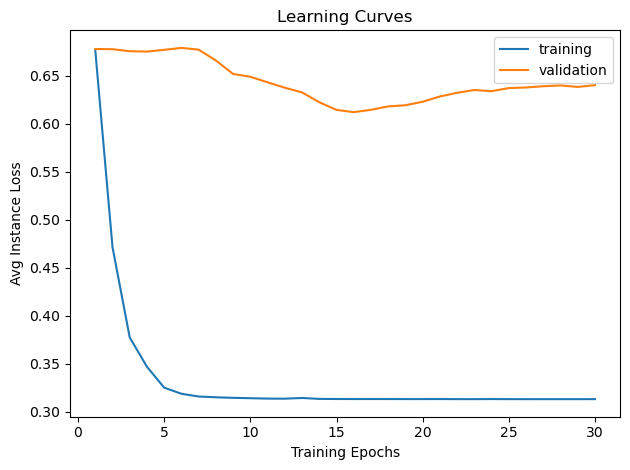

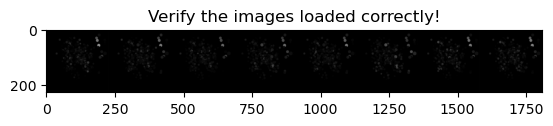

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6734
new best train!
val Loss: 0.7177
new best val!

Epoch 1/29
----------
train Loss: 0.5079
new best train!
val Loss: 0.7104
new best val!

Epoch 2/29
----------
train Loss: 0.4156
new best train!
val Loss: 0.7078
new best val!

Epoch 3/29
----------
train Loss: 0.3545
new best train!
val Loss: 0.6984
new best val!

Epoch 4/29
----------
train Loss: 0.3284
new best train!
val Loss: 0.6929
new best val!

Epoch 5/29
----------
train Loss: 0.3200
new best train!
val Loss: 0.6923
new best val!

Epoch 6/29
----------
train Loss: 0.3185
new best train!
val Loss: 0.6980

Epoch 7/29
----------
train Loss: 0.3181
new best train!
val Loss: 0.7060

Epoch 8/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.7180

Epoch 9/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7211

Epoch 10/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7204

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7182

Epoch 12/29
----------
train Loss: 0

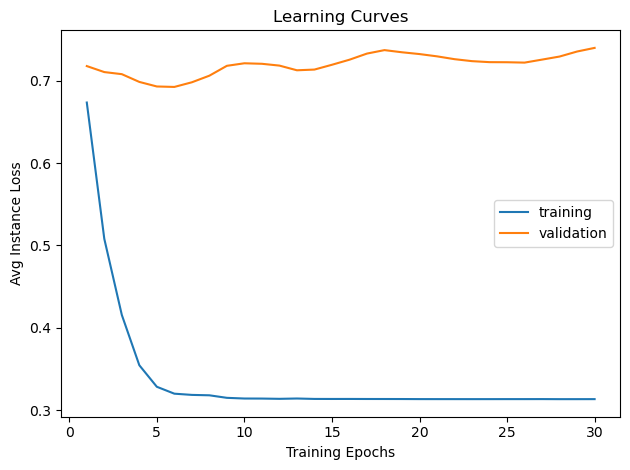

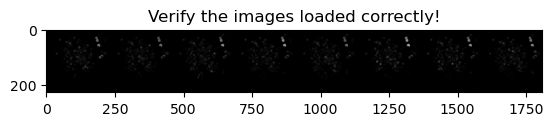

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7235
new best train!
val Loss: 0.7025
new best val!

Epoch 1/29
----------
train Loss: 0.5202
new best train!
val Loss: 0.6770
new best val!

Epoch 2/29
----------
train Loss: 0.4163
new best train!
val Loss: 0.6451
new best val!

Epoch 3/29
----------
train Loss: 0.3525
new best train!
val Loss: 0.6300
new best val!

Epoch 4/29
----------
train Loss: 0.3294
new best train!
val Loss: 0.6242
new best val!

Epoch 5/29
----------
train Loss: 0.3220
new best train!
val Loss: 0.6260

Epoch 6/29
----------
train Loss: 0.3183
new best train!
val Loss: 0.6298

Epoch 7/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.6291

Epoch 8/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.6274

Epoch 9/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.6179
new best val!

Epoch 10/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.6063
new best val!

Epoch 11/29
----------
train Loss: 0.3144
val Loss: 0.5959
new best val!

Epoch 12/29
----------
t

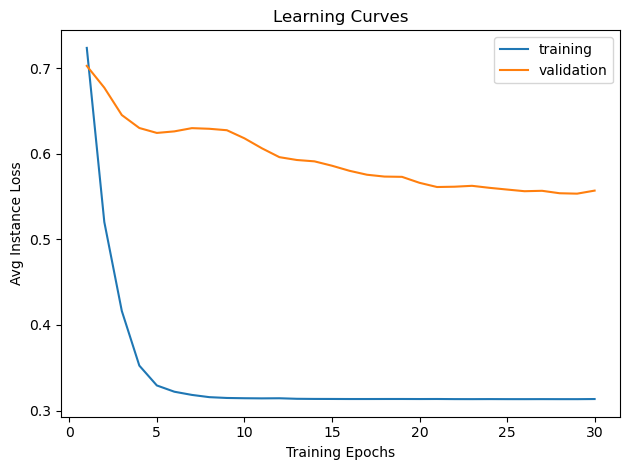

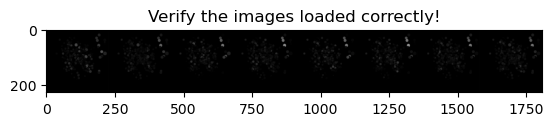

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6802
new best train!
val Loss: 0.6720
new best val!

Epoch 1/29
----------
train Loss: 0.5279
new best train!
val Loss: 0.6857

Epoch 2/29
----------
train Loss: 0.4109
new best train!
val Loss: 0.6847

Epoch 3/29
----------
train Loss: 0.3755
new best train!
val Loss: 0.6575
new best val!

Epoch 4/29
----------
train Loss: 0.3407
new best train!
val Loss: 0.6275
new best val!

Epoch 5/29
----------
train Loss: 0.3309
new best train!
val Loss: 0.5941
new best val!

Epoch 6/29
----------
train Loss: 0.3288
new best train!
val Loss: 0.5756
new best val!

Epoch 7/29
----------
train Loss: 0.3261
new best train!
val Loss: 0.5781

Epoch 8/29
----------
train Loss: 0.3240
new best train!
val Loss: 0.5877

Epoch 9/29
----------
train Loss: 0.3208
new best train!
val Loss: 0.5895

Epoch 10/29
----------
train Loss: 0.3155
new best train!
val Loss: 0.5899

Epoch 11/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.5891

Epoch 12/29
----------
train Loss: 0.3147
val Loss

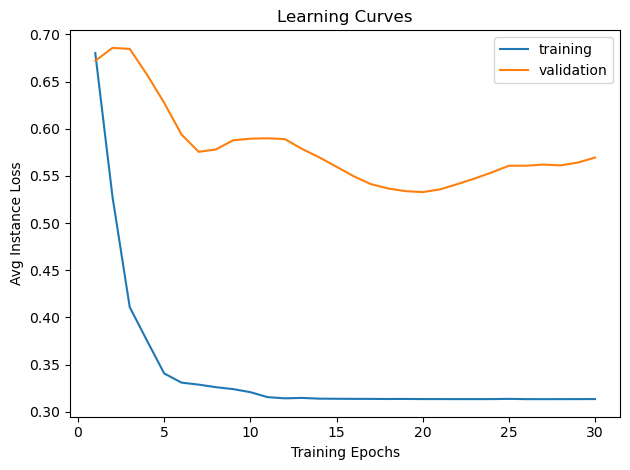

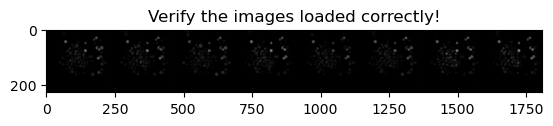

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6922
new best train!
val Loss: 0.6660
new best val!

Epoch 1/29
----------
train Loss: 0.5229
new best train!
val Loss: 0.6623
new best val!

Epoch 2/29
----------
train Loss: 0.4221
new best train!
val Loss: 0.6659

Epoch 3/29
----------
train Loss: 0.3621
new best train!
val Loss: 0.6672

Epoch 4/29
----------
train Loss: 0.3306
new best train!
val Loss: 0.6688

Epoch 5/29
----------
train Loss: 0.3238
new best train!
val Loss: 0.6738

Epoch 6/29
----------
train Loss: 0.3187
new best train!
val Loss: 0.6744

Epoch 7/29
----------
train Loss: 0.3159
new best train!
val Loss: 0.6756

Epoch 8/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.6782

Epoch 9/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.6811

Epoch 10/29
----------
train Loss: 0.3146
val Loss: 0.6856

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.6874

Epoch 12/29
----------
train Loss: 0.3137
new best train!
val Loss: 0.6892

Epoch 13/29
----------
train Los

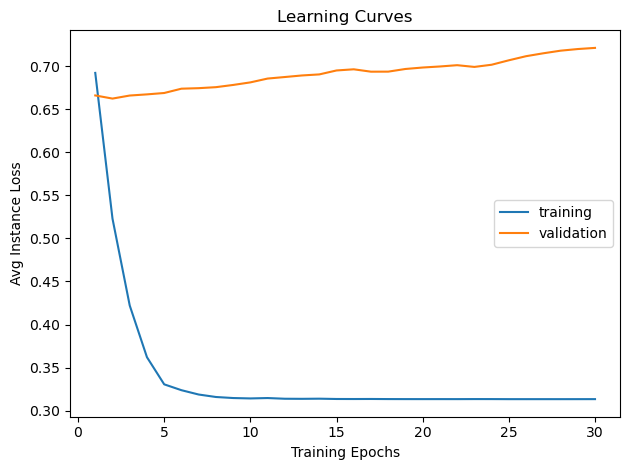

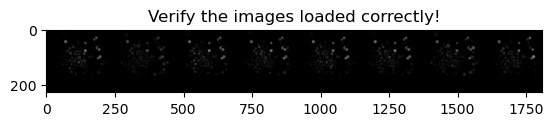

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6787
new best train!
val Loss: 0.7135
new best val!

Epoch 1/29
----------
train Loss: 0.5019
new best train!
val Loss: 0.6942
new best val!

Epoch 2/29
----------
train Loss: 0.4136
new best train!
val Loss: 0.6840
new best val!

Epoch 3/29
----------
train Loss: 0.3566
new best train!
val Loss: 0.6700
new best val!

Epoch 4/29
----------
train Loss: 0.3309
new best train!
val Loss: 0.6767

Epoch 5/29
----------
train Loss: 0.3251
new best train!
val Loss: 0.6923

Epoch 6/29
----------
train Loss: 0.3177
new best train!
val Loss: 0.7062

Epoch 7/29
----------
train Loss: 0.3154
new best train!
val Loss: 0.7164

Epoch 8/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.7217

Epoch 9/29
----------
train Loss: 0.3152
val Loss: 0.7204

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7168

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7136

Epoch 12/29
----------
train Loss: 0.3137
new best train!
val Loss: 0.7114

Epoc

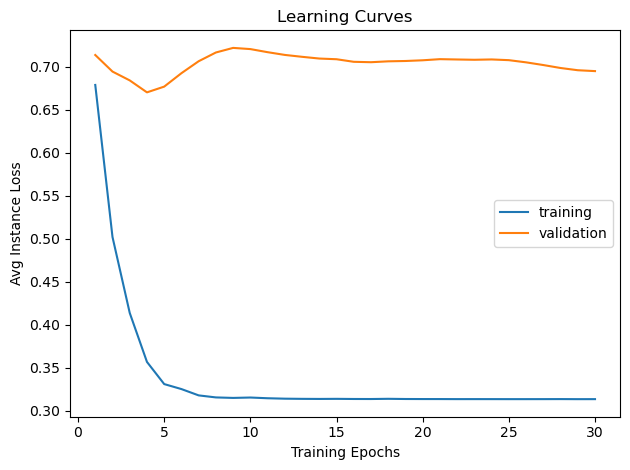

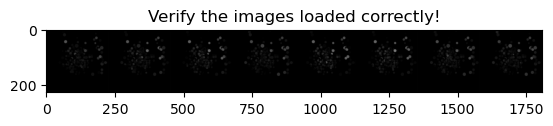

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7104
new best train!
val Loss: 0.6956
new best val!

Epoch 1/29
----------
train Loss: 0.5209
new best train!
val Loss: 0.6954
new best val!

Epoch 2/29
----------
train Loss: 0.4055
new best train!
val Loss: 0.6972

Epoch 3/29
----------
train Loss: 0.3514
new best train!
val Loss: 0.7037

Epoch 4/29
----------
train Loss: 0.3258
new best train!
val Loss: 0.6999

Epoch 5/29
----------
train Loss: 0.3208
new best train!
val Loss: 0.6956

Epoch 6/29
----------
train Loss: 0.3162
new best train!
val Loss: 0.7024

Epoch 7/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.7206

Epoch 8/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.7472

Epoch 9/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7698

Epoch 10/29
----------
train Loss: 0.3145
val Loss: 0.7840

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7956

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.8045

Epoch 13/29
----------
train Los

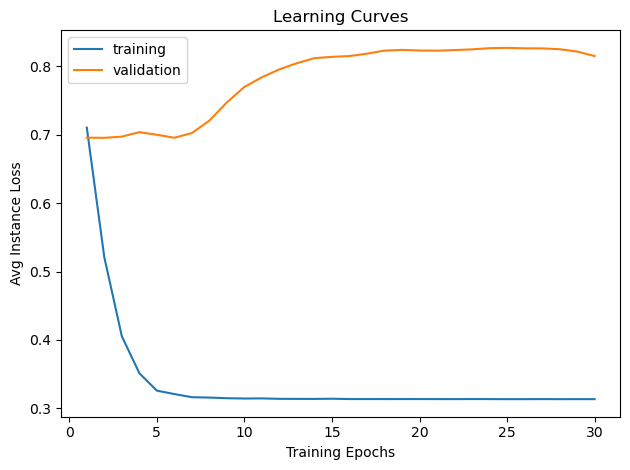

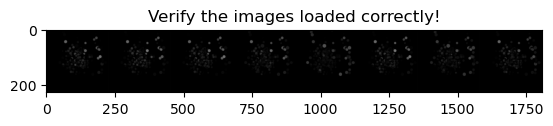

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7211
new best train!
val Loss: 0.7617
new best val!

Epoch 1/29
----------
train Loss: 0.5553
new best train!
val Loss: 0.7679

Epoch 2/29
----------
train Loss: 0.4392
new best train!
val Loss: 0.8078

Epoch 3/29
----------
train Loss: 0.3693
new best train!
val Loss: 0.8455

Epoch 4/29
----------
train Loss: 0.3392
new best train!
val Loss: 0.8959

Epoch 5/29
----------
train Loss: 0.3236
new best train!
val Loss: 0.9422

Epoch 6/29
----------
train Loss: 0.3224
new best train!
val Loss: 0.9655

Epoch 7/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.9782

Epoch 8/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.9741

Epoch 9/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.9630

Epoch 10/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.9541

Epoch 11/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.9471

Epoch 12/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.9429

Epoch 13/29
----------
train L

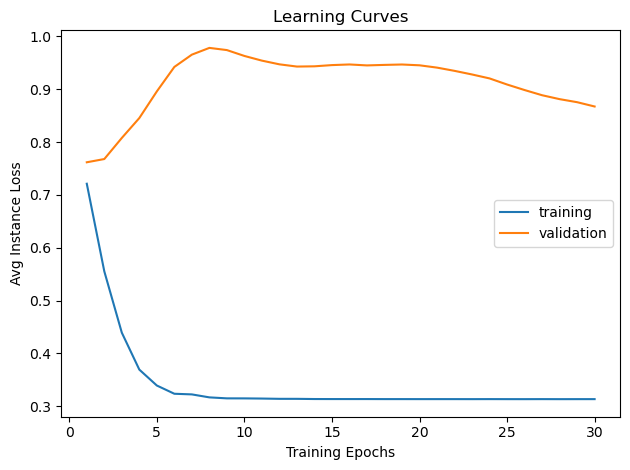

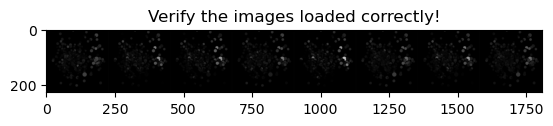

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6702
new best train!
val Loss: 0.6613
new best val!

Epoch 1/29
----------
train Loss: 0.5349
new best train!
val Loss: 0.6688

Epoch 2/29
----------
train Loss: 0.4151
new best train!
val Loss: 0.6795

Epoch 3/29
----------
train Loss: 0.3676
new best train!
val Loss: 0.6872

Epoch 4/29
----------
train Loss: 0.3386
new best train!
val Loss: 0.7031

Epoch 5/29
----------
train Loss: 0.3265
new best train!
val Loss: 0.6952

Epoch 6/29
----------
train Loss: 0.3190
new best train!
val Loss: 0.6624

Epoch 7/29
----------
train Loss: 0.3170
new best train!
val Loss: 0.6318
new best val!

Epoch 8/29
----------
train Loss: 0.3180
val Loss: 0.6088
new best val!

Epoch 9/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.5923
new best val!

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.5817
new best val!

Epoch 11/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.5746
new best val!

Epoch 12/29
----------
train Loss: 0.3140
new best t

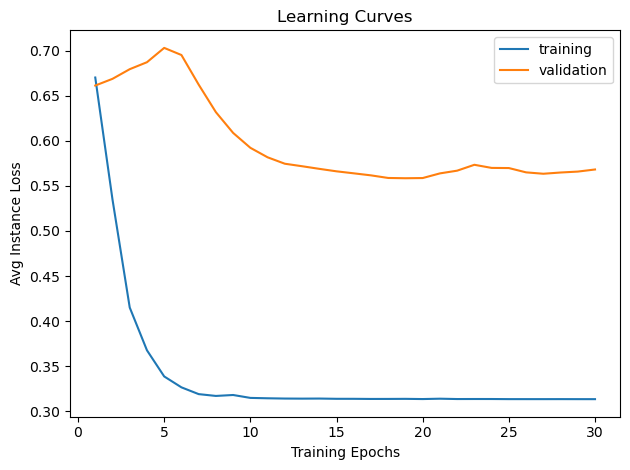

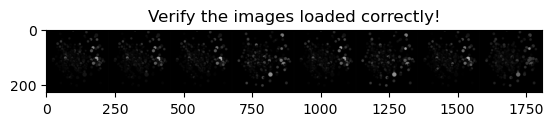

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6918
new best train!
val Loss: 0.7198
new best val!

Epoch 1/29
----------
train Loss: 0.4940
new best train!
val Loss: 0.7164
new best val!

Epoch 2/29
----------
train Loss: 0.4884
new best train!
val Loss: 0.7082
new best val!

Epoch 3/29
----------
train Loss: 0.3800
new best train!
val Loss: 0.7027
new best val!

Epoch 4/29
----------
train Loss: 0.3494
new best train!
val Loss: 0.7088

Epoch 5/29
----------
train Loss: 0.3363
new best train!
val Loss: 0.7103

Epoch 6/29
----------
train Loss: 0.3228
new best train!
val Loss: 0.7058

Epoch 7/29
----------
train Loss: 0.3202
new best train!
val Loss: 0.7127

Epoch 8/29
----------
train Loss: 0.3165
new best train!
val Loss: 0.7151

Epoch 9/29
----------
train Loss: 0.3169
val Loss: 0.7253

Epoch 10/29
----------
train Loss: 0.3155
new best train!
val Loss: 0.7385

Epoch 11/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7471

Epoch 12/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.7479

Epoc

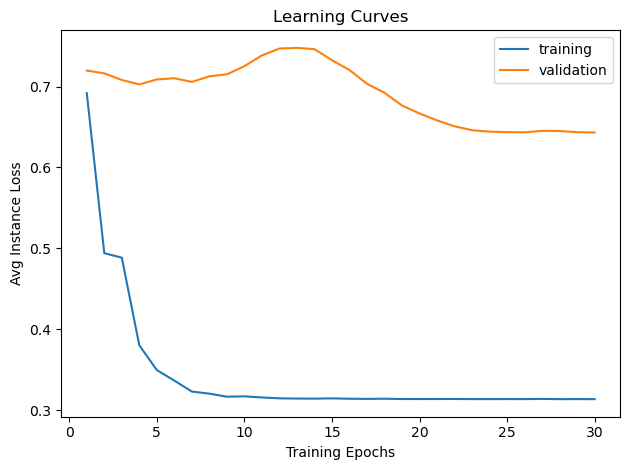

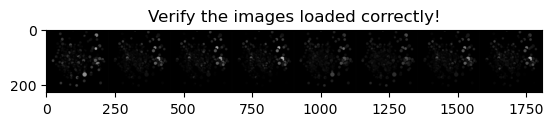

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7141
new best train!
val Loss: 0.7722
new best val!

Epoch 1/29
----------
train Loss: 0.5360
new best train!
val Loss: 0.7614
new best val!

Epoch 2/29
----------
train Loss: 0.4344
new best train!
val Loss: 0.7609
new best val!

Epoch 3/29
----------
train Loss: 0.3753
new best train!
val Loss: 0.7693

Epoch 4/29
----------
train Loss: 0.3424
new best train!
val Loss: 0.7839

Epoch 5/29
----------
train Loss: 0.3287
new best train!
val Loss: 0.8047

Epoch 6/29
----------
train Loss: 0.3251
new best train!
val Loss: 0.8067

Epoch 7/29
----------
train Loss: 0.3170
new best train!
val Loss: 0.8070

Epoch 8/29
----------
train Loss: 0.3160
new best train!
val Loss: 0.7888

Epoch 9/29
----------
train Loss: 0.3156
new best train!
val Loss: 0.7834

Epoch 10/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7732

Epoch 11/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.7649

Epoch 12/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.7732

Ep

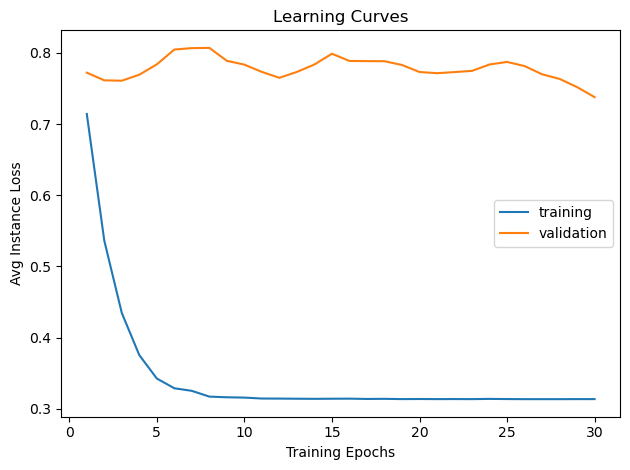

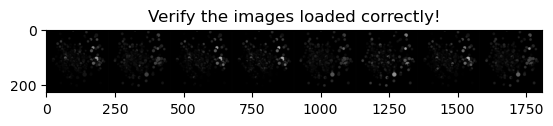

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7249
new best train!
val Loss: 0.7279
new best val!

Epoch 1/29
----------
train Loss: 0.5503
new best train!
val Loss: 0.7254
new best val!

Epoch 2/29
----------
train Loss: 0.4571
new best train!
val Loss: 0.7197
new best val!

Epoch 3/29
----------
train Loss: 0.3917
new best train!
val Loss: 0.7119
new best val!

Epoch 4/29
----------
train Loss: 0.3617
new best train!
val Loss: 0.7085
new best val!

Epoch 5/29
----------
train Loss: 0.3419
new best train!
val Loss: 0.7220

Epoch 6/29
----------
train Loss: 0.3324
new best train!
val Loss: 0.7354

Epoch 7/29
----------
train Loss: 0.3294
new best train!
val Loss: 0.7457

Epoch 8/29
----------
train Loss: 0.3266
new best train!
val Loss: 0.7592

Epoch 9/29
----------
train Loss: 0.3257
new best train!
val Loss: 0.7661

Epoch 10/29
----------
train Loss: 0.3256
new best train!
val Loss: 0.7666

Epoch 11/29
----------
train Loss: 0.3253
new best train!
val Loss: 0.7675

Epoch 12/29
----------
train Loss: 0.3245
new best

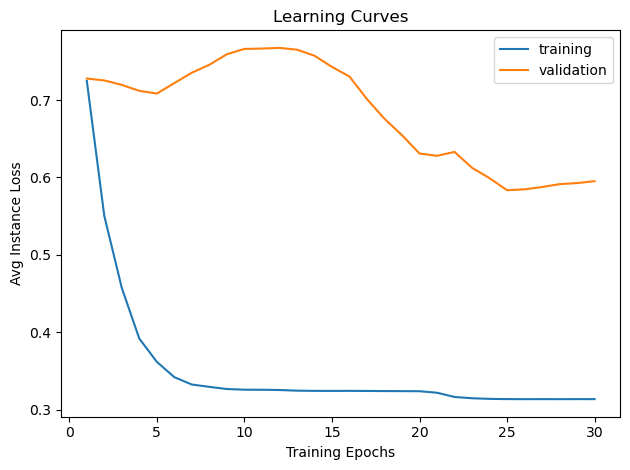

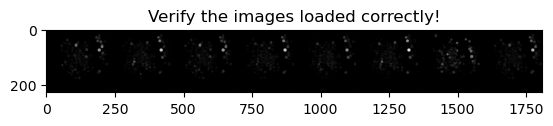

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7179
new best train!
val Loss: 0.6695
new best val!

Epoch 1/29
----------
train Loss: 0.5944
new best train!
val Loss: 0.6576
new best val!

Epoch 2/29
----------
train Loss: 0.4962
new best train!
val Loss: 0.6601

Epoch 3/29
----------
train Loss: 0.4228
new best train!
val Loss: 0.6421
new best val!

Epoch 4/29
----------
train Loss: 0.3683
new best train!
val Loss: 0.6301
new best val!

Epoch 5/29
----------
train Loss: 0.3396
new best train!
val Loss: 0.6504

Epoch 6/29
----------
train Loss: 0.3269
new best train!
val Loss: 0.6819

Epoch 7/29
----------
train Loss: 0.3218
new best train!
val Loss: 0.6906

Epoch 8/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.6989

Epoch 9/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.6982

Epoch 10/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.6957

Epoch 11/29
----------
train Loss: 0.3145
val Loss: 0.6892

Epoch 12/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.6809

Epoc

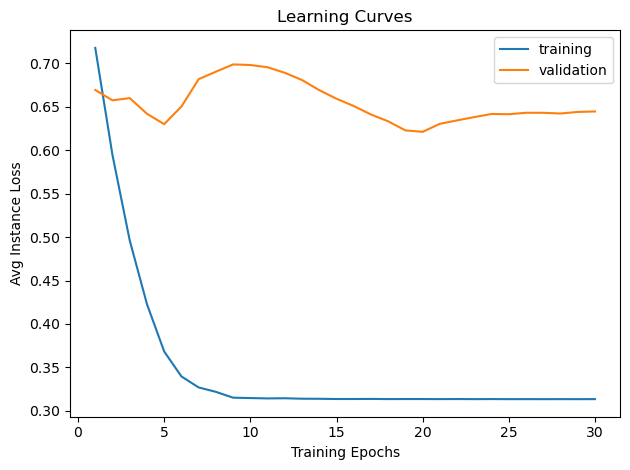

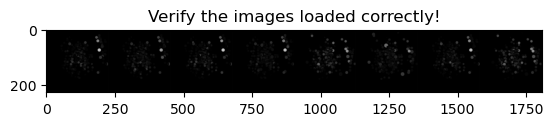

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7081
new best train!
val Loss: 0.7642
new best val!

Epoch 1/29
----------
train Loss: 0.5403
new best train!
val Loss: 0.7683

Epoch 2/29
----------
train Loss: 0.4545
new best train!
val Loss: 0.7005
new best val!

Epoch 3/29
----------
train Loss: 0.3903
new best train!
val Loss: 0.6353
new best val!

Epoch 4/29
----------
train Loss: 0.3626
new best train!
val Loss: 0.5624
new best val!

Epoch 5/29
----------
train Loss: 0.3275
new best train!
val Loss: 0.5730

Epoch 6/29
----------
train Loss: 0.3212
new best train!
val Loss: 0.6071

Epoch 7/29
----------
train Loss: 0.3176
new best train!
val Loss: 0.6604

Epoch 8/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.7080

Epoch 9/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.7587

Epoch 10/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.7658

Epoch 11/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.7509

Epoch 12/29
----------
train Loss: 0.3139
new best train!
val Lo

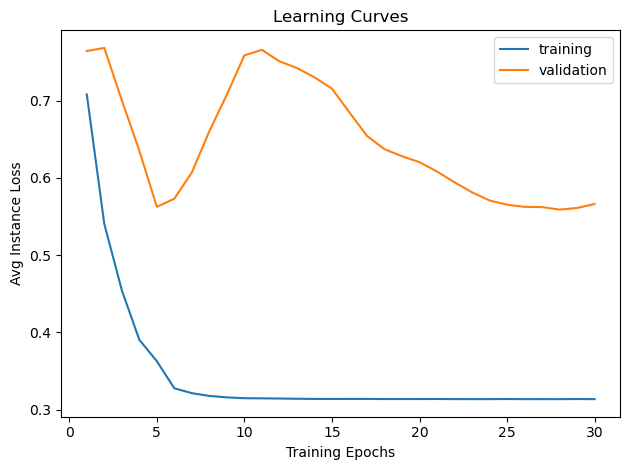

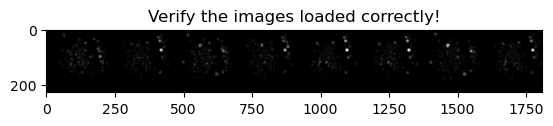

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6905
new best train!
val Loss: 0.7086
new best val!

Epoch 1/29
----------
train Loss: 0.5849
new best train!
val Loss: 0.7257

Epoch 2/29
----------
train Loss: 0.5017
new best train!
val Loss: 0.7001
new best val!

Epoch 3/29
----------
train Loss: 0.4266
new best train!
val Loss: 0.7062

Epoch 4/29
----------
train Loss: 0.3804
new best train!
val Loss: 0.6922
new best val!

Epoch 5/29
----------
train Loss: 0.3531
new best train!
val Loss: 0.6804
new best val!

Epoch 6/29
----------
train Loss: 0.3300
new best train!
val Loss: 0.6947

Epoch 7/29
----------
train Loss: 0.3186
new best train!
val Loss: 0.7211

Epoch 8/29
----------
train Loss: 0.3163
new best train!
val Loss: 0.7389

Epoch 9/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.7369

Epoch 10/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.7302

Epoch 11/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.7315

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Lo

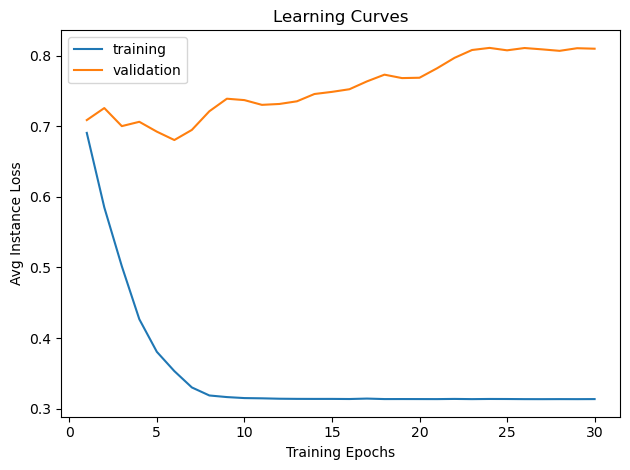

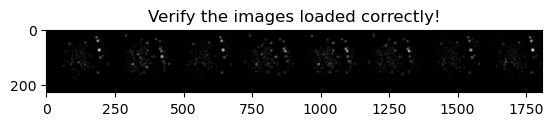

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7180
new best train!
val Loss: 0.6793
new best val!

Epoch 1/29
----------
train Loss: 0.5816
new best train!
val Loss: 0.6489
new best val!

Epoch 2/29
----------
train Loss: 0.4638
new best train!
val Loss: 0.6118
new best val!

Epoch 3/29
----------
train Loss: 0.4308
new best train!
val Loss: 0.7196

Epoch 4/29
----------
train Loss: 0.3772
new best train!
val Loss: 0.6688

Epoch 5/29
----------
train Loss: 0.3452
new best train!
val Loss: 0.8388

Epoch 6/29
----------
train Loss: 0.3296
new best train!
val Loss: 0.8636

Epoch 7/29
----------
train Loss: 0.3209
new best train!
val Loss: 0.8712

Epoch 8/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.9044

Epoch 9/29
----------
train Loss: 0.3160
new best train!
val Loss: 0.9247

Epoch 10/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.9368

Epoch 11/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.9411

Epoch 12/29
----------
train Loss: 0.3157
val Loss: 0.9345

Epoch 13/29
------

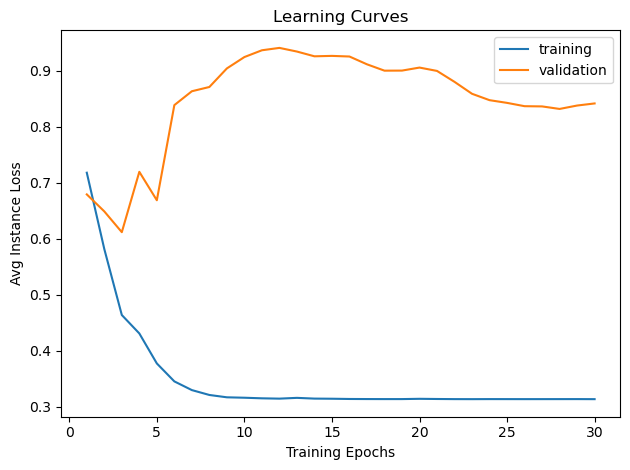

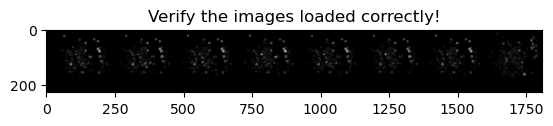

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6916
new best train!
val Loss: 0.7536
new best val!

Epoch 1/29
----------
train Loss: 0.5227
new best train!
val Loss: 0.7300
new best val!

Epoch 2/29
----------
train Loss: 0.4408
new best train!
val Loss: 0.7216
new best val!

Epoch 3/29
----------
train Loss: 0.3797
new best train!
val Loss: 0.7189
new best val!

Epoch 4/29
----------
train Loss: 0.3462
new best train!
val Loss: 0.7543

Epoch 5/29
----------
train Loss: 0.3324
new best train!
val Loss: 0.8034

Epoch 6/29
----------
train Loss: 0.3243
new best train!
val Loss: 0.8346

Epoch 7/29
----------
train Loss: 0.3211
new best train!
val Loss: 0.8244

Epoch 8/29
----------
train Loss: 0.3203
new best train!
val Loss: 0.8107

Epoch 9/29
----------
train Loss: 0.3196
new best train!
val Loss: 0.8111

Epoch 10/29
----------
train Loss: 0.3179
new best train!
val Loss: 0.8129

Epoch 11/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.8157

Epoch 12/29
----------
train Loss: 0.3159
val Loss: 0.8006

Epoc

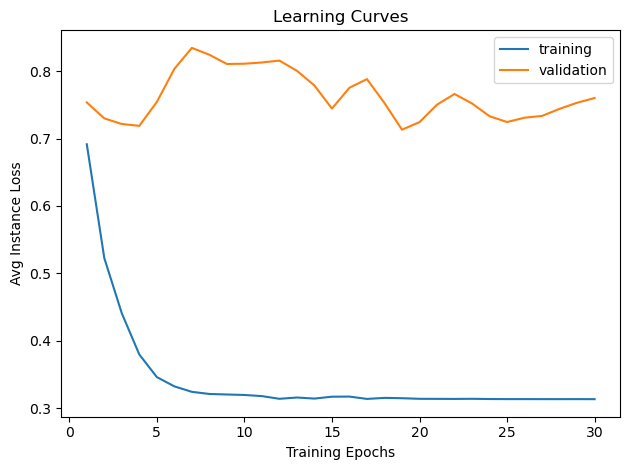

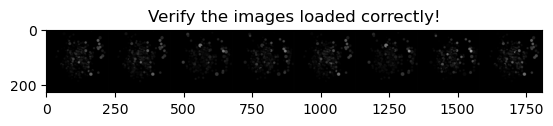

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7401
new best train!
val Loss: 0.6980
new best val!

Epoch 1/29
----------
train Loss: 0.6114
new best train!
val Loss: 0.7023

Epoch 2/29
----------
train Loss: 0.5126
new best train!
val Loss: 0.7191

Epoch 3/29
----------
train Loss: 0.4235
new best train!
val Loss: 0.7217

Epoch 4/29
----------
train Loss: 0.3723
new best train!
val Loss: 0.7331

Epoch 5/29
----------
train Loss: 0.3408
new best train!
val Loss: 0.7610

Epoch 6/29
----------
train Loss: 0.3286
new best train!
val Loss: 0.7754

Epoch 7/29
----------
train Loss: 0.3216
new best train!
val Loss: 0.7371

Epoch 8/29
----------
train Loss: 0.3162
new best train!
val Loss: 0.7045

Epoch 9/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.6942
new best val!

Epoch 10/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.6969

Epoch 11/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7075

Epoch 12/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.7063

Epoch 13/29
----

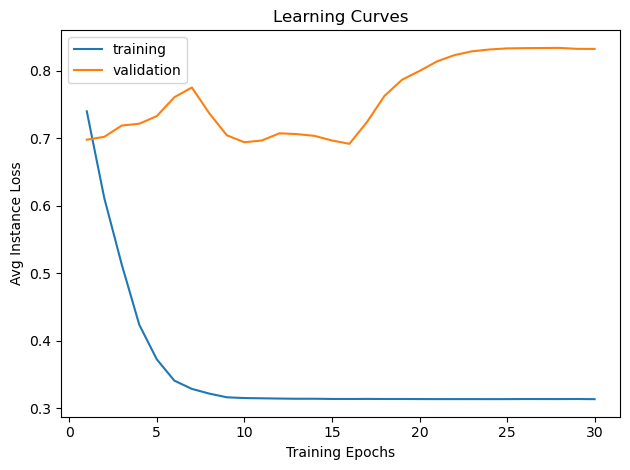

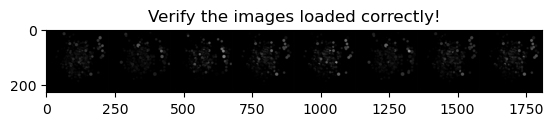

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7102
new best train!
val Loss: 0.6586
new best val!

Epoch 1/29
----------
train Loss: 0.5409
new best train!
val Loss: 0.6628

Epoch 2/29
----------
train Loss: 0.4540
new best train!
val Loss: 0.6805

Epoch 3/29
----------
train Loss: 0.3882
new best train!
val Loss: 0.6897

Epoch 4/29
----------
train Loss: 0.3431
new best train!
val Loss: 0.7410

Epoch 5/29
----------
train Loss: 0.3267
new best train!
val Loss: 0.7515

Epoch 6/29
----------
train Loss: 0.3191
new best train!
val Loss: 0.7139

Epoch 7/29
----------
train Loss: 0.3166
new best train!
val Loss: 0.6984

Epoch 8/29
----------
train Loss: 0.3155
new best train!
val Loss: 0.6915

Epoch 9/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.6935

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.6931

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.6701

Epoch 12/29
----------
train Loss: 0.3141
val Loss: 0.6364
new best val!

Epoch 13/29
----------
train Los

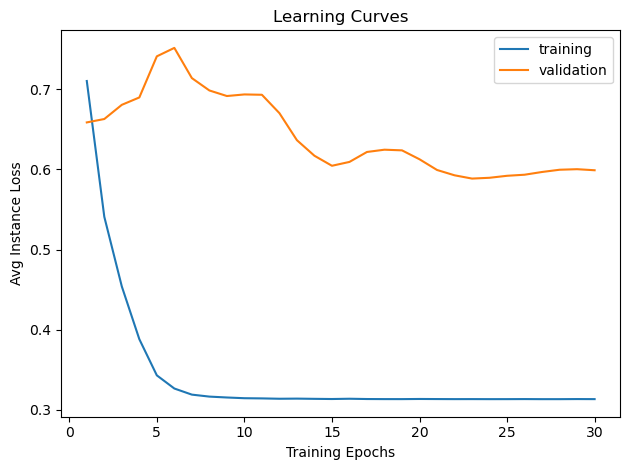

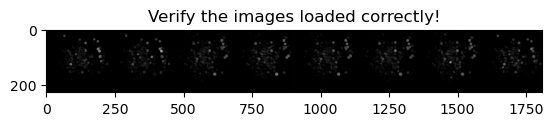

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7069
new best train!
val Loss: 0.7444
new best val!

Epoch 1/29
----------
train Loss: 0.5781
new best train!
val Loss: 0.7005
new best val!

Epoch 2/29
----------
train Loss: 0.5068
new best train!
val Loss: 0.6686
new best val!

Epoch 3/29
----------
train Loss: 0.4484
new best train!
val Loss: 0.6778

Epoch 4/29
----------
train Loss: 0.3863
new best train!
val Loss: 0.6474
new best val!

Epoch 5/29
----------
train Loss: 0.3505
new best train!
val Loss: 0.6886

Epoch 6/29
----------
train Loss: 0.3297
new best train!
val Loss: 0.6778

Epoch 7/29
----------
train Loss: 0.3227
new best train!
val Loss: 0.6953

Epoch 8/29
----------
train Loss: 0.3178
new best train!
val Loss: 0.6977

Epoch 9/29
----------
train Loss: 0.3182
val Loss: 0.6645

Epoch 10/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.7088

Epoch 11/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.7136

Epoch 12/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7140

Epoc

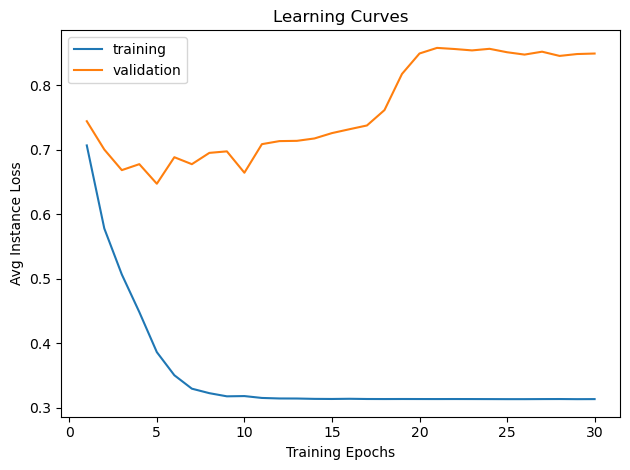

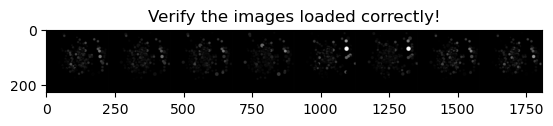

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7192
new best train!
val Loss: 0.6718
new best val!

Epoch 1/29
----------
train Loss: 0.5818
new best train!
val Loss: 0.6713
new best val!

Epoch 2/29
----------
train Loss: 0.4998
new best train!
val Loss: 0.6694
new best val!

Epoch 3/29
----------
train Loss: 0.4356
new best train!
val Loss: 0.6736

Epoch 4/29
----------
train Loss: 0.3867
new best train!
val Loss: 0.6895

Epoch 5/29
----------
train Loss: 0.3564
new best train!
val Loss: 0.6994

Epoch 6/29
----------
train Loss: 0.3481
new best train!
val Loss: 0.7106

Epoch 7/29
----------
train Loss: 0.3433
new best train!
val Loss: 0.7074

Epoch 8/29
----------
train Loss: 0.3389
new best train!
val Loss: 0.6978

Epoch 9/29
----------
train Loss: 0.3334
new best train!
val Loss: 0.6965

Epoch 10/29
----------
train Loss: 0.3284
new best train!
val Loss: 0.6781

Epoch 11/29
----------
train Loss: 0.3258
new best train!
val Loss: 0.6964

Epoch 12/29
----------
train Loss: 0.3210
new best train!
val Loss: 0.7041

Ep

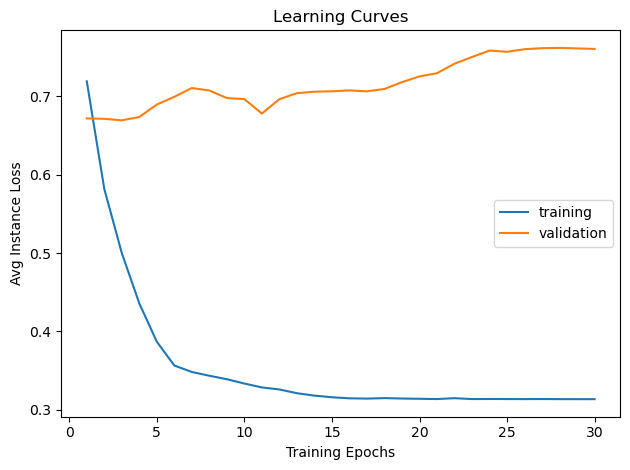

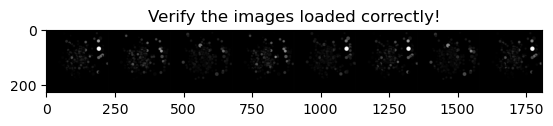

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7223
new best train!
val Loss: 0.7171
new best val!

Epoch 1/29
----------
train Loss: 0.5711
new best train!
val Loss: 0.7074
new best val!

Epoch 2/29
----------
train Loss: 0.4942
new best train!
val Loss: 0.7220

Epoch 3/29
----------
train Loss: 0.4462
new best train!
val Loss: 0.7422

Epoch 4/29
----------
train Loss: 0.3966
new best train!
val Loss: 0.7565

Epoch 5/29
----------
train Loss: 0.3810
new best train!
val Loss: 0.7416

Epoch 6/29
----------
train Loss: 0.3653
new best train!
val Loss: 0.7518

Epoch 7/29
----------
train Loss: 0.3531
new best train!
val Loss: 0.7318

Epoch 8/29
----------
train Loss: 0.3406
new best train!
val Loss: 0.7361

Epoch 9/29
----------
train Loss: 0.3329
new best train!
val Loss: 0.7666

Epoch 10/29
----------
train Loss: 0.3266
new best train!
val Loss: 0.8188

Epoch 11/29
----------
train Loss: 0.3233
new best train!
val Loss: 0.7867

Epoch 12/29
----------
train Loss: 0.3481
val Loss: 0.7248

Epoch 13/29
----------
train Los

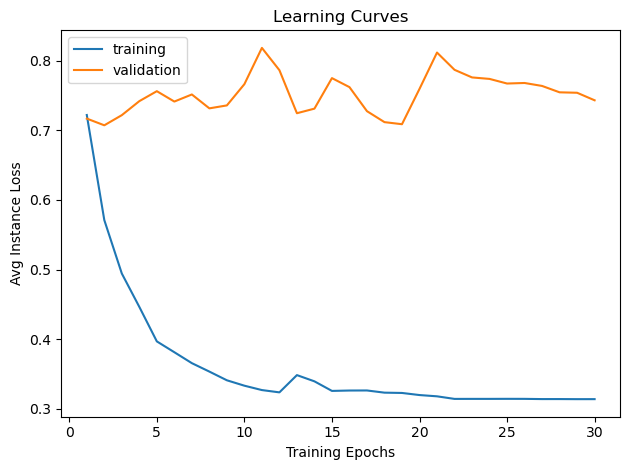

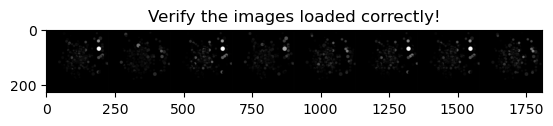

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6897
new best train!
val Loss: 0.7024
new best val!

Epoch 1/29
----------
train Loss: 0.6010
new best train!
val Loss: 0.7229

Epoch 2/29
----------
train Loss: 0.5054
new best train!
val Loss: 0.7777

Epoch 3/29
----------
train Loss: 0.4235
new best train!
val Loss: 0.7422

Epoch 4/29
----------
train Loss: 0.3824
new best train!
val Loss: 0.7643

Epoch 5/29
----------
train Loss: 0.3634
new best train!
val Loss: 0.7537

Epoch 6/29
----------
train Loss: 0.3462
new best train!
val Loss: 0.8094

Epoch 7/29
----------
train Loss: 0.3277
new best train!
val Loss: 0.8405

Epoch 8/29
----------
train Loss: 0.3247
new best train!
val Loss: 0.8006

Epoch 9/29
----------
train Loss: 0.3195
new best train!
val Loss: 0.7806

Epoch 10/29
----------
train Loss: 0.3178
new best train!
val Loss: 0.7963

Epoch 11/29
----------
train Loss: 0.3165
new best train!
val Loss: 0.8345

Epoch 12/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.8469

Epoch 13/29
----------
train L

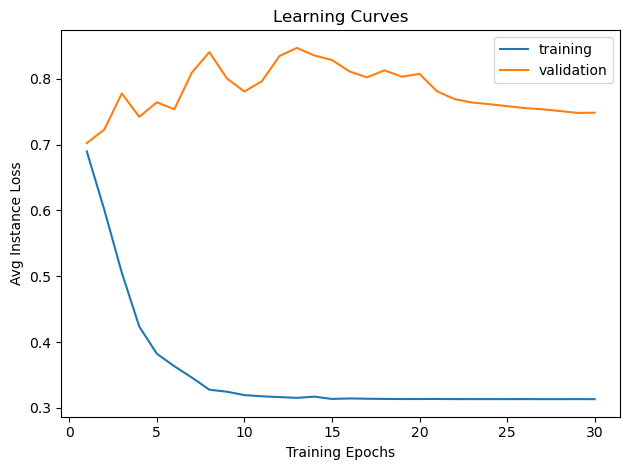

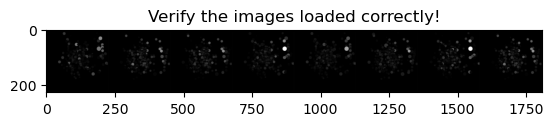

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7151
new best train!
val Loss: 0.6988
new best val!

Epoch 1/29
----------
train Loss: 0.5923
new best train!
val Loss: 0.6878
new best val!

Epoch 2/29
----------
train Loss: 0.4983
new best train!
val Loss: 0.6799
new best val!

Epoch 3/29
----------
train Loss: 0.4483
new best train!
val Loss: 0.7040

Epoch 4/29
----------
train Loss: 0.3950
new best train!
val Loss: 0.7494

Epoch 5/29
----------
train Loss: 0.3752
new best train!
val Loss: 0.8173

Epoch 6/29
----------
train Loss: 0.3579
new best train!
val Loss: 0.8363

Epoch 7/29
----------
train Loss: 0.3465
new best train!
val Loss: 0.8904

Epoch 8/29
----------
train Loss: 0.3321
new best train!
val Loss: 0.9492

Epoch 9/29
----------
train Loss: 0.3179
new best train!
val Loss: 0.9540

Epoch 10/29
----------
train Loss: 0.3161
new best train!
val Loss: 0.9234

Epoch 11/29
----------
train Loss: 0.3160
new best train!
val Loss: 0.9106

Epoch 12/29
----------
train Loss: 0.3163
val Loss: 0.9423

Epoch 13/29
------

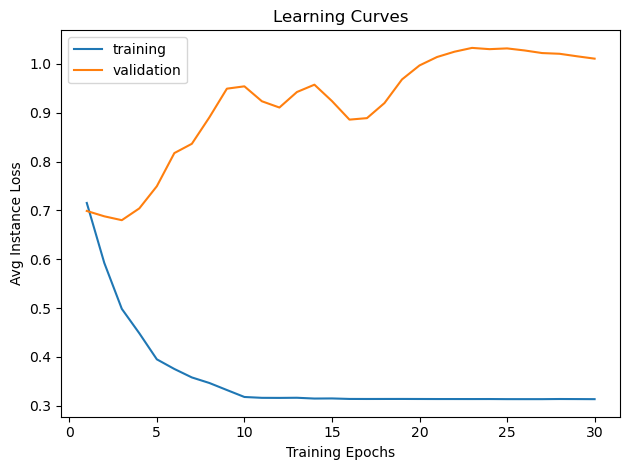

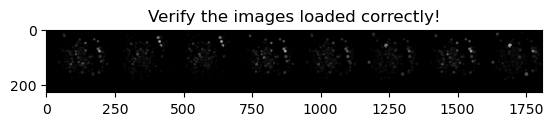

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7016
new best train!
val Loss: 0.7657
new best val!

Epoch 1/29
----------
train Loss: 0.5502
new best train!
val Loss: 0.7308
new best val!

Epoch 2/29
----------
train Loss: 0.4470
new best train!
val Loss: 0.7114
new best val!

Epoch 3/29
----------
train Loss: 0.3796
new best train!
val Loss: 0.7137

Epoch 4/29
----------
train Loss: 0.3426
new best train!
val Loss: 0.7098
new best val!

Epoch 5/29
----------
train Loss: 0.3244
new best train!
val Loss: 0.7167

Epoch 6/29
----------
train Loss: 0.3176
new best train!
val Loss: 0.7111

Epoch 7/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.7271

Epoch 8/29
----------
train Loss: 0.3158
val Loss: 0.7497

Epoch 9/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7435

Epoch 10/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7489

Epoch 11/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7574

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7620

Epoc

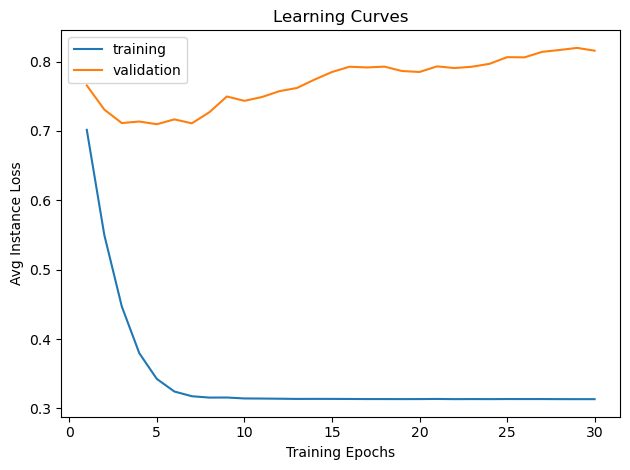

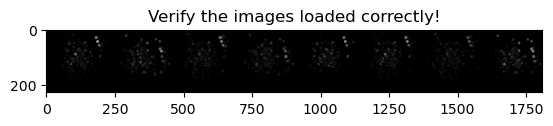

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7136
new best train!
val Loss: 0.6392
new best val!

Epoch 1/29
----------
train Loss: 0.5992
new best train!
val Loss: 0.6803

Epoch 2/29
----------
train Loss: 0.5148
new best train!
val Loss: 0.6801

Epoch 3/29
----------
train Loss: 0.4412
new best train!
val Loss: 0.6408

Epoch 4/29
----------
train Loss: 0.3883
new best train!
val Loss: 0.6104
new best val!

Epoch 5/29
----------
train Loss: 0.3441
new best train!
val Loss: 0.5804
new best val!

Epoch 6/29
----------
train Loss: 0.3419
new best train!
val Loss: 0.5320
new best val!

Epoch 7/29
----------
train Loss: 0.3269
new best train!
val Loss: 0.5147
new best val!

Epoch 8/29
----------
train Loss: 0.3211
new best train!
val Loss: 0.5230

Epoch 9/29
----------
train Loss: 0.3190
new best train!
val Loss: 0.5314

Epoch 10/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.5296

Epoch 11/29
----------
train Loss: 0.3185
val Loss: 0.5348

Epoch 12/29
----------
train Loss: 0.3150
new best train!
val Loss

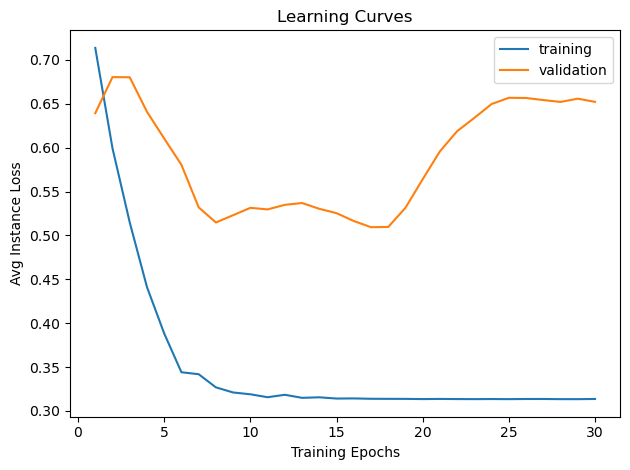

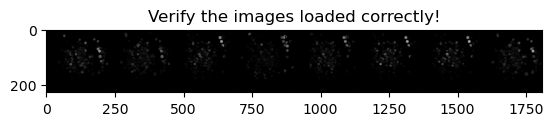

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6939
new best train!
val Loss: 0.7010
new best val!

Epoch 1/29
----------
train Loss: 0.5473
new best train!
val Loss: 0.7440

Epoch 2/29
----------
train Loss: 0.4438
new best train!
val Loss: 0.7368

Epoch 3/29
----------
train Loss: 0.3749
new best train!
val Loss: 0.7271

Epoch 4/29
----------
train Loss: 0.3434
new best train!
val Loss: 0.7580

Epoch 5/29
----------
train Loss: 0.3294
new best train!
val Loss: 0.7470

Epoch 6/29
----------
train Loss: 0.3302
val Loss: 0.7599

Epoch 7/29
----------
train Loss: 0.3277
new best train!
val Loss: 0.7828

Epoch 8/29
----------
train Loss: 0.3187
new best train!
val Loss: 0.7497

Epoch 9/29
----------
train Loss: 0.3263
val Loss: 0.7869

Epoch 10/29
----------
train Loss: 0.3180
new best train!
val Loss: 0.8027

Epoch 11/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.7963

Epoch 12/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.7926

Epoch 13/29
----------
train Loss: 0.3147
new best train!
val 

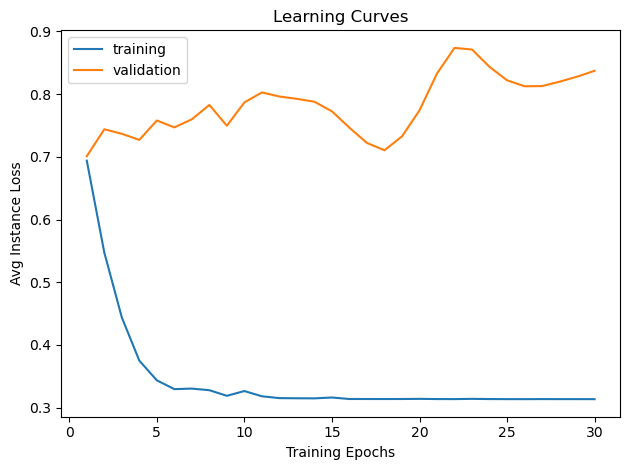

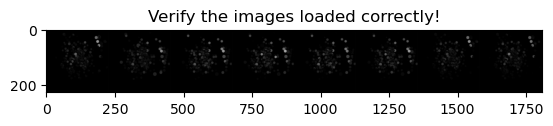

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7107
new best train!
val Loss: 0.6936
new best val!

Epoch 1/29
----------
train Loss: 0.5566
new best train!
val Loss: 0.7575

Epoch 2/29
----------
train Loss: 0.4445
new best train!
val Loss: 0.7874

Epoch 3/29
----------
train Loss: 0.4090
new best train!
val Loss: 0.7984

Epoch 4/29
----------
train Loss: 0.3552
new best train!
val Loss: 0.7681

Epoch 5/29
----------
train Loss: 0.3422
new best train!
val Loss: 0.7864

Epoch 6/29
----------
train Loss: 0.3454
val Loss: 0.8035

Epoch 7/29
----------
train Loss: 0.3259
new best train!
val Loss: 0.7553

Epoch 8/29
----------
train Loss: 0.3250
new best train!
val Loss: 0.8459

Epoch 9/29
----------
train Loss: 0.3196
new best train!
val Loss: 0.8737

Epoch 10/29
----------
train Loss: 0.3184
new best train!
val Loss: 0.8638

Epoch 11/29
----------
train Loss: 0.3154
new best train!
val Loss: 0.8391

Epoch 12/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.7945

Epoch 13/29
----------
train Loss: 0.3155
val 

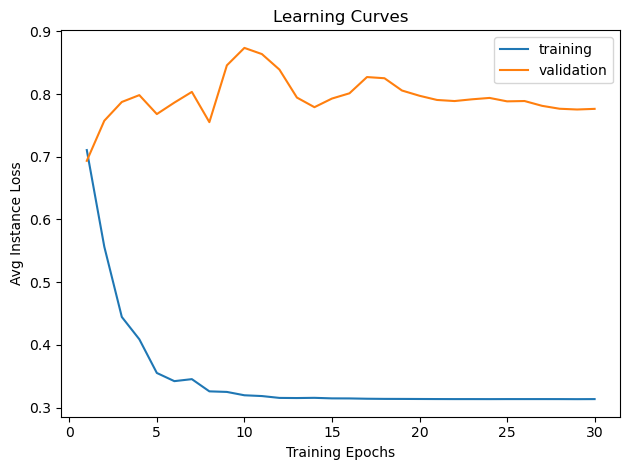

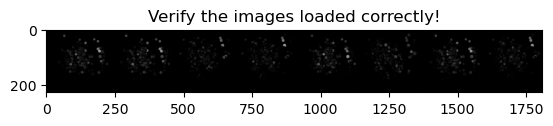

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7090
new best train!
val Loss: 0.7342
new best val!

Epoch 1/29
----------
train Loss: 0.5663
new best train!
val Loss: 0.6674
new best val!

Epoch 2/29
----------
train Loss: 0.4698
new best train!
val Loss: 0.6590
new best val!

Epoch 3/29
----------
train Loss: 0.4059
new best train!
val Loss: 0.6822

Epoch 4/29
----------
train Loss: 0.3554
new best train!
val Loss: 0.6931

Epoch 5/29
----------
train Loss: 0.3374
new best train!
val Loss: 0.6989

Epoch 6/29
----------
train Loss: 0.3296
new best train!
val Loss: 0.7006

Epoch 7/29
----------
train Loss: 0.3250
new best train!
val Loss: 0.6967

Epoch 8/29
----------
train Loss: 0.3235
new best train!
val Loss: 0.7019

Epoch 9/29
----------
train Loss: 0.3199
new best train!
val Loss: 0.6960

Epoch 10/29
----------
train Loss: 0.3197
new best train!
val Loss: 0.6897

Epoch 11/29
----------
train Loss: 0.3191
new best train!
val Loss: 0.7176

Epoch 12/29
----------
train Loss: 0.3190
new best train!
val Loss: 0.7517

Ep

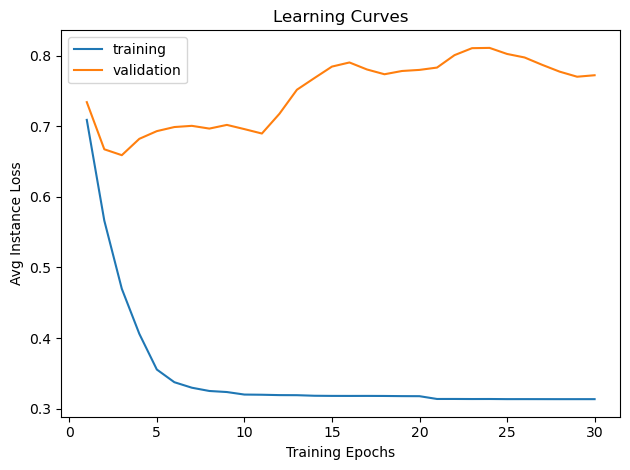

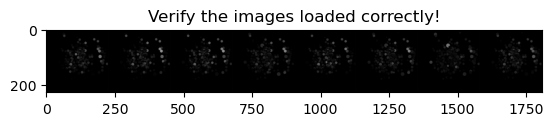

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6952
new best train!
val Loss: 0.7263
new best val!

Epoch 1/29
----------
train Loss: 0.5803
new best train!
val Loss: 0.7110
new best val!

Epoch 2/29
----------
train Loss: 0.4936
new best train!
val Loss: 0.6916
new best val!

Epoch 3/29
----------
train Loss: 0.4207
new best train!
val Loss: 0.7202

Epoch 4/29
----------
train Loss: 0.3704
new best train!
val Loss: 0.7339

Epoch 5/29
----------
train Loss: 0.3430
new best train!
val Loss: 0.7054

Epoch 6/29
----------
train Loss: 0.3324
new best train!
val Loss: 0.7076

Epoch 7/29
----------
train Loss: 0.3268
new best train!
val Loss: 0.7207

Epoch 8/29
----------
train Loss: 0.3198
new best train!
val Loss: 0.7017

Epoch 9/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.6839
new best val!

Epoch 10/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.6646
new best val!

Epoch 11/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.6451
new best val!

Epoch 12/29
----------
train Loss: 0

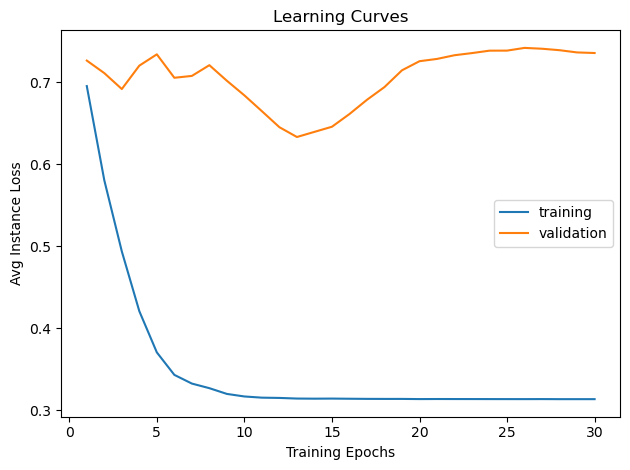

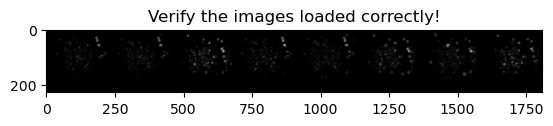

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7307
new best train!
val Loss: 0.6833
new best val!

Epoch 1/29
----------
train Loss: 0.5921
new best train!
val Loss: 0.6588
new best val!

Epoch 2/29
----------
train Loss: 0.5103
new best train!
val Loss: 0.6288
new best val!

Epoch 3/29
----------
train Loss: 0.4405
new best train!
val Loss: 0.6161
new best val!

Epoch 4/29
----------
train Loss: 0.3780
new best train!
val Loss: 0.6210

Epoch 5/29
----------
train Loss: 0.3560
new best train!
val Loss: 0.6685

Epoch 6/29
----------
train Loss: 0.3267
new best train!
val Loss: 0.6803

Epoch 7/29
----------
train Loss: 0.3226
new best train!
val Loss: 0.6933

Epoch 8/29
----------
train Loss: 0.3178
new best train!
val Loss: 0.7053

Epoch 9/29
----------
train Loss: 0.3158
new best train!
val Loss: 0.7116

Epoch 10/29
----------
train Loss: 0.3158
new best train!
val Loss: 0.7127

Epoch 11/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.7127

Epoch 12/29
----------
train Loss: 0.3141
new best train!
val Lo

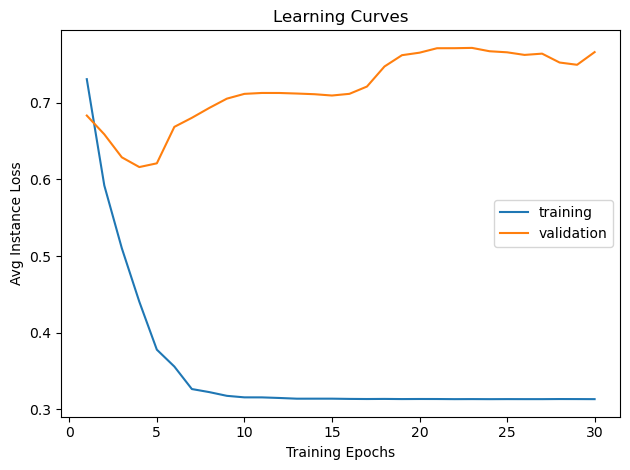

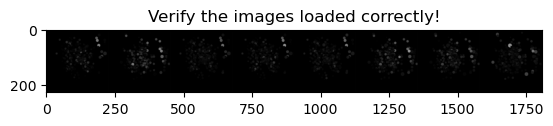

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6898
new best train!
val Loss: 0.6211
new best val!

Epoch 1/29
----------
train Loss: 0.5783
new best train!
val Loss: 0.6262

Epoch 2/29
----------
train Loss: 0.4696
new best train!
val Loss: 0.6370

Epoch 3/29
----------
train Loss: 0.3923
new best train!
val Loss: 0.6592

Epoch 4/29
----------
train Loss: 0.3414
new best train!
val Loss: 0.6926

Epoch 5/29
----------
train Loss: 0.3249
new best train!
val Loss: 0.7295

Epoch 6/29
----------
train Loss: 0.3189
new best train!
val Loss: 0.7570

Epoch 7/29
----------
train Loss: 0.3177
new best train!
val Loss: 0.8060

Epoch 8/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.8098

Epoch 9/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.8072

Epoch 10/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.8089

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.8280

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.8477

Epoch 13/29
----------
train L

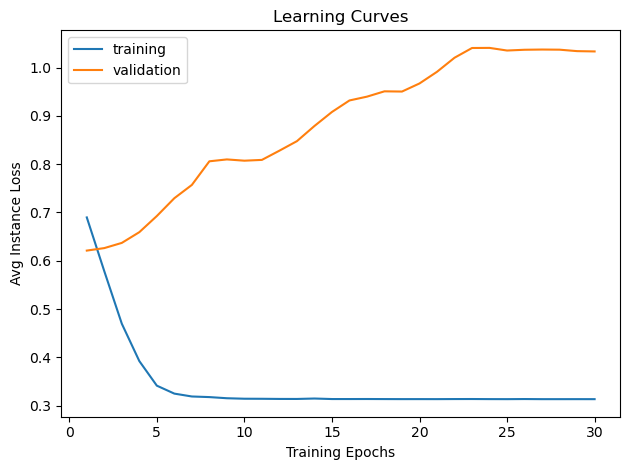

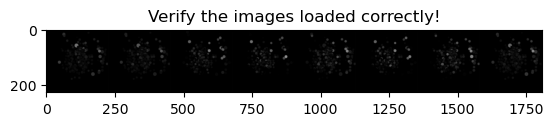

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6950
new best train!
val Loss: 0.6966
new best val!

Epoch 1/29
----------
train Loss: 0.5634
new best train!
val Loss: 0.6877
new best val!

Epoch 2/29
----------
train Loss: 0.4673
new best train!
val Loss: 0.6747
new best val!

Epoch 3/29
----------
train Loss: 0.4085
new best train!
val Loss: 0.6632
new best val!

Epoch 4/29
----------
train Loss: 0.3709
new best train!
val Loss: 0.6486
new best val!

Epoch 5/29
----------
train Loss: 0.3370
new best train!
val Loss: 0.6480
new best val!

Epoch 6/29
----------
train Loss: 0.3240
new best train!
val Loss: 0.6447
new best val!

Epoch 7/29
----------
train Loss: 0.3179
new best train!
val Loss: 0.6363
new best val!

Epoch 8/29
----------
train Loss: 0.3154
new best train!
val Loss: 0.6427

Epoch 9/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.6476

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.6508

Epoch 11/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.6491

Epoch 12

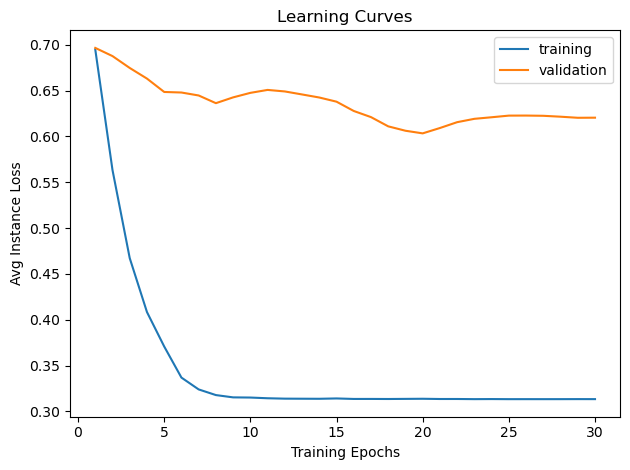

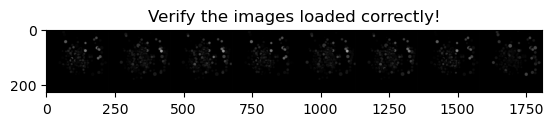

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7174
new best train!
val Loss: 0.6928
new best val!

Epoch 1/29
----------
train Loss: 0.5744
new best train!
val Loss: 0.7023

Epoch 2/29
----------
train Loss: 0.4912
new best train!
val Loss: 0.7223

Epoch 3/29
----------
train Loss: 0.4043
new best train!
val Loss: 0.7466

Epoch 4/29
----------
train Loss: 0.3553
new best train!
val Loss: 0.7070

Epoch 5/29
----------
train Loss: 0.3338
new best train!
val Loss: 0.7242

Epoch 6/29
----------
train Loss: 0.3260
new best train!
val Loss: 0.7091

Epoch 7/29
----------
train Loss: 0.3188
new best train!
val Loss: 0.7196

Epoch 8/29
----------
train Loss: 0.3154
new best train!
val Loss: 0.7411

Epoch 9/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.7476

Epoch 10/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7447

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7396

Epoch 12/29
----------
train Loss: 0.3144
val Loss: 0.7430

Epoch 13/29
----------
train Loss: 0.3138
new 

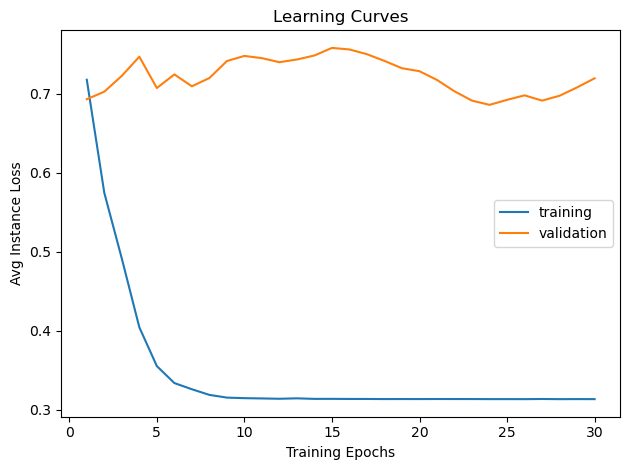

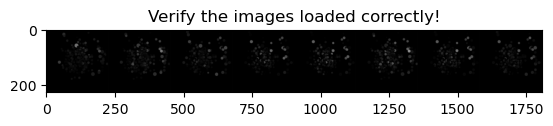

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7562
new best train!
val Loss: 0.8401
new best val!

Epoch 1/29
----------
train Loss: 0.6009
new best train!
val Loss: 0.8197
new best val!

Epoch 2/29
----------
train Loss: 0.5013
new best train!
val Loss: 0.7930
new best val!

Epoch 3/29
----------
train Loss: 0.4532
new best train!
val Loss: 0.7824
new best val!

Epoch 4/29
----------
train Loss: 0.3951
new best train!
val Loss: 0.7428
new best val!

Epoch 5/29
----------
train Loss: 0.3726
new best train!
val Loss: 0.7516

Epoch 6/29
----------
train Loss: 0.3582
new best train!
val Loss: 0.7187
new best val!

Epoch 7/29
----------
train Loss: 0.3335
new best train!
val Loss: 0.8376

Epoch 8/29
----------
train Loss: 0.3241
new best train!
val Loss: 0.7385

Epoch 9/29
----------
train Loss: 0.3212
new best train!
val Loss: 0.7912

Epoch 10/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.8391

Epoch 11/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.8498

Epoch 12/29
----------
train Loss: 0

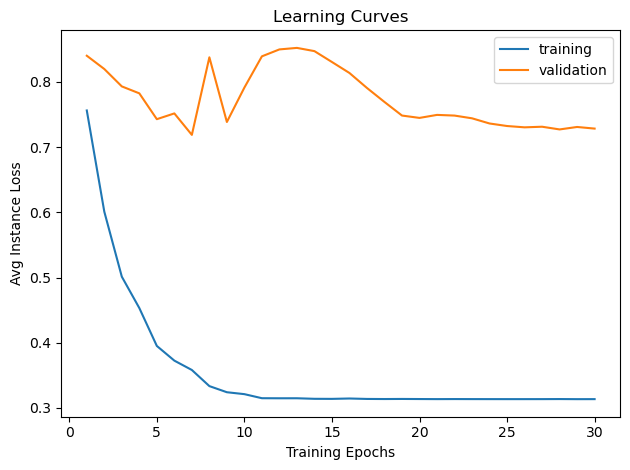

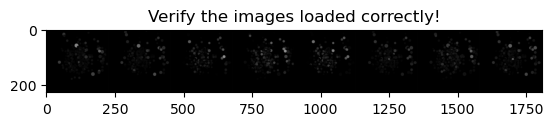

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7006
new best train!
val Loss: 0.7214
new best val!

Epoch 1/29
----------
train Loss: 0.5881
new best train!
val Loss: 0.7513

Epoch 2/29
----------
train Loss: 0.4944
new best train!
val Loss: 0.7738

Epoch 3/29
----------
train Loss: 0.4269
new best train!
val Loss: 0.7432

Epoch 4/29
----------
train Loss: 0.3785
new best train!
val Loss: 0.7240

Epoch 5/29
----------
train Loss: 0.3484
new best train!
val Loss: 0.7230

Epoch 6/29
----------
train Loss: 0.3322
new best train!
val Loss: 0.7105
new best val!

Epoch 7/29
----------
train Loss: 0.3240
new best train!
val Loss: 0.7093
new best val!

Epoch 8/29
----------
train Loss: 0.3191
new best train!
val Loss: 0.7072
new best val!

Epoch 9/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.7120

Epoch 10/29
----------
train Loss: 0.3155
val Loss: 0.7089

Epoch 11/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.6853
new best val!

Epoch 12/29
----------
train Loss: 0.3147
new best train!
val Loss

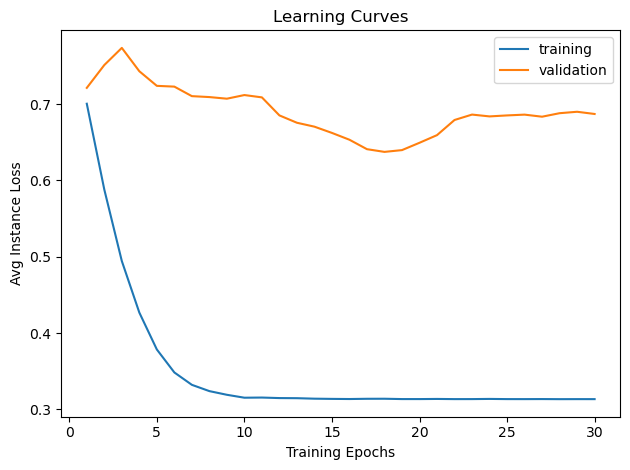

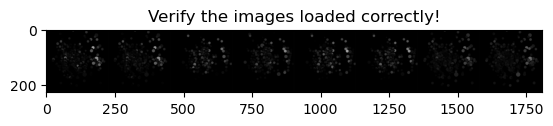

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7374
new best train!
val Loss: 0.6750
new best val!

Epoch 1/29
----------
train Loss: 0.5829
new best train!
val Loss: 0.6783

Epoch 2/29
----------
train Loss: 0.5032
new best train!
val Loss: 0.6683
new best val!

Epoch 3/29
----------
train Loss: 0.4205
new best train!
val Loss: 0.6796

Epoch 4/29
----------
train Loss: 0.3877
new best train!
val Loss: 0.7012

Epoch 5/29
----------
train Loss: 0.3625
new best train!
val Loss: 0.6951

Epoch 6/29
----------
train Loss: 0.3484
new best train!
val Loss: 0.6895

Epoch 7/29
----------
train Loss: 0.3388
new best train!
val Loss: 0.7283

Epoch 8/29
----------
train Loss: 0.3358
new best train!
val Loss: 0.6785

Epoch 9/29
----------
train Loss: 0.3275
new best train!
val Loss: 0.6507
new best val!

Epoch 10/29
----------
train Loss: 0.3247
new best train!
val Loss: 0.6945

Epoch 11/29
----------
train Loss: 0.3305
val Loss: 0.6739

Epoch 12/29
----------
train Loss: 0.3241
new best train!
val Loss: 0.7049

Epoch 13/29
------

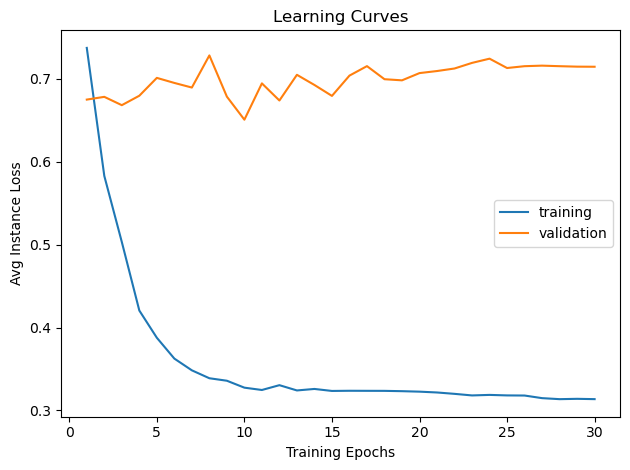

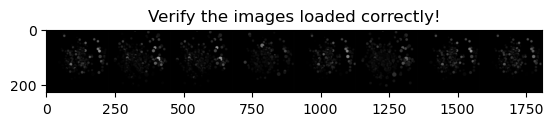

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7102
new best train!
val Loss: 0.7119
new best val!

Epoch 1/29
----------
train Loss: 0.5805
new best train!
val Loss: 0.7106
new best val!

Epoch 2/29
----------
train Loss: 0.5187
new best train!
val Loss: 0.7524

Epoch 3/29
----------
train Loss: 0.4541
new best train!
val Loss: 0.7323

Epoch 4/29
----------
train Loss: 0.3884
new best train!
val Loss: 0.7330

Epoch 5/29
----------
train Loss: 0.3576
new best train!
val Loss: 0.7145

Epoch 6/29
----------
train Loss: 0.3385
new best train!
val Loss: 0.7174

Epoch 7/29
----------
train Loss: 0.3276
new best train!
val Loss: 0.7444

Epoch 8/29
----------
train Loss: 0.3225
new best train!
val Loss: 0.7432

Epoch 9/29
----------
train Loss: 0.3222
new best train!
val Loss: 0.7432

Epoch 10/29
----------
train Loss: 0.3219
new best train!
val Loss: 0.7258

Epoch 11/29
----------
train Loss: 0.3210
new best train!
val Loss: 0.7189

Epoch 12/29
----------
train Loss: 0.3190
new best train!
val Loss: 0.6969
new best val!

Ep

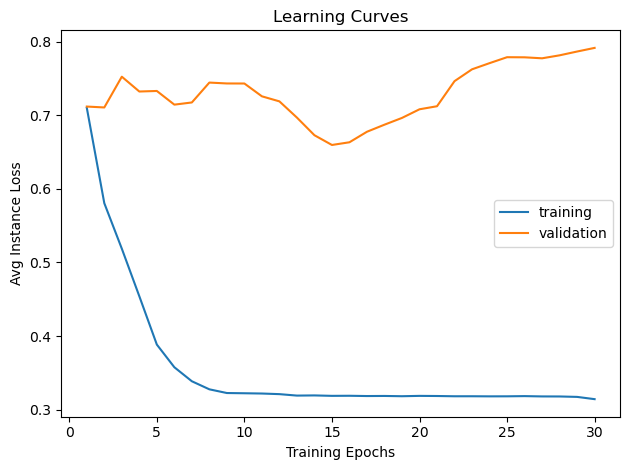

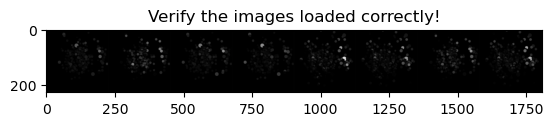

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6994
new best train!
val Loss: 0.7119
new best val!

Epoch 1/29
----------
train Loss: 0.6056
new best train!
val Loss: 0.7025
new best val!

Epoch 2/29
----------
train Loss: 0.5140
new best train!
val Loss: 0.7039

Epoch 3/29
----------
train Loss: 0.4466
new best train!
val Loss: 0.7114

Epoch 4/29
----------
train Loss: 0.3867
new best train!
val Loss: 0.7215

Epoch 5/29
----------
train Loss: 0.3607
new best train!
val Loss: 0.6934
new best val!

Epoch 6/29
----------
train Loss: 0.3342
new best train!
val Loss: 0.7037

Epoch 7/29
----------
train Loss: 0.3269
new best train!
val Loss: 0.7208

Epoch 8/29
----------
train Loss: 0.3251
new best train!
val Loss: 0.6879
new best val!

Epoch 9/29
----------
train Loss: 0.3215
new best train!
val Loss: 0.6969

Epoch 10/29
----------
train Loss: 0.3202
new best train!
val Loss: 0.7288

Epoch 11/29
----------
train Loss: 0.3192
new best train!
val Loss: 0.7644

Epoch 12/29
----------
train Loss: 0.3217
val Loss: 0.7942

Epoc

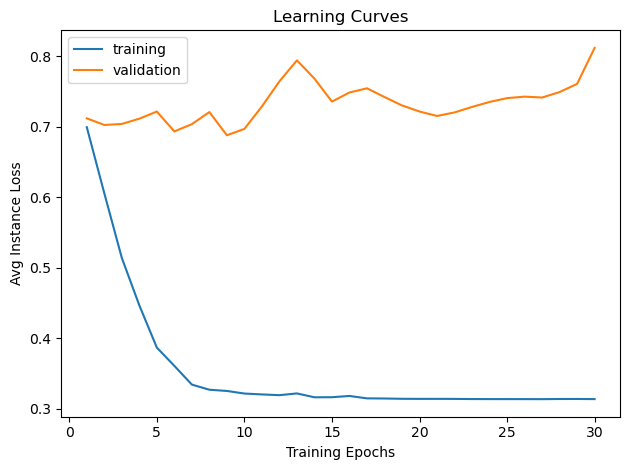

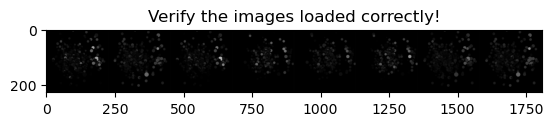

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7277
new best train!
val Loss: 0.7187
new best val!

Epoch 1/29
----------
train Loss: 0.6398
new best train!
val Loss: 0.6948
new best val!

Epoch 2/29
----------
train Loss: 0.5515
new best train!
val Loss: 0.6844
new best val!

Epoch 3/29
----------
train Loss: 0.4981
new best train!
val Loss: 0.6985

Epoch 4/29
----------
train Loss: 0.4314
new best train!
val Loss: 0.6863

Epoch 5/29
----------
train Loss: 0.3905
new best train!
val Loss: 0.6841
new best val!

Epoch 6/29
----------
train Loss: 0.3697
new best train!
val Loss: 0.6760
new best val!

Epoch 7/29
----------
train Loss: 0.3492
new best train!
val Loss: 0.6961

Epoch 8/29
----------
train Loss: 0.3317
new best train!
val Loss: 0.7468

Epoch 9/29
----------
train Loss: 0.3354
val Loss: 0.7071

Epoch 10/29
----------
train Loss: 0.3301
new best train!
val Loss: 0.7568

Epoch 11/29
----------
train Loss: 0.3272
new best train!
val Loss: 0.7934

Epoch 12/29
----------
train Loss: 0.3221
new best train!
val Loss

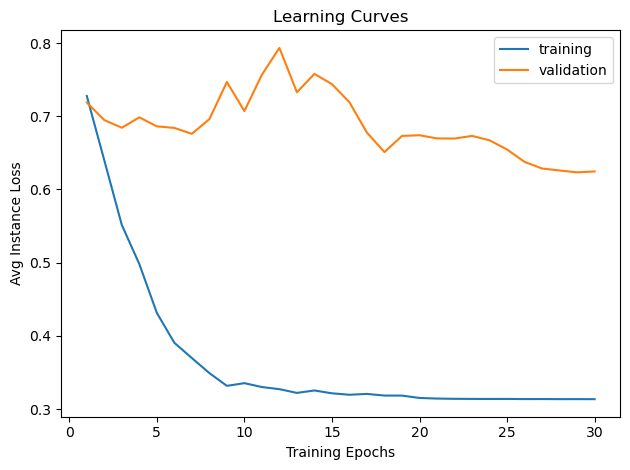

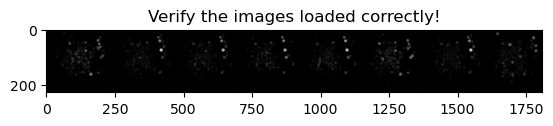

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6984
new best train!
val Loss: 0.6456
new best val!

Epoch 1/29
----------
train Loss: 0.4948
new best train!
val Loss: 0.6381
new best val!

Epoch 2/29
----------
train Loss: 0.3965
new best train!
val Loss: 0.6661

Epoch 3/29
----------
train Loss: 0.3442
new best train!
val Loss: 0.7373

Epoch 4/29
----------
train Loss: 0.3257
new best train!
val Loss: 0.7943

Epoch 5/29
----------
train Loss: 0.3193
new best train!
val Loss: 0.8159

Epoch 6/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.8238

Epoch 7/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.8228

Epoch 8/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.8167

Epoch 9/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.8077

Epoch 10/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.8077

Epoch 11/29
----------
train Loss: 0.3136
new best train!
val Loss: 0.8045

Epoch 12/29
----------
train Loss: 0.3136
new best train!
val Loss: 0.7994

Epoch 13/29
----

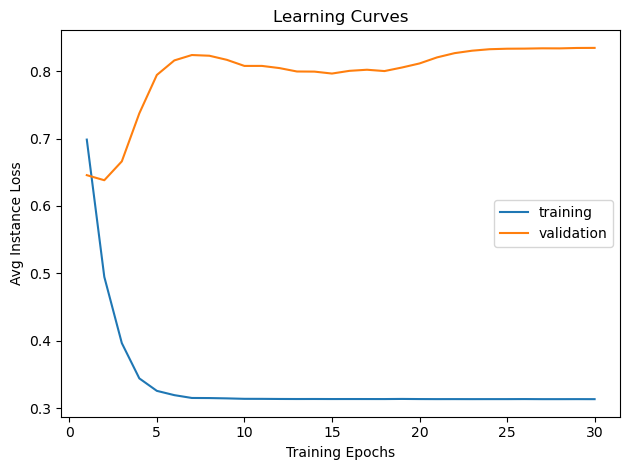

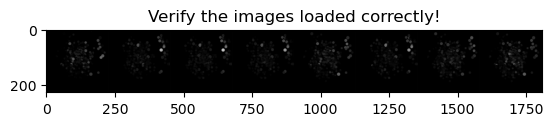

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6997
new best train!
val Loss: 0.7376
new best val!

Epoch 1/29
----------
train Loss: 0.5074
new best train!
val Loss: 0.7161
new best val!

Epoch 2/29
----------
train Loss: 0.4198
new best train!
val Loss: 0.6709
new best val!

Epoch 3/29
----------
train Loss: 0.3650
new best train!
val Loss: 0.6539
new best val!

Epoch 4/29
----------
train Loss: 0.3495
new best train!
val Loss: 0.6616

Epoch 5/29
----------
train Loss: 0.3345
new best train!
val Loss: 0.6796

Epoch 6/29
----------
train Loss: 0.3236
new best train!
val Loss: 0.6527
new best val!

Epoch 7/29
----------
train Loss: 0.3191
new best train!
val Loss: 0.6751

Epoch 8/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.7168

Epoch 9/29
----------
train Loss: 0.3154
new best train!
val Loss: 0.7545

Epoch 10/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.7993

Epoch 11/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.8200

Epoch 12/29
----------
train Loss: 0.3140
new best

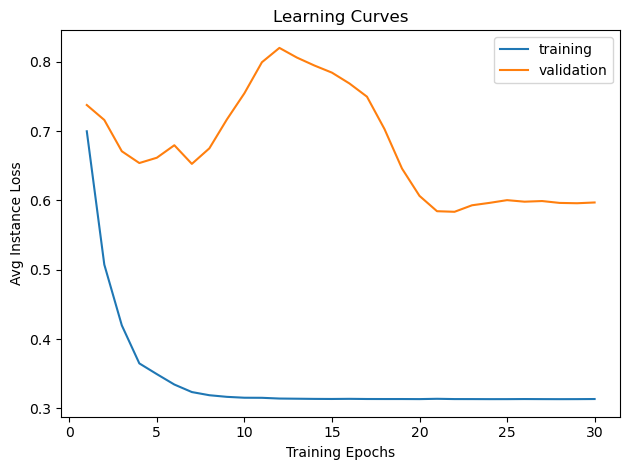

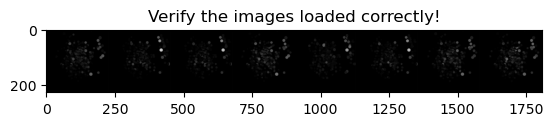

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7146
new best train!
val Loss: 0.6664
new best val!

Epoch 1/29
----------
train Loss: 0.5303
new best train!
val Loss: 0.6822

Epoch 2/29
----------
train Loss: 0.4339
new best train!
val Loss: 0.7264

Epoch 3/29
----------
train Loss: 0.3765
new best train!
val Loss: 0.7517

Epoch 4/29
----------
train Loss: 0.3380
new best train!
val Loss: 0.7617

Epoch 5/29
----------
train Loss: 0.3254
new best train!
val Loss: 0.7837

Epoch 6/29
----------
train Loss: 0.3194
new best train!
val Loss: 0.8057

Epoch 7/29
----------
train Loss: 0.3178
new best train!
val Loss: 0.7970

Epoch 8/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.7948

Epoch 9/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.8166

Epoch 10/29
----------
train Loss: 0.3148
val Loss: 0.8135

Epoch 11/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.8102

Epoch 12/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.8229

Epoch 13/29
----------
train Loss: 0.3137
new 

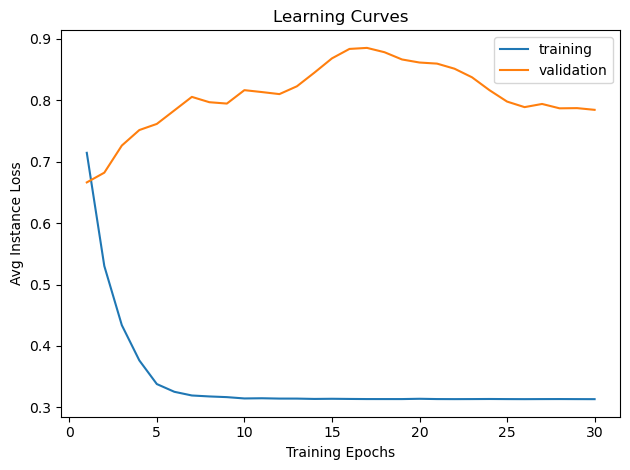

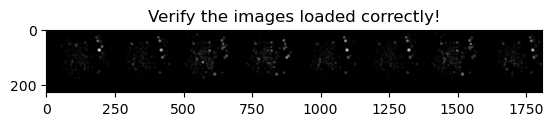

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7070
new best train!
val Loss: 0.7057
new best val!

Epoch 1/29
----------
train Loss: 0.5200
new best train!
val Loss: 0.6909
new best val!

Epoch 2/29
----------
train Loss: 0.4167
new best train!
val Loss: 0.6990

Epoch 3/29
----------
train Loss: 0.3592
new best train!
val Loss: 0.6767
new best val!

Epoch 4/29
----------
train Loss: 0.3313
new best train!
val Loss: 0.6368
new best val!

Epoch 5/29
----------
train Loss: 0.3219
new best train!
val Loss: 0.6049
new best val!

Epoch 6/29
----------
train Loss: 0.3173
new best train!
val Loss: 0.6181

Epoch 7/29
----------
train Loss: 0.3164
new best train!
val Loss: 0.6372

Epoch 8/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.6460

Epoch 9/29
----------
train Loss: 0.3146
val Loss: 0.6540

Epoch 10/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.6566

Epoch 11/29
----------
train Loss: 0.3137
new best train!
val Loss: 0.6659

Epoch 12/29
----------
train Loss: 0.3139
val Loss: 0.6709

Epoch 

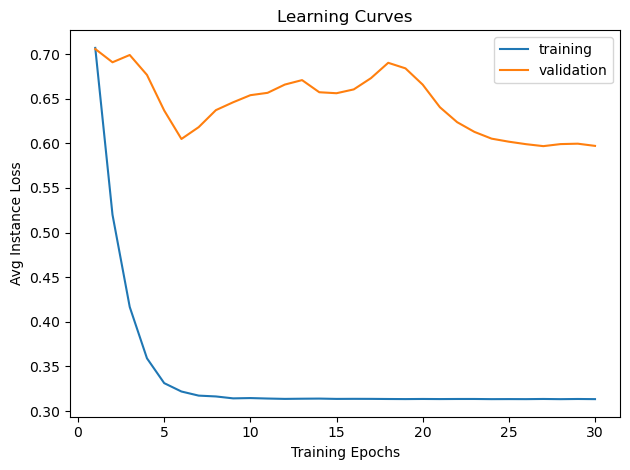

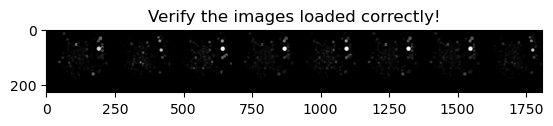

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7643
new best train!
val Loss: 0.6571
new best val!

Epoch 1/29
----------
train Loss: 0.5606
new best train!
val Loss: 0.6574

Epoch 2/29
----------
train Loss: 0.4469
new best train!
val Loss: 0.6755

Epoch 3/29
----------
train Loss: 0.3754
new best train!
val Loss: 0.7257

Epoch 4/29
----------
train Loss: 0.3390
new best train!
val Loss: 0.7089

Epoch 5/29
----------
train Loss: 0.3280
new best train!
val Loss: 0.7415

Epoch 6/29
----------
train Loss: 0.3218
new best train!
val Loss: 0.7737

Epoch 7/29
----------
train Loss: 0.3204
new best train!
val Loss: 0.7815

Epoch 8/29
----------
train Loss: 0.3216
val Loss: 0.7819

Epoch 9/29
----------
train Loss: 0.3190
new best train!
val Loss: 0.8011

Epoch 10/29
----------
train Loss: 0.3196
val Loss: 0.8114

Epoch 11/29
----------
train Loss: 0.3188
new best train!
val Loss: 0.8197

Epoch 12/29
----------
train Loss: 0.3188
val Loss: 0.8215

Epoch 13/29
----------
train Loss: 0.3187
new best train!
val Loss: 0.8203

Ep

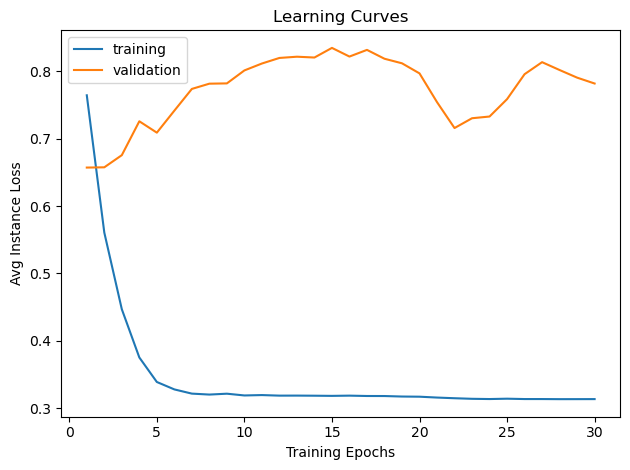

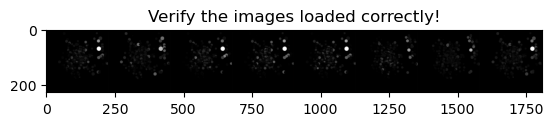

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6940
new best train!
val Loss: 0.6871
new best val!

Epoch 1/29
----------
train Loss: 0.5524
new best train!
val Loss: 0.6912

Epoch 2/29
----------
train Loss: 0.4625
new best train!
val Loss: 0.6669
new best val!

Epoch 3/29
----------
train Loss: 0.3937
new best train!
val Loss: 0.6430
new best val!

Epoch 4/29
----------
train Loss: 0.3490
new best train!
val Loss: 0.6486

Epoch 5/29
----------
train Loss: 0.3300
new best train!
val Loss: 0.6186
new best val!

Epoch 6/29
----------
train Loss: 0.3198
new best train!
val Loss: 0.5969
new best val!

Epoch 7/29
----------
train Loss: 0.3182
new best train!
val Loss: 0.6187

Epoch 8/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.6379

Epoch 9/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.6162

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.5952
new best val!

Epoch 11/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.5779
new best val!

Epoch 12/29
----------

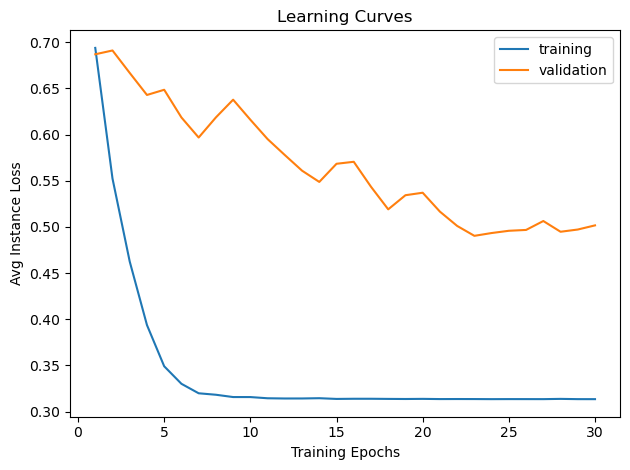

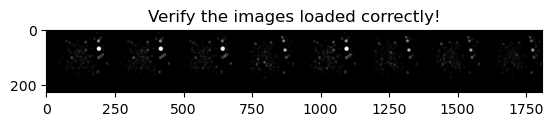

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7111
new best train!
val Loss: 0.8533
new best val!

Epoch 1/29
----------
train Loss: 0.5267
new best train!
val Loss: 0.8451
new best val!

Epoch 2/29
----------
train Loss: 0.4600
new best train!
val Loss: 0.7567
new best val!

Epoch 3/29
----------
train Loss: 0.4086
new best train!
val Loss: 0.6945
new best val!

Epoch 4/29
----------
train Loss: 0.3741
new best train!
val Loss: 0.6915
new best val!

Epoch 5/29
----------
train Loss: 0.3480
new best train!
val Loss: 0.7262

Epoch 6/29
----------
train Loss: 0.3281
new best train!
val Loss: 0.7288

Epoch 7/29
----------
train Loss: 0.3397
val Loss: 0.6833
new best val!

Epoch 8/29
----------
train Loss: 0.3256
new best train!
val Loss: 0.6407
new best val!

Epoch 9/29
----------
train Loss: 0.3362
val Loss: 0.6876

Epoch 10/29
----------
train Loss: 0.3194
new best train!
val Loss: 0.7401

Epoch 11/29
----------
train Loss: 0.3178
new best train!
val Loss: 0.6977

Epoch 12/29
----------
train Loss: 0.3167
new best tra

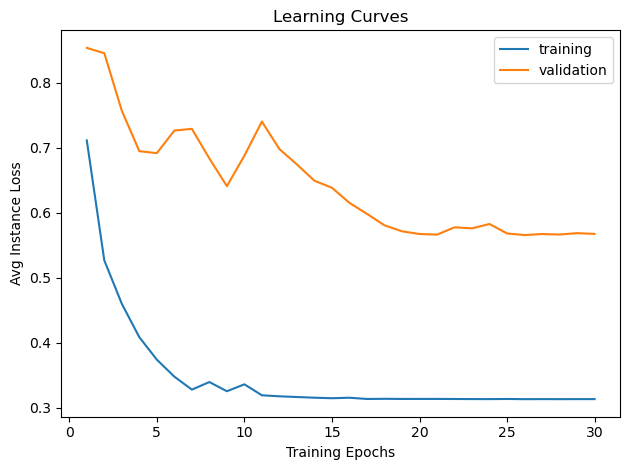

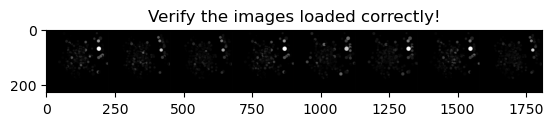

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6689
new best train!
val Loss: 0.7013
new best val!

Epoch 1/29
----------
train Loss: 0.5292
new best train!
val Loss: 0.6921
new best val!

Epoch 2/29
----------
train Loss: 0.4415
new best train!
val Loss: 0.6785
new best val!

Epoch 3/29
----------
train Loss: 0.3677
new best train!
val Loss: 0.6797

Epoch 4/29
----------
train Loss: 0.3345
new best train!
val Loss: 0.6869

Epoch 5/29
----------
train Loss: 0.3215
new best train!
val Loss: 0.6875

Epoch 6/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.6983

Epoch 7/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.6939

Epoch 8/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.6970

Epoch 9/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7051

Epoch 10/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7142

Epoch 11/29
----------
train Loss: 0.3137
new best train!
val Loss: 0.7202

Epoch 12/29
----------
train Loss: 0.3137
val Loss: 0.7165

Epoch 13/29
------

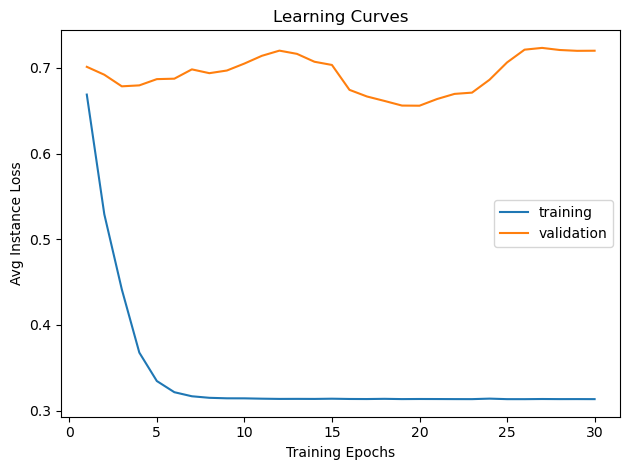

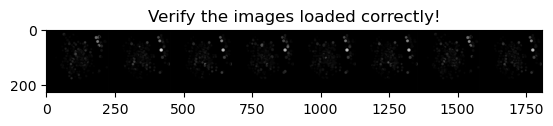

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7030
new best train!
val Loss: 0.6716
new best val!

Epoch 1/29
----------
train Loss: 0.5595
new best train!
val Loss: 0.6874

Epoch 2/29
----------
train Loss: 0.4367
new best train!
val Loss: 0.6833

Epoch 3/29
----------
train Loss: 0.3640
new best train!
val Loss: 0.6936

Epoch 4/29
----------
train Loss: 0.3341
new best train!
val Loss: 0.7169

Epoch 5/29
----------
train Loss: 0.3229
new best train!
val Loss: 0.7429

Epoch 6/29
----------
train Loss: 0.3180
new best train!
val Loss: 0.7719

Epoch 7/29
----------
train Loss: 0.3156
new best train!
val Loss: 0.7729

Epoch 8/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.7598

Epoch 9/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.7456

Epoch 10/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7427

Epoch 11/29
----------
train Loss: 0.3140
val Loss: 0.7422

Epoch 12/29
----------
train Loss: 0.3137
new best train!
val Loss: 0.7443

Epoch 13/29
----------
train Loss: 0.3143
val 

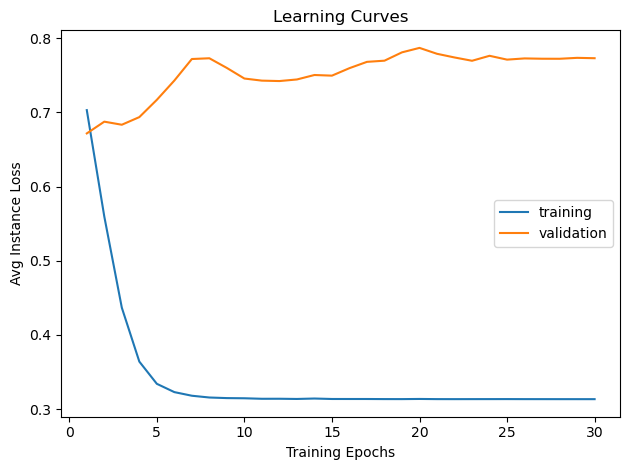

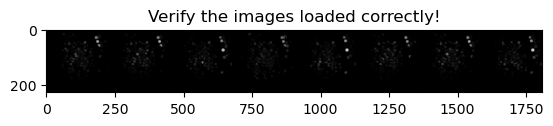

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7119
new best train!
val Loss: 0.7317
new best val!

Epoch 1/29
----------
train Loss: 0.5557
new best train!
val Loss: 0.7456

Epoch 2/29
----------
train Loss: 0.4553
new best train!
val Loss: 0.7410

Epoch 3/29
----------
train Loss: 0.3810
new best train!
val Loss: 0.7255
new best val!

Epoch 4/29
----------
train Loss: 0.3394
new best train!
val Loss: 0.7051
new best val!

Epoch 5/29
----------
train Loss: 0.3247
new best train!
val Loss: 0.6725
new best val!

Epoch 6/29
----------
train Loss: 0.3193
new best train!
val Loss: 0.6516
new best val!

Epoch 7/29
----------
train Loss: 0.3166
new best train!
val Loss: 0.6624

Epoch 8/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.6993

Epoch 9/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.7381

Epoch 10/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.7551

Epoch 11/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7504

Epoch 12/29
----------
train Loss: 0.3139
new best

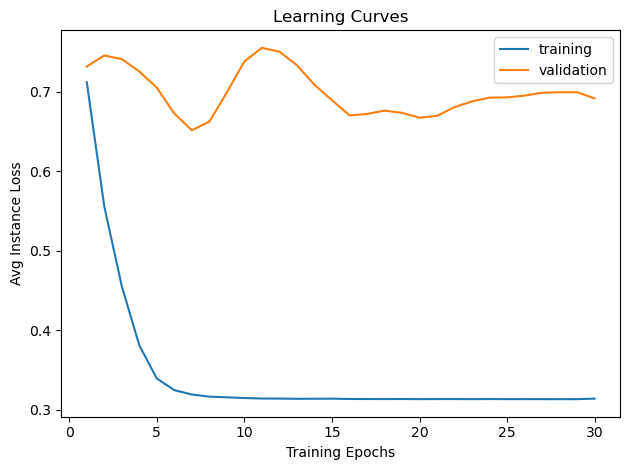

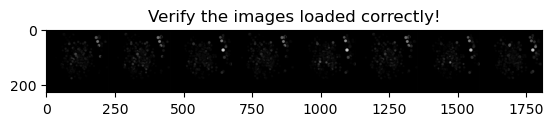

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7260
new best train!
val Loss: 0.6405
new best val!

Epoch 1/29
----------
train Loss: 0.5428
new best train!
val Loss: 0.6676

Epoch 2/29
----------
train Loss: 0.4546
new best train!
val Loss: 0.6775

Epoch 3/29
----------
train Loss: 0.3734
new best train!
val Loss: 0.6742

Epoch 4/29
----------
train Loss: 0.3417
new best train!
val Loss: 0.6794

Epoch 5/29
----------
train Loss: 0.3237
new best train!
val Loss: 0.6471

Epoch 6/29
----------
train Loss: 0.3182
new best train!
val Loss: 0.6174
new best val!

Epoch 7/29
----------
train Loss: 0.3162
new best train!
val Loss: 0.6182

Epoch 8/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.6404

Epoch 9/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.6550

Epoch 10/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.6473

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.6380

Epoch 12/29
----------
train Loss: 0.3140
val Loss: 0.6402

Epoch 13/29
----------
train Los

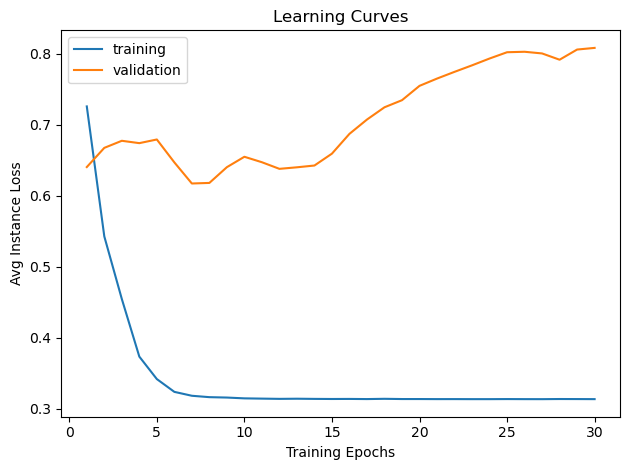

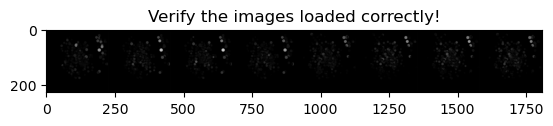

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7159
new best train!
val Loss: 0.6547
new best val!

Epoch 1/29
----------
train Loss: 0.5373
new best train!
val Loss: 0.6392
new best val!

Epoch 2/29
----------
train Loss: 0.4440
new best train!
val Loss: 0.6056
new best val!

Epoch 3/29
----------
train Loss: 0.3748
new best train!
val Loss: 0.6028
new best val!

Epoch 4/29
----------
train Loss: 0.3364
new best train!
val Loss: 0.6151

Epoch 5/29
----------
train Loss: 0.3227
new best train!
val Loss: 0.5925
new best val!

Epoch 6/29
----------
train Loss: 0.3195
new best train!
val Loss: 0.6092

Epoch 7/29
----------
train Loss: 0.3156
new best train!
val Loss: 0.6463

Epoch 8/29
----------
train Loss: 0.3160
val Loss: 0.6542

Epoch 9/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.6338

Epoch 10/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.6372

Epoch 11/29
----------
train Loss: 0.3143
val Loss: 0.6509

Epoch 12/29
----------
train Loss: 0.3137
new best train!
val Loss: 0.6754

Epoch 

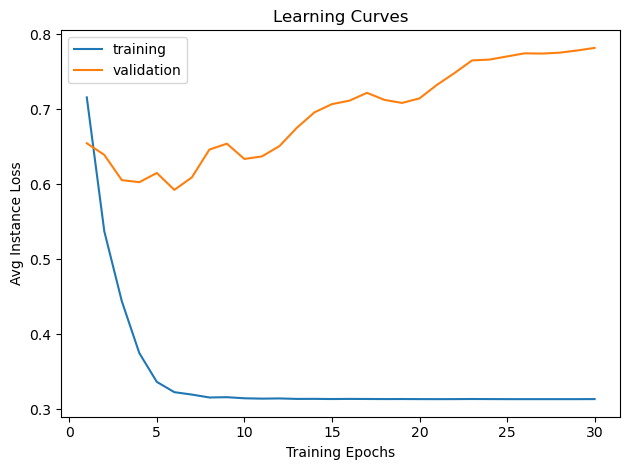

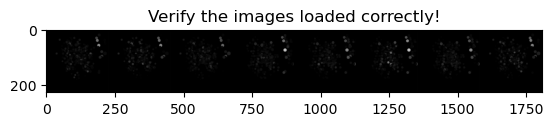

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6892
new best train!
val Loss: 0.7005
new best val!

Epoch 1/29
----------
train Loss: 0.5196
new best train!
val Loss: 0.6358
new best val!

Epoch 2/29
----------
train Loss: 0.4445
new best train!
val Loss: 0.5992
new best val!

Epoch 3/29
----------
train Loss: 0.3744
new best train!
val Loss: 0.5858
new best val!

Epoch 4/29
----------
train Loss: 0.3364
new best train!
val Loss: 0.5924

Epoch 5/29
----------
train Loss: 0.3236
new best train!
val Loss: 0.5974

Epoch 6/29
----------
train Loss: 0.3183
new best train!
val Loss: 0.6010

Epoch 7/29
----------
train Loss: 0.3162
new best train!
val Loss: 0.6135

Epoch 8/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.6407

Epoch 9/29
----------
train Loss: 0.3151
val Loss: 0.6448

Epoch 10/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.6531

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.6560

Epoch 12/29
----------
train Loss: 0.3146
val Loss: 0.6679

Epoch 13/29
--------

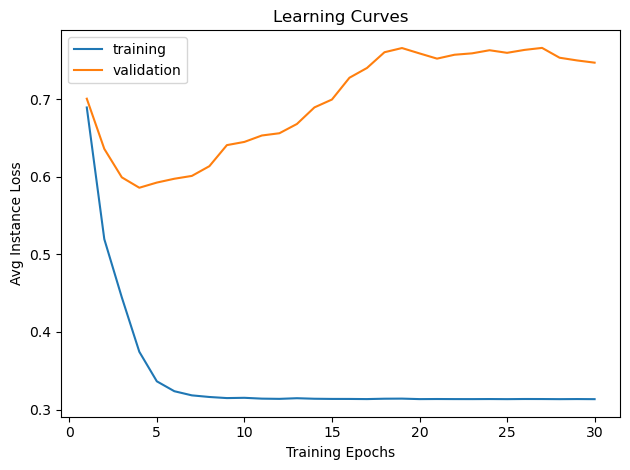

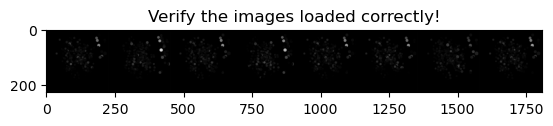

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6992
new best train!
val Loss: 0.7014
new best val!

Epoch 1/29
----------
train Loss: 0.5667
new best train!
val Loss: 0.7128

Epoch 2/29
----------
train Loss: 0.4533
new best train!
val Loss: 0.7349

Epoch 3/29
----------
train Loss: 0.3901
new best train!
val Loss: 0.7345

Epoch 4/29
----------
train Loss: 0.3510
new best train!
val Loss: 0.6948
new best val!

Epoch 5/29
----------
train Loss: 0.3316
new best train!
val Loss: 0.6714
new best val!

Epoch 6/29
----------
train Loss: 0.3178
new best train!
val Loss: 0.6399
new best val!

Epoch 7/29
----------
train Loss: 0.3164
new best train!
val Loss: 0.6098
new best val!

Epoch 8/29
----------
train Loss: 0.3189
val Loss: 0.6075
new best val!

Epoch 9/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.6439

Epoch 10/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.6767

Epoch 11/29
----------
train Loss: 0.3150
val Loss: 0.6976

Epoch 12/29
----------
train Loss: 0.3140
new best train!
val Loss: 

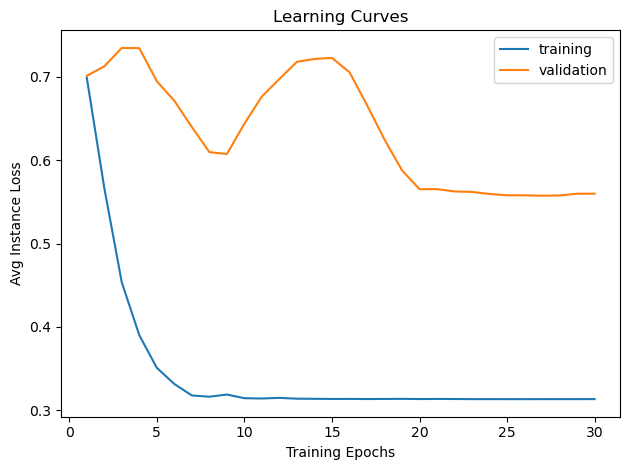

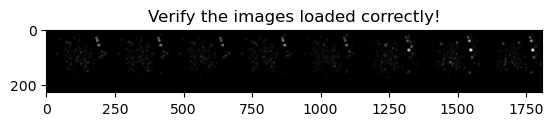

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7142
new best train!
val Loss: 0.6614
new best val!

Epoch 1/29
----------
train Loss: 0.5673
new best train!
val Loss: 0.6538
new best val!

Epoch 2/29
----------
train Loss: 0.4543
new best train!
val Loss: 0.6903

Epoch 3/29
----------
train Loss: 0.4021
new best train!
val Loss: 0.6562

Epoch 4/29
----------
train Loss: 0.3575
new best train!
val Loss: 0.6266
new best val!

Epoch 5/29
----------
train Loss: 0.3343
new best train!
val Loss: 0.6509

Epoch 6/29
----------
train Loss: 0.3246
new best train!
val Loss: 0.6418

Epoch 7/29
----------
train Loss: 0.3193
new best train!
val Loss: 0.6203
new best val!

Epoch 8/29
----------
train Loss: 0.3156
new best train!
val Loss: 0.6053
new best val!

Epoch 9/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.6192

Epoch 10/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.6530

Epoch 11/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.6850

Epoch 12/29
----------
train Loss: 0.3139
new best

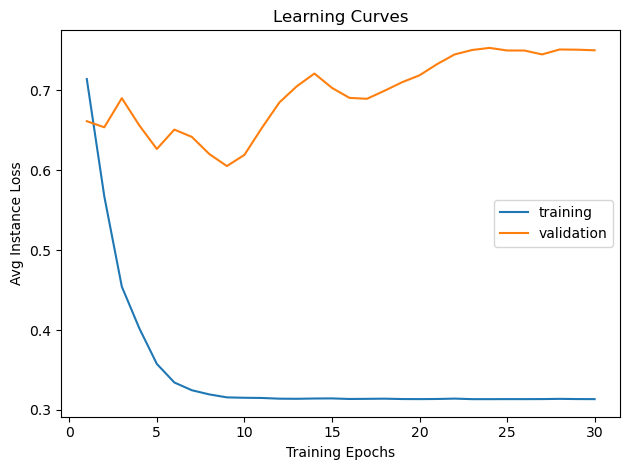

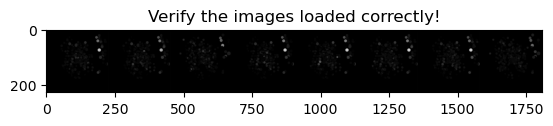

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6977
new best train!
val Loss: 0.7587
new best val!

Epoch 1/29
----------
train Loss: 0.5453
new best train!
val Loss: 0.7645

Epoch 2/29
----------
train Loss: 0.4334
new best train!
val Loss: 0.7521
new best val!

Epoch 3/29
----------
train Loss: 0.3785
new best train!
val Loss: 0.7158
new best val!

Epoch 4/29
----------
train Loss: 0.3420
new best train!
val Loss: 0.7156
new best val!

Epoch 5/29
----------
train Loss: 0.3281
new best train!
val Loss: 0.7358

Epoch 6/29
----------
train Loss: 0.3195
new best train!
val Loss: 0.7141
new best val!

Epoch 7/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.7189

Epoch 8/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.7603

Epoch 9/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7637

Epoch 10/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7536

Epoch 11/29
----------
train Loss: 0.3137
new best train!
val Loss: 0.7461

Epoch 12/29
----------
train Loss: 0.3138
val Loss

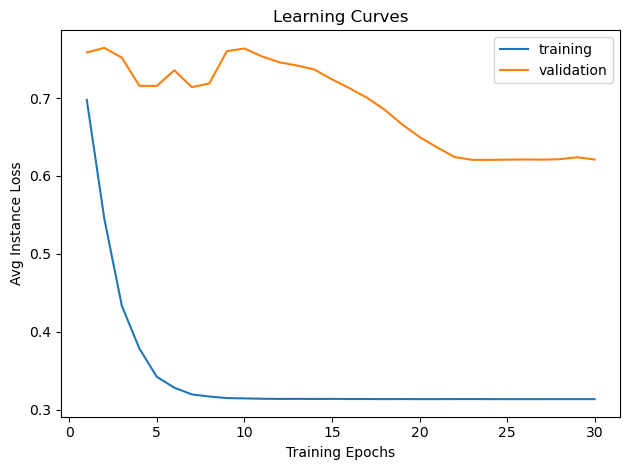

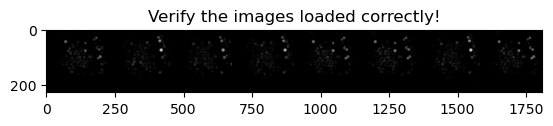

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7007
new best train!
val Loss: 0.7271
new best val!

Epoch 1/29
----------
train Loss: 0.5565
new best train!
val Loss: 0.6868
new best val!

Epoch 2/29
----------
train Loss: 0.4585
new best train!
val Loss: 0.6644
new best val!

Epoch 3/29
----------
train Loss: 0.3814
new best train!
val Loss: 0.6628
new best val!

Epoch 4/29
----------
train Loss: 0.3474
new best train!
val Loss: 0.6401
new best val!

Epoch 5/29
----------
train Loss: 0.3302
new best train!
val Loss: 0.6429

Epoch 6/29
----------
train Loss: 0.3262
new best train!
val Loss: 0.6461

Epoch 7/29
----------
train Loss: 0.3199
new best train!
val Loss: 0.6508

Epoch 8/29
----------
train Loss: 0.3219
val Loss: 0.6599

Epoch 9/29
----------
train Loss: 0.3196
new best train!
val Loss: 0.6569

Epoch 10/29
----------
train Loss: 0.3185
new best train!
val Loss: 0.6503

Epoch 11/29
----------
train Loss: 0.3184
new best train!
val Loss: 0.6653

Epoch 12/29
----------
train Loss: 0.3182
new best train!
val Loss

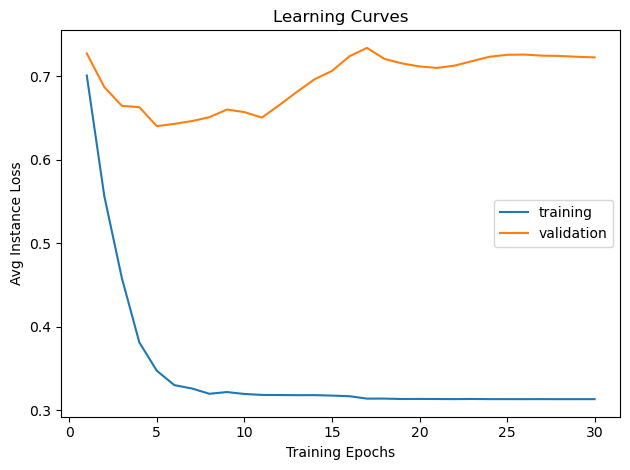

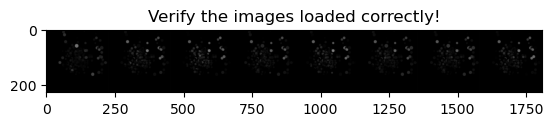

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6988
new best train!
val Loss: 0.6708
new best val!

Epoch 1/29
----------
train Loss: 0.5271
new best train!
val Loss: 0.6732

Epoch 2/29
----------
train Loss: 0.4407
new best train!
val Loss: 0.6433
new best val!

Epoch 3/29
----------
train Loss: 0.3702
new best train!
val Loss: 0.5981
new best val!

Epoch 4/29
----------
train Loss: 0.3380
new best train!
val Loss: 0.5590
new best val!

Epoch 5/29
----------
train Loss: 0.3275
new best train!
val Loss: 0.5440
new best val!

Epoch 6/29
----------
train Loss: 0.3179
new best train!
val Loss: 0.5491

Epoch 7/29
----------
train Loss: 0.3167
new best train!
val Loss: 0.5458

Epoch 8/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.5299
new best val!

Epoch 9/29
----------
train Loss: 0.3148
val Loss: 0.5300

Epoch 10/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.5509

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.5722

Epoch 12/29
----------
train Loss: 0.3139
val Loss: 

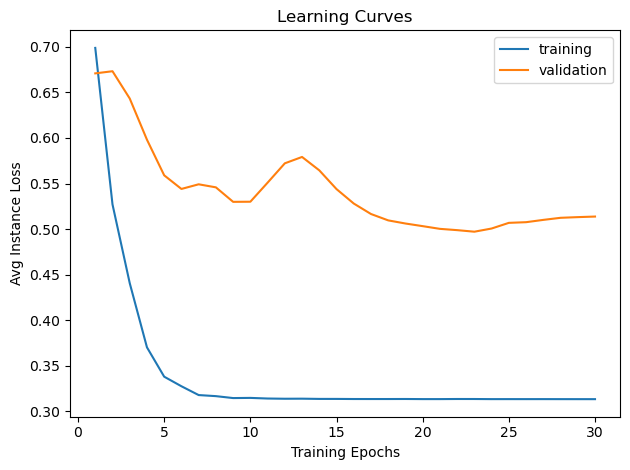

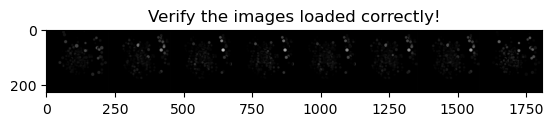

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7285
new best train!
val Loss: 0.7303
new best val!

Epoch 1/29
----------
train Loss: 0.5856
new best train!
val Loss: 0.7460

Epoch 2/29
----------
train Loss: 0.4634
new best train!
val Loss: 0.7695

Epoch 3/29
----------
train Loss: 0.3913
new best train!
val Loss: 0.8360

Epoch 4/29
----------
train Loss: 0.3541
new best train!
val Loss: 0.8589

Epoch 5/29
----------
train Loss: 0.3315
new best train!
val Loss: 0.9045

Epoch 6/29
----------
train Loss: 0.3252
new best train!
val Loss: 0.9075

Epoch 7/29
----------
train Loss: 0.3208
new best train!
val Loss: 0.9024

Epoch 8/29
----------
train Loss: 0.3198
new best train!
val Loss: 0.8930

Epoch 9/29
----------
train Loss: 0.3196
new best train!
val Loss: 0.8701

Epoch 10/29
----------
train Loss: 0.3178
new best train!
val Loss: 0.8651

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.8896

Epoch 12/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.8930

Epoch 13/29
----------
train L

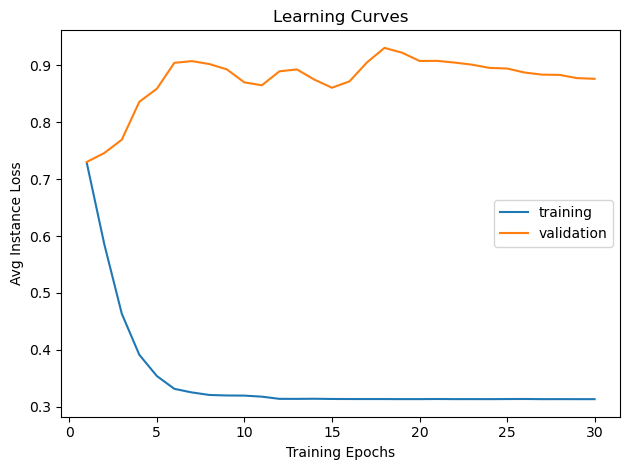

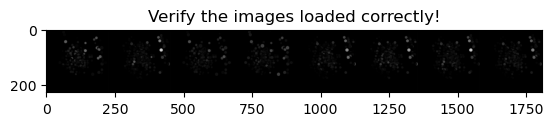

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7090
new best train!
val Loss: 0.7267
new best val!

Epoch 1/29
----------
train Loss: 0.5261
new best train!
val Loss: 0.7233
new best val!

Epoch 2/29
----------
train Loss: 0.4218
new best train!
val Loss: 0.7451

Epoch 3/29
----------
train Loss: 0.3557
new best train!
val Loss: 0.7813

Epoch 4/29
----------
train Loss: 0.3310
new best train!
val Loss: 0.8000

Epoch 5/29
----------
train Loss: 0.3242
new best train!
val Loss: 0.8757

Epoch 6/29
----------
train Loss: 0.3195
new best train!
val Loss: 0.8852

Epoch 7/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.8730

Epoch 8/29
----------
train Loss: 0.3155
val Loss: 0.8692

Epoch 9/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.8720

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.8647

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.8587

Epoch 12/29
----------
train Loss: 0.3140
val Loss: 0.8538

Epoch 13/29
----------
train Loss: 0.3136
new be

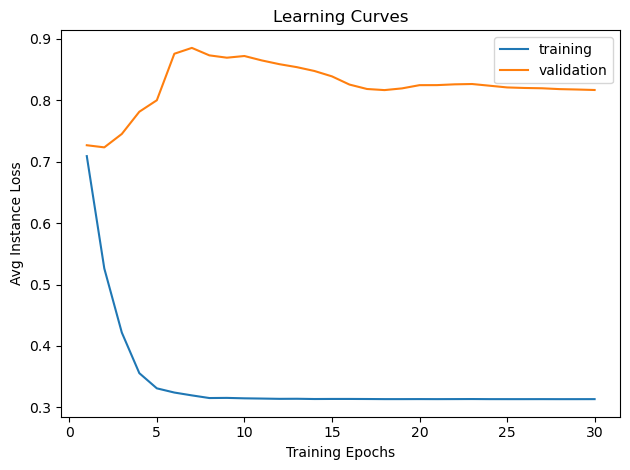

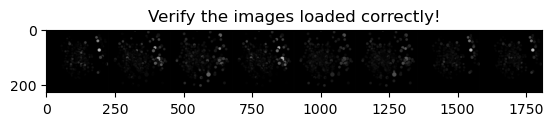

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6983
new best train!
val Loss: 0.6501
new best val!

Epoch 1/29
----------
train Loss: 0.5110
new best train!
val Loss: 0.6329
new best val!

Epoch 2/29
----------
train Loss: 0.4229
new best train!
val Loss: 0.6199
new best val!

Epoch 3/29
----------
train Loss: 0.3635
new best train!
val Loss: 0.6108
new best val!

Epoch 4/29
----------
train Loss: 0.3376
new best train!
val Loss: 0.6473

Epoch 5/29
----------
train Loss: 0.3221
new best train!
val Loss: 0.6842

Epoch 6/29
----------
train Loss: 0.3192
new best train!
val Loss: 0.6841

Epoch 7/29
----------
train Loss: 0.3156
new best train!
val Loss: 0.6565

Epoch 8/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.6426

Epoch 9/29
----------
train Loss: 0.3153
val Loss: 0.6439

Epoch 10/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.6674

Epoch 11/29
----------
train Loss: 0.3140
val Loss: 0.6653

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.6605

Epoch 13/29
--------

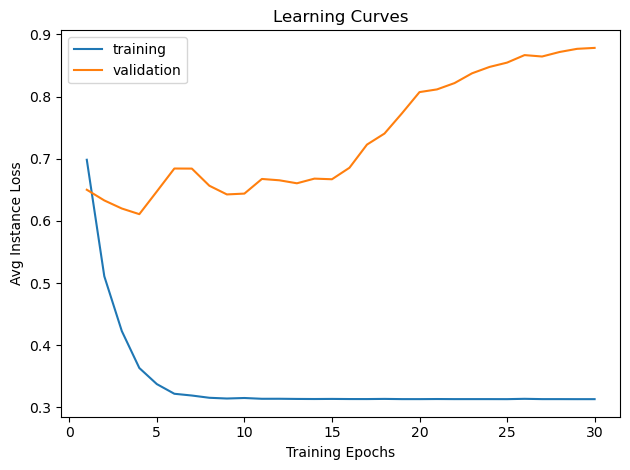

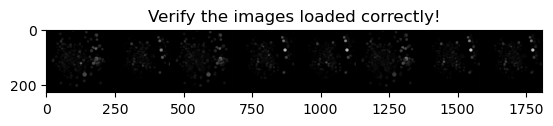

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7538
new best train!
val Loss: 0.7889
new best val!

Epoch 1/29
----------
train Loss: 0.6172
new best train!
val Loss: 0.7798
new best val!

Epoch 2/29
----------
train Loss: 0.4866
new best train!
val Loss: 0.7210
new best val!

Epoch 3/29
----------
train Loss: 0.4127
new best train!
val Loss: 0.7108
new best val!

Epoch 4/29
----------
train Loss: 0.3670
new best train!
val Loss: 0.6681
new best val!

Epoch 5/29
----------
train Loss: 0.3479
new best train!
val Loss: 0.6761

Epoch 6/29
----------
train Loss: 0.3318
new best train!
val Loss: 0.6990

Epoch 7/29
----------
train Loss: 0.3226
new best train!
val Loss: 0.6871

Epoch 8/29
----------
train Loss: 0.3234
val Loss: 0.7138

Epoch 9/29
----------
train Loss: 0.3199
new best train!
val Loss: 0.7291

Epoch 10/29
----------
train Loss: 0.3192
new best train!
val Loss: 0.7702

Epoch 11/29
----------
train Loss: 0.3190
new best train!
val Loss: 0.7711

Epoch 12/29
----------
train Loss: 0.3148
new best train!
val Loss

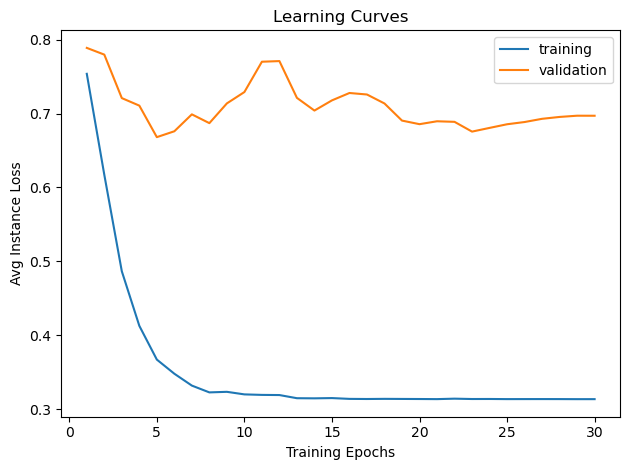

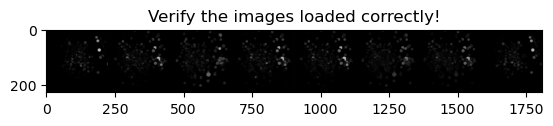

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6971
new best train!
val Loss: 0.6850
new best val!

Epoch 1/29
----------
train Loss: 0.5340
new best train!
val Loss: 0.6557
new best val!

Epoch 2/29
----------
train Loss: 0.4571
new best train!
val Loss: 0.6902

Epoch 3/29
----------
train Loss: 0.3816
new best train!
val Loss: 0.7089

Epoch 4/29
----------
train Loss: 0.3454
new best train!
val Loss: 0.7784

Epoch 5/29
----------
train Loss: 0.3319
new best train!
val Loss: 0.8001

Epoch 6/29
----------
train Loss: 0.3233
new best train!
val Loss: 0.8316

Epoch 7/29
----------
train Loss: 0.3160
new best train!
val Loss: 0.8939

Epoch 8/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.9222

Epoch 9/29
----------
train Loss: 0.3161
val Loss: 0.9264

Epoch 10/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.8896

Epoch 11/29
----------
train Loss: 0.3204
val Loss: 0.9452

Epoch 12/29
----------
train Loss: 0.3191
val Loss: 0.8915

Epoch 13/29
----------
train Loss: 0.3143
val Loss: 0.8156

Epoc

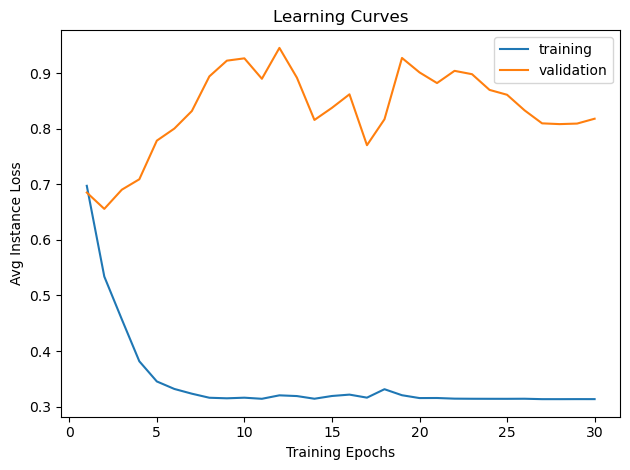

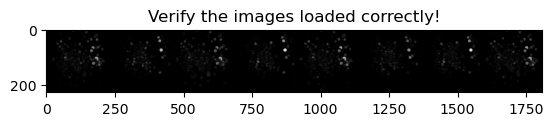

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6903
new best train!
val Loss: 0.7040
new best val!

Epoch 1/29
----------
train Loss: 0.5494
new best train!
val Loss: 0.7271

Epoch 2/29
----------
train Loss: 0.4500
new best train!
val Loss: 0.7513

Epoch 3/29
----------
train Loss: 0.3990
new best train!
val Loss: 0.7494

Epoch 4/29
----------
train Loss: 0.3534
new best train!
val Loss: 0.7411

Epoch 5/29
----------
train Loss: 0.3335
new best train!
val Loss: 0.7188

Epoch 6/29
----------
train Loss: 0.3241
new best train!
val Loss: 0.7266

Epoch 7/29
----------
train Loss: 0.3205
new best train!
val Loss: 0.7397

Epoch 8/29
----------
train Loss: 0.3217
val Loss: 0.7167

Epoch 9/29
----------
train Loss: 0.3179
new best train!
val Loss: 0.6703
new best val!

Epoch 10/29
----------
train Loss: 0.3175
new best train!
val Loss: 0.7366

Epoch 11/29
----------
train Loss: 0.3216
val Loss: 0.6214
new best val!

Epoch 12/29
----------
train Loss: 0.3302
val Loss: 0.6456

Epoch 13/29
----------
train Loss: 0.3280
val Loss

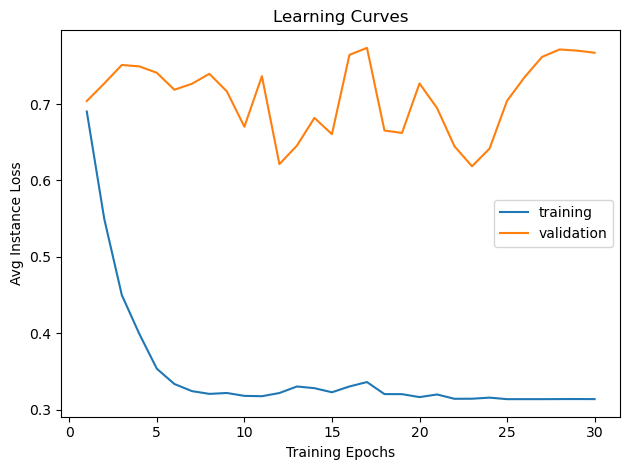

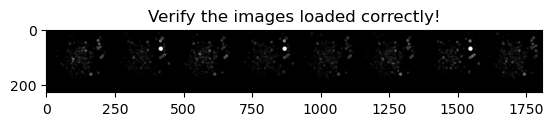

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7230
new best train!
val Loss: 0.8175
new best val!

Epoch 1/29
----------
train Loss: 0.5496
new best train!
val Loss: 0.7601
new best val!

Epoch 2/29
----------
train Loss: 0.4619
new best train!
val Loss: 0.7239
new best val!

Epoch 3/29
----------
train Loss: 0.4047
new best train!
val Loss: 0.7338

Epoch 4/29
----------
train Loss: 0.3680
new best train!
val Loss: 0.7884

Epoch 5/29
----------
train Loss: 0.3351
new best train!
val Loss: 0.8200

Epoch 6/29
----------
train Loss: 0.3288
new best train!
val Loss: 0.8268

Epoch 7/29
----------
train Loss: 0.3243
new best train!
val Loss: 0.8262

Epoch 8/29
----------
train Loss: 0.3223
new best train!
val Loss: 0.8340

Epoch 9/29
----------
train Loss: 0.3201
new best train!
val Loss: 0.8396

Epoch 10/29
----------
train Loss: 0.3195
new best train!
val Loss: 0.8636

Epoch 11/29
----------
train Loss: 0.3187
new best train!
val Loss: 0.8788

Epoch 12/29
----------
train Loss: 0.3183
new best train!
val Loss: 0.8871

Ep

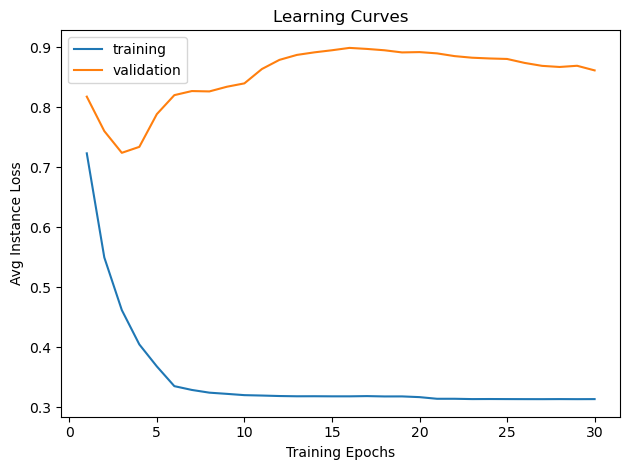

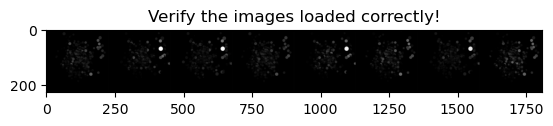

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6778
new best train!
val Loss: 0.7304
new best val!

Epoch 1/29
----------
train Loss: 0.5283
new best train!
val Loss: 0.7197
new best val!

Epoch 2/29
----------
train Loss: 0.4492
new best train!
val Loss: 0.6866
new best val!

Epoch 3/29
----------
train Loss: 0.3891
new best train!
val Loss: 0.7024

Epoch 4/29
----------
train Loss: 0.3483
new best train!
val Loss: 0.7161

Epoch 5/29
----------
train Loss: 0.3285
new best train!
val Loss: 0.7362

Epoch 6/29
----------
train Loss: 0.3208
new best train!
val Loss: 0.7233

Epoch 7/29
----------
train Loss: 0.3168
new best train!
val Loss: 0.7175

Epoch 8/29
----------
train Loss: 0.3160
new best train!
val Loss: 0.7386

Epoch 9/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.7595

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7648

Epoch 11/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.7651

Epoch 12/29
----------
train Loss: 0.3142
val Loss: 0.7644

Epoch 13/29
------

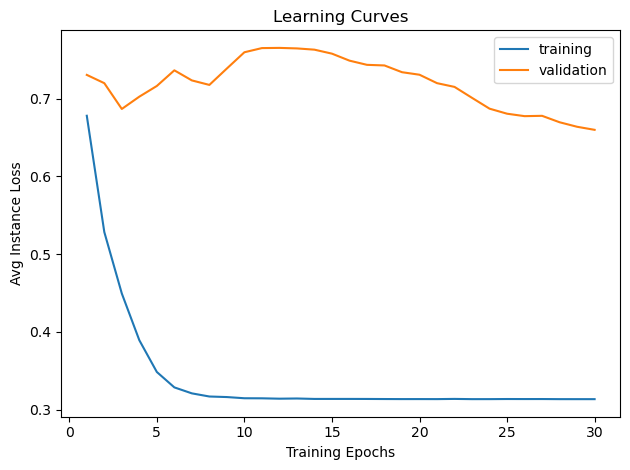

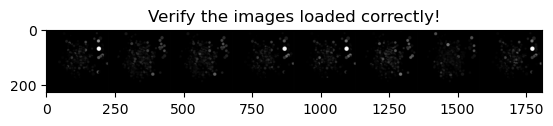

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6975
new best train!
val Loss: 0.7261
new best val!

Epoch 1/29
----------
train Loss: 0.5447
new best train!
val Loss: 0.7427

Epoch 2/29
----------
train Loss: 0.4483
new best train!
val Loss: 0.7887

Epoch 3/29
----------
train Loss: 0.3788
new best train!
val Loss: 0.7888

Epoch 4/29
----------
train Loss: 0.3449
new best train!
val Loss: 0.7924

Epoch 5/29
----------
train Loss: 0.3302
new best train!
val Loss: 0.7827

Epoch 6/29
----------
train Loss: 0.3191
new best train!
val Loss: 0.7644

Epoch 7/29
----------
train Loss: 0.3158
new best train!
val Loss: 0.7752

Epoch 8/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7899

Epoch 9/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7938

Epoch 10/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7941

Epoch 11/29
----------
train Loss: 0.3140
val Loss: 0.7982

Epoch 12/29
----------
train Loss: 0.3140
val Loss: 0.7992

Epoch 13/29
----------
train Loss: 0.3136
new best train!
val 

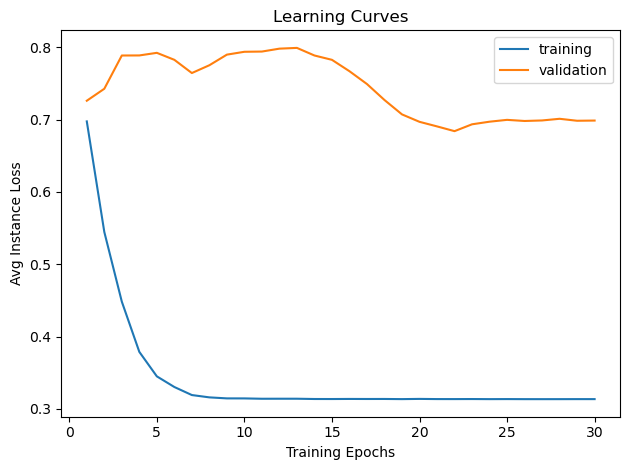

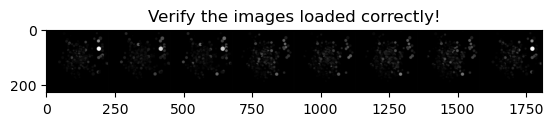

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6737
new best train!
val Loss: 0.7073
new best val!

Epoch 1/29
----------
train Loss: 0.5276
new best train!
val Loss: 0.7224

Epoch 2/29
----------
train Loss: 0.4546
new best train!
val Loss: 0.7086

Epoch 3/29
----------
train Loss: 0.3978
new best train!
val Loss: 0.7102

Epoch 4/29
----------
train Loss: 0.3613
new best train!
val Loss: 0.7079

Epoch 5/29
----------
train Loss: 0.3301
new best train!
val Loss: 0.7081

Epoch 6/29
----------
train Loss: 0.3280
new best train!
val Loss: 0.7094

Epoch 7/29
----------
train Loss: 0.3186
new best train!
val Loss: 0.7127

Epoch 8/29
----------
train Loss: 0.3189
val Loss: 0.7141

Epoch 9/29
----------
train Loss: 0.3154
new best train!
val Loss: 0.7092

Epoch 10/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.7079

Epoch 11/29
----------
train Loss: 0.3154
val Loss: 0.7065
new best val!

Epoch 12/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.7145

Epoch 13/29
----------
train Loss: 0.3139
new be

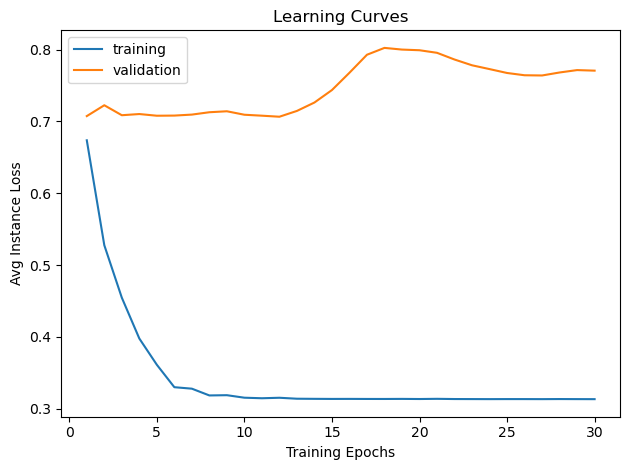

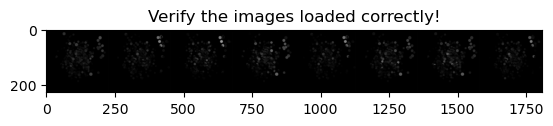

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7122
new best train!
val Loss: 0.6827
new best val!

Epoch 1/29
----------
train Loss: 0.5459
new best train!
val Loss: 0.7029

Epoch 2/29
----------
train Loss: 0.4390
new best train!
val Loss: 0.7655

Epoch 3/29
----------
train Loss: 0.3837
new best train!
val Loss: 0.7970

Epoch 4/29
----------
train Loss: 0.3445
new best train!
val Loss: 0.8150

Epoch 5/29
----------
train Loss: 0.3275
new best train!
val Loss: 0.8507

Epoch 6/29
----------
train Loss: 0.3207
new best train!
val Loss: 0.8904

Epoch 7/29
----------
train Loss: 0.3170
new best train!
val Loss: 0.8930

Epoch 8/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.8523

Epoch 9/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.7963

Epoch 10/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7612

Epoch 11/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.7480

Epoch 12/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.7565

Epoch 13/29
----------
train L

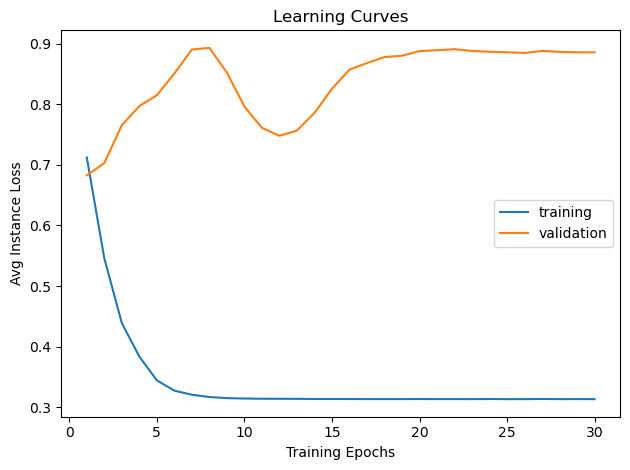

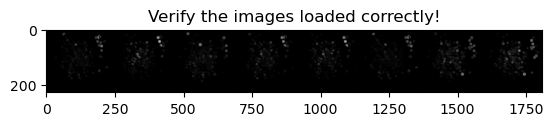

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6970
new best train!
val Loss: 0.6971
new best val!

Epoch 1/29
----------
train Loss: 0.5187
new best train!
val Loss: 0.7284

Epoch 2/29
----------
train Loss: 0.4186
new best train!
val Loss: 0.7509

Epoch 3/29
----------
train Loss: 0.3720
new best train!
val Loss: 0.7676

Epoch 4/29
----------
train Loss: 0.3552
new best train!
val Loss: 0.7515

Epoch 5/29
----------
train Loss: 0.3361
new best train!
val Loss: 0.7733

Epoch 6/29
----------
train Loss: 0.3275
new best train!
val Loss: 0.7760

Epoch 7/29
----------
train Loss: 0.3160
new best train!
val Loss: 0.8061

Epoch 8/29
----------
train Loss: 0.3167
val Loss: 0.7917

Epoch 9/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.7638

Epoch 10/29
----------
train Loss: 0.3161
val Loss: 0.7988

Epoch 11/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.8282

Epoch 12/29
----------
train Loss: 0.3145
val Loss: 0.8079

Epoch 13/29
----------
train Loss: 0.3143
val Loss: 0.7829

Epoch 14/29
------

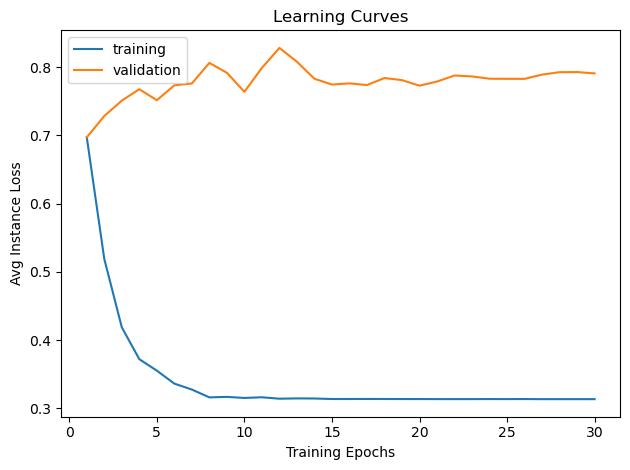

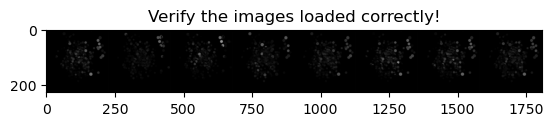

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7022
new best train!
val Loss: 0.6878
new best val!

Epoch 1/29
----------
train Loss: 0.5198
new best train!
val Loss: 0.7028

Epoch 2/29
----------
train Loss: 0.4168
new best train!
val Loss: 0.7264

Epoch 3/29
----------
train Loss: 0.3543
new best train!
val Loss: 0.7686

Epoch 4/29
----------
train Loss: 0.3283
new best train!
val Loss: 0.8232

Epoch 5/29
----------
train Loss: 0.3234
new best train!
val Loss: 0.8377

Epoch 6/29
----------
train Loss: 0.3158
new best train!
val Loss: 0.8655

Epoch 7/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.9073

Epoch 8/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.9382

Epoch 9/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.9577

Epoch 10/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.9760

Epoch 11/29
----------
train Loss: 0.3138
val Loss: 0.9863

Epoch 12/29
----------
train Loss: 0.3136
new best train!
val Loss: 0.9870

Epoch 13/29
----------
train Loss: 0.3136
val 

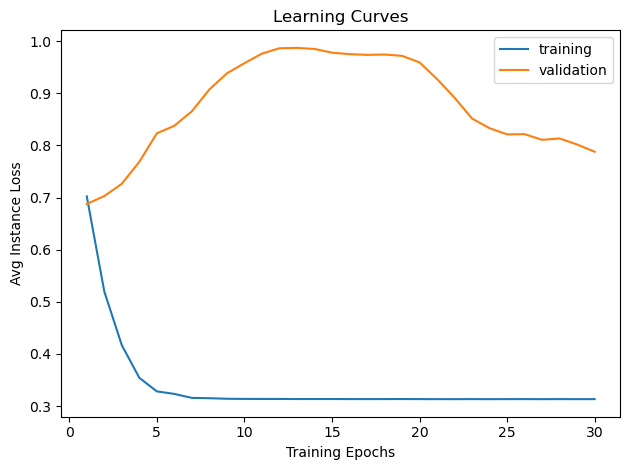

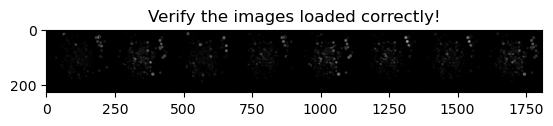

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6982
new best train!
val Loss: 0.7164
new best val!

Epoch 1/29
----------
train Loss: 0.5315
new best train!
val Loss: 0.7275

Epoch 2/29
----------
train Loss: 0.4261
new best train!
val Loss: 0.7412

Epoch 3/29
----------
train Loss: 0.3657
new best train!
val Loss: 0.7283

Epoch 4/29
----------
train Loss: 0.3370
new best train!
val Loss: 0.7054
new best val!

Epoch 5/29
----------
train Loss: 0.3199
new best train!
val Loss: 0.7089

Epoch 6/29
----------
train Loss: 0.3186
new best train!
val Loss: 0.6956
new best val!

Epoch 7/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.6849
new best val!

Epoch 8/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.6968

Epoch 9/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.6984

Epoch 10/29
----------
train Loss: 0.3143
val Loss: 0.6895

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.6800
new best val!

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Loss

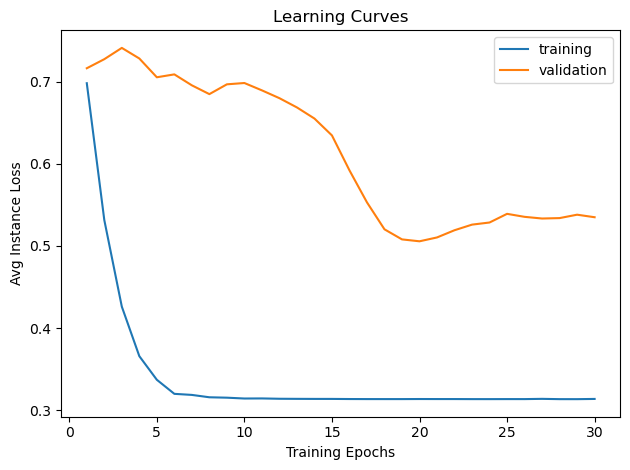

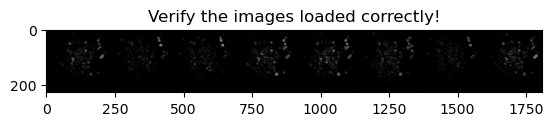

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6873
new best train!
val Loss: 0.7846
new best val!

Epoch 1/29
----------
train Loss: 0.5327
new best train!
val Loss: 0.8399

Epoch 2/29
----------
train Loss: 0.4260
new best train!
val Loss: 0.8783

Epoch 3/29
----------
train Loss: 0.3591
new best train!
val Loss: 0.8932

Epoch 4/29
----------
train Loss: 0.3323
new best train!
val Loss: 0.9009

Epoch 5/29
----------
train Loss: 0.3218
new best train!
val Loss: 0.8991

Epoch 6/29
----------
train Loss: 0.3165
new best train!
val Loss: 0.8922

Epoch 7/29
----------
train Loss: 0.3167
val Loss: 0.8888

Epoch 8/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.8749

Epoch 9/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.8394

Epoch 10/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.8005

Epoch 11/29
----------
train Loss: 0.3137
new best train!
val Loss: 0.7683
new best val!

Epoch 12/29
----------
train Loss: 0.3138
val Loss: 0.7602
new best val!

Epoch 13/29
----------
train Loss:

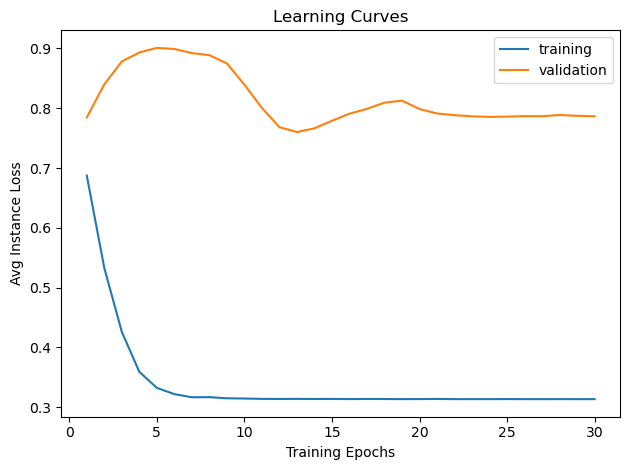

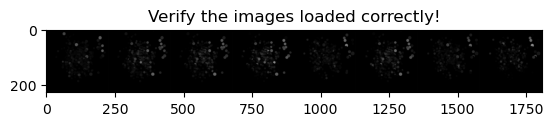

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6897
new best train!
val Loss: 0.6868
new best val!

Epoch 1/29
----------
train Loss: 0.5183
new best train!
val Loss: 0.6924

Epoch 2/29
----------
train Loss: 0.4099
new best train!
val Loss: 0.6959

Epoch 3/29
----------
train Loss: 0.3494
new best train!
val Loss: 0.7015

Epoch 4/29
----------
train Loss: 0.3313
new best train!
val Loss: 0.7063

Epoch 5/29
----------
train Loss: 0.3195
new best train!
val Loss: 0.7155

Epoch 6/29
----------
train Loss: 0.3159
new best train!
val Loss: 0.7436

Epoch 7/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.7368

Epoch 8/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.7421

Epoch 9/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.7741

Epoch 10/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7899

Epoch 11/29
----------
train Loss: 0.3139
val Loss: 0.7954

Epoch 12/29
----------
train Loss: 0.3136
new best train!
val Loss: 0.7979

Epoch 13/29
----------
train Loss: 0.3138
val 

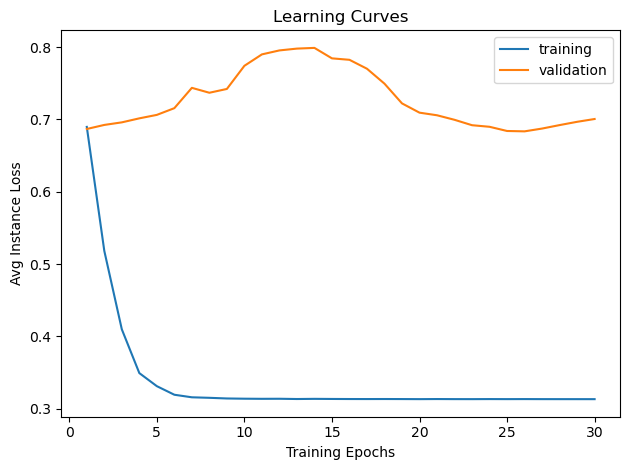

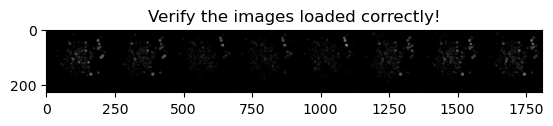

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7020
new best train!
val Loss: 0.5952
new best val!

Epoch 1/29
----------
train Loss: 0.5329
new best train!
val Loss: 0.5509
new best val!

Epoch 2/29
----------
train Loss: 0.4362
new best train!
val Loss: 0.5501
new best val!

Epoch 3/29
----------
train Loss: 0.3772
new best train!
val Loss: 0.5273
new best val!

Epoch 4/29
----------
train Loss: 0.3445
new best train!
val Loss: 0.5197
new best val!

Epoch 5/29
----------
train Loss: 0.3243
new best train!
val Loss: 0.5197

Epoch 6/29
----------
train Loss: 0.3177
new best train!
val Loss: 0.5111
new best val!

Epoch 7/29
----------
train Loss: 0.3163
new best train!
val Loss: 0.5143

Epoch 8/29
----------
train Loss: 0.3156
new best train!
val Loss: 0.5285

Epoch 9/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.5582

Epoch 10/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.5829

Epoch 11/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.6056

Epoch 12/29
----------
train Loss: 0

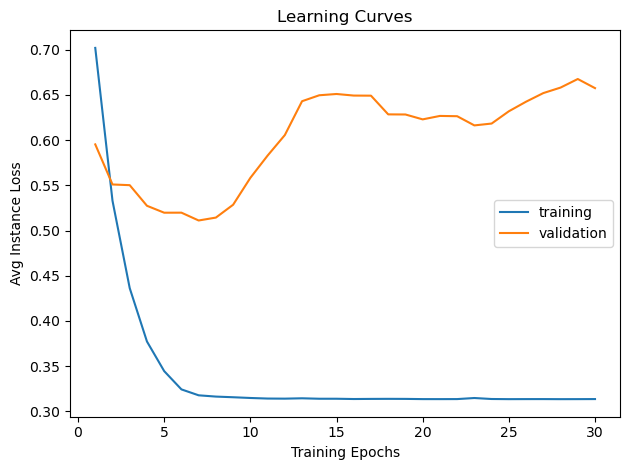

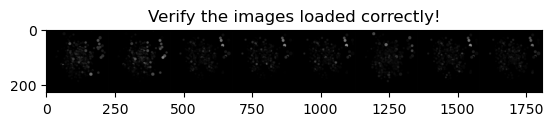

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7241
new best train!
val Loss: 0.6970
new best val!

Epoch 1/29
----------
train Loss: 0.5611
new best train!
val Loss: 0.7039

Epoch 2/29
----------
train Loss: 0.4676
new best train!
val Loss: 0.7007

Epoch 3/29
----------
train Loss: 0.3955
new best train!
val Loss: 0.7007

Epoch 4/29
----------
train Loss: 0.3566
new best train!
val Loss: 0.6772
new best val!

Epoch 5/29
----------
train Loss: 0.3327
new best train!
val Loss: 0.6672
new best val!

Epoch 6/29
----------
train Loss: 0.3205
new best train!
val Loss: 0.6985

Epoch 7/29
----------
train Loss: 0.3200
new best train!
val Loss: 0.7013

Epoch 8/29
----------
train Loss: 0.3154
new best train!
val Loss: 0.7081

Epoch 9/29
----------
train Loss: 0.3163
val Loss: 0.7171

Epoch 10/29
----------
train Loss: 0.3154
new best train!
val Loss: 0.7260

Epoch 11/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7224

Epoch 12/29
----------
train Loss: 0.3145
val Loss: 0.7173

Epoch 13/29
----------
train Loss:

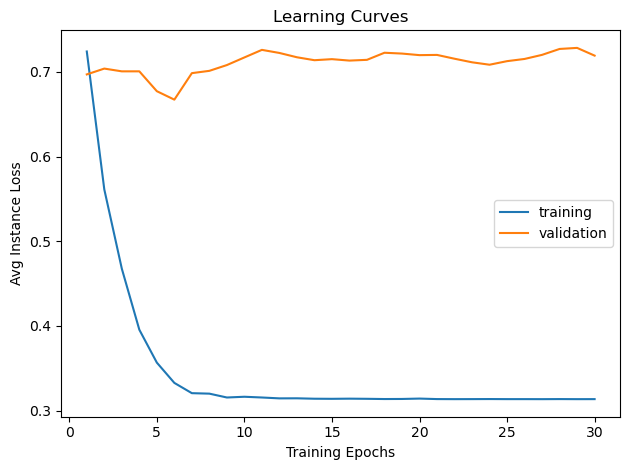

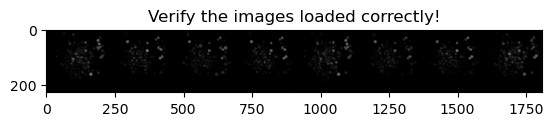

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7275
new best train!
val Loss: 0.6842
new best val!

Epoch 1/29
----------
train Loss: 0.5734
new best train!
val Loss: 0.6871

Epoch 2/29
----------
train Loss: 0.4577
new best train!
val Loss: 0.6856

Epoch 3/29
----------
train Loss: 0.3826
new best train!
val Loss: 0.6900

Epoch 4/29
----------
train Loss: 0.3408
new best train!
val Loss: 0.6945

Epoch 5/29
----------
train Loss: 0.3237
new best train!
val Loss: 0.7044

Epoch 6/29
----------
train Loss: 0.3179
new best train!
val Loss: 0.7100

Epoch 7/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.7116

Epoch 8/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.7210

Epoch 9/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.7333

Epoch 10/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7380

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7407

Epoch 12/29
----------
train Loss: 0.3136
new best train!
val Loss: 0.7443

Epoch 13/29
----------
train L

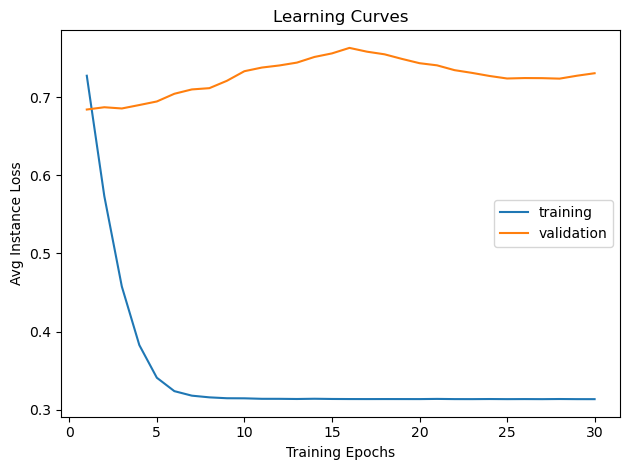

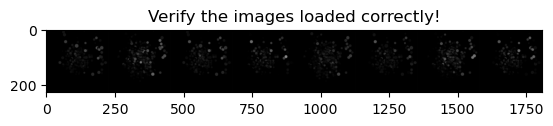

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7495
new best train!
val Loss: 0.6859
new best val!

Epoch 1/29
----------
train Loss: 0.5861
new best train!
val Loss: 0.6666
new best val!

Epoch 2/29
----------
train Loss: 0.4788
new best train!
val Loss: 0.6267
new best val!

Epoch 3/29
----------
train Loss: 0.4155
new best train!
val Loss: 0.6411

Epoch 4/29
----------
train Loss: 0.3692
new best train!
val Loss: 0.6429

Epoch 5/29
----------
train Loss: 0.3462
new best train!
val Loss: 0.7263

Epoch 6/29
----------
train Loss: 0.3277
new best train!
val Loss: 0.7943

Epoch 7/29
----------
train Loss: 0.3216
new best train!
val Loss: 0.7434

Epoch 8/29
----------
train Loss: 0.3162
new best train!
val Loss: 0.7494

Epoch 9/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.7710

Epoch 10/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.7912

Epoch 11/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.7972

Epoch 12/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.7963

Ep

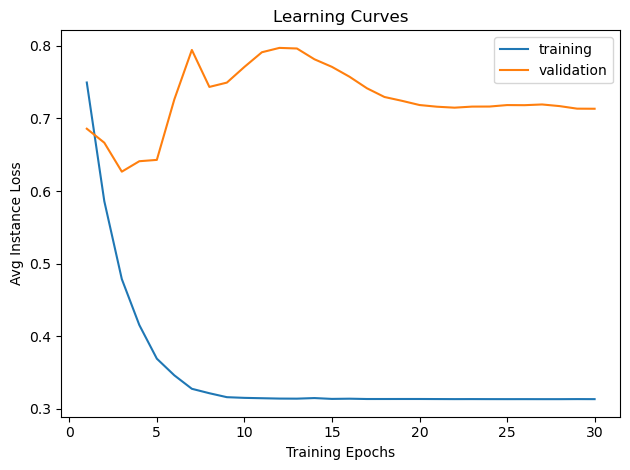

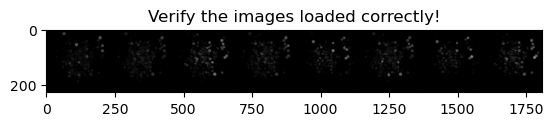

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7099
new best train!
val Loss: 0.7286
new best val!

Epoch 1/29
----------
train Loss: 0.5541
new best train!
val Loss: 0.7123
new best val!

Epoch 2/29
----------
train Loss: 0.4354
new best train!
val Loss: 0.7069
new best val!

Epoch 3/29
----------
train Loss: 0.3763
new best train!
val Loss: 0.7948

Epoch 4/29
----------
train Loss: 0.3380
new best train!
val Loss: 0.7407

Epoch 5/29
----------
train Loss: 0.3292
new best train!
val Loss: 0.7622

Epoch 6/29
----------
train Loss: 0.3230
new best train!
val Loss: 0.7335

Epoch 7/29
----------
train Loss: 0.3178
new best train!
val Loss: 0.6906
new best val!

Epoch 8/29
----------
train Loss: 0.3157
new best train!
val Loss: 0.6893
new best val!

Epoch 9/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.6948

Epoch 10/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.7146

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.7336

Epoch 12/29
----------
train Loss: 0.3138
new best

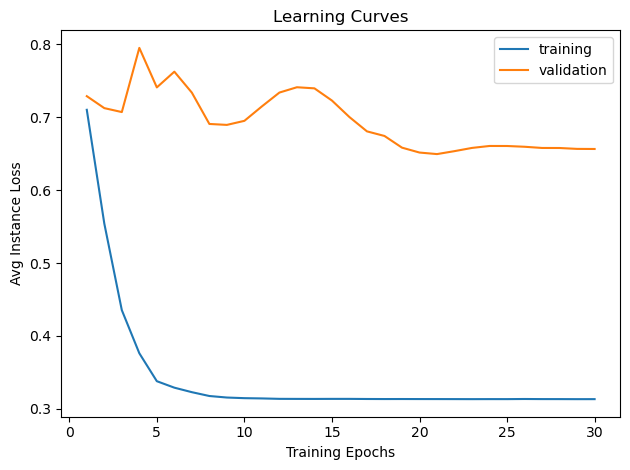

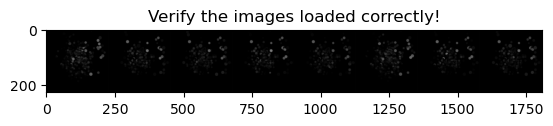

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7277
new best train!
val Loss: 0.7142
new best val!

Epoch 1/29
----------
train Loss: 0.5559
new best train!
val Loss: 0.7319

Epoch 2/29
----------
train Loss: 0.4417
new best train!
val Loss: 0.7389

Epoch 3/29
----------
train Loss: 0.3781
new best train!
val Loss: 0.7671

Epoch 4/29
----------
train Loss: 0.3482
new best train!
val Loss: 0.8335

Epoch 5/29
----------
train Loss: 0.3391
new best train!
val Loss: 0.8478

Epoch 6/29
----------
train Loss: 0.3208
new best train!
val Loss: 0.8436

Epoch 7/29
----------
train Loss: 0.3209
val Loss: 0.7269

Epoch 8/29
----------
train Loss: 0.3165
new best train!
val Loss: 0.7020
new best val!

Epoch 9/29
----------
train Loss: 0.3173
val Loss: 0.7003
new best val!

Epoch 10/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.7402

Epoch 11/29
----------
train Loss: 0.3151
val Loss: 0.7340

Epoch 12/29
----------
train Loss: 0.3137
new best train!
val Loss: 0.6937
new best val!

Epoch 13/29
----------
train Loss: 0

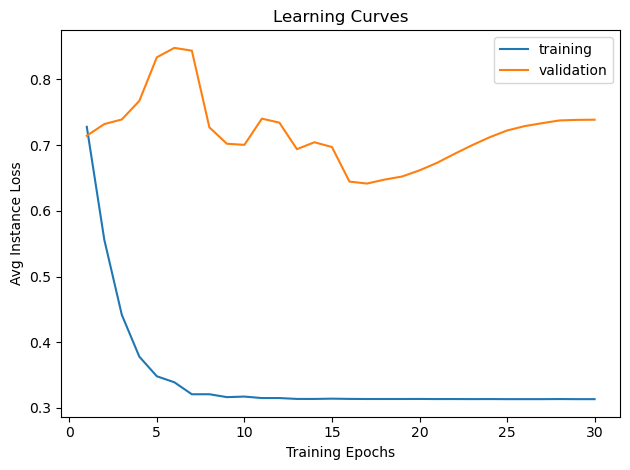

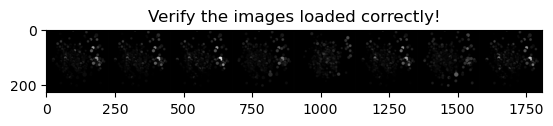

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6863
new best train!
val Loss: 0.7140
new best val!

Epoch 1/29
----------
train Loss: 0.5112
new best train!
val Loss: 0.7093
new best val!

Epoch 2/29
----------
train Loss: 0.4162
new best train!
val Loss: 0.6808
new best val!

Epoch 3/29
----------
train Loss: 0.3971
new best train!
val Loss: 0.7203

Epoch 4/29
----------
train Loss: 0.3513
new best train!
val Loss: 0.7408

Epoch 5/29
----------
train Loss: 0.3290
new best train!
val Loss: 0.7675

Epoch 6/29
----------
train Loss: 0.3313
val Loss: 0.8225

Epoch 7/29
----------
train Loss: 0.3215
new best train!
val Loss: 0.8350

Epoch 8/29
----------
train Loss: 0.3189
new best train!
val Loss: 0.8463

Epoch 9/29
----------
train Loss: 0.3173
new best train!
val Loss: 0.8486

Epoch 10/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.8256

Epoch 11/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.8111

Epoch 12/29
----------
train Loss: 0.3140
new best train!
val Loss: 0.8101

Epoch 13/29
------

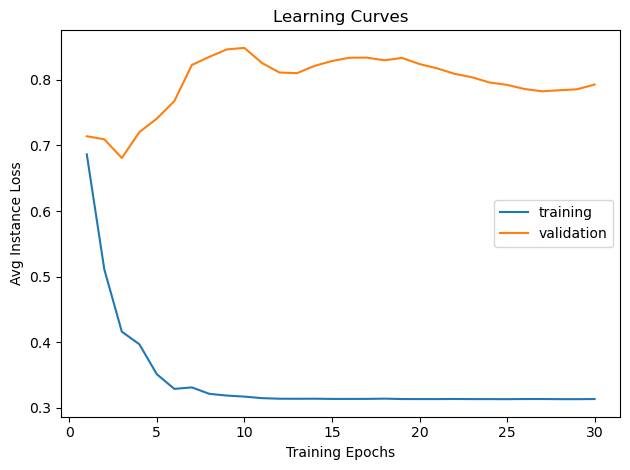

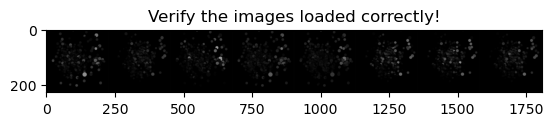

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6897
new best train!
val Loss: 0.6962
new best val!

Epoch 1/29
----------
train Loss: 0.5226
new best train!
val Loss: 0.6867
new best val!

Epoch 2/29
----------
train Loss: 0.4161
new best train!
val Loss: 0.7051

Epoch 3/29
----------
train Loss: 0.3607
new best train!
val Loss: 0.7130

Epoch 4/29
----------
train Loss: 0.3398
new best train!
val Loss: 0.7276

Epoch 5/29
----------
train Loss: 0.3361
new best train!
val Loss: 0.7571

Epoch 6/29
----------
train Loss: 0.3311
new best train!
val Loss: 0.7984

Epoch 7/29
----------
train Loss: 0.3209
new best train!
val Loss: 0.7576

Epoch 8/29
----------
train Loss: 0.3203
new best train!
val Loss: 0.7417

Epoch 9/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.7426

Epoch 10/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.7290

Epoch 11/29
----------
train Loss: 0.3151
val Loss: 0.7132

Epoch 12/29
----------
train Loss: 0.3169
val Loss: 0.6997

Epoch 13/29
----------
train Loss: 0.3193
val Lo

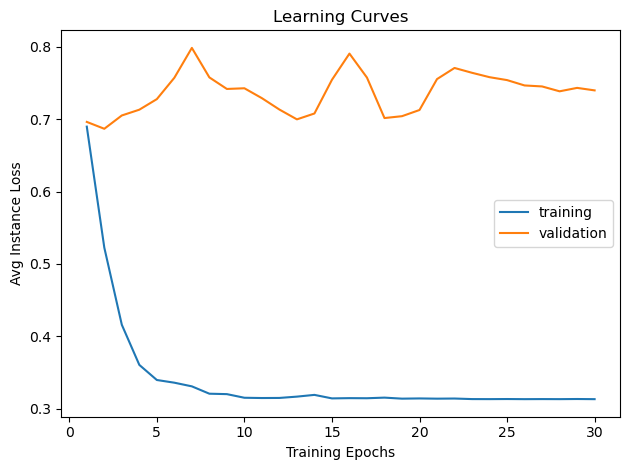

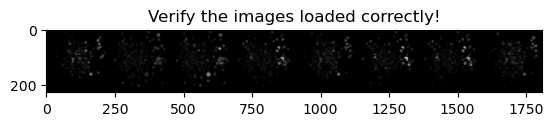

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7010
new best train!
val Loss: 0.6989
new best val!

Epoch 1/29
----------
train Loss: 0.5368
new best train!
val Loss: 0.7263

Epoch 2/29
----------
train Loss: 0.4440
new best train!
val Loss: 0.6984
new best val!

Epoch 3/29
----------
train Loss: 0.3951
new best train!
val Loss: 0.7139

Epoch 4/29
----------
train Loss: 0.3531
new best train!
val Loss: 0.7104

Epoch 5/29
----------
train Loss: 0.3377
new best train!
val Loss: 0.7104

Epoch 6/29
----------
train Loss: 0.3284
new best train!
val Loss: 0.7269

Epoch 7/29
----------
train Loss: 0.3269
new best train!
val Loss: 0.7685

Epoch 8/29
----------
train Loss: 0.3174
new best train!
val Loss: 0.7380

Epoch 9/29
----------
train Loss: 0.3176
val Loss: 0.7981

Epoch 10/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.8336

Epoch 11/29
----------
train Loss: 0.3146
new best train!
val Loss: 0.8391

Epoch 12/29
----------
train Loss: 0.3149
val Loss: 0.8382

Epoch 13/29
----------
train Loss: 0.3146
val Lo

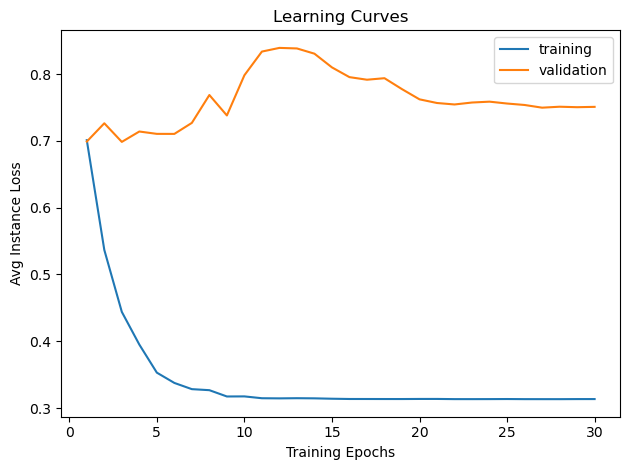

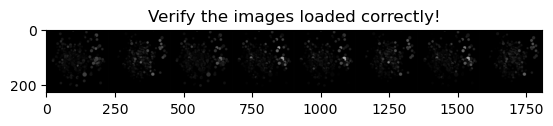

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6967
new best train!
val Loss: 0.8378
new best val!

Epoch 1/29
----------
train Loss: 0.5442
new best train!
val Loss: 0.7944
new best val!

Epoch 2/29
----------
train Loss: 0.4496
new best train!
val Loss: 0.7935
new best val!

Epoch 3/29
----------
train Loss: 0.3846
new best train!
val Loss: 0.7722
new best val!

Epoch 4/29
----------
train Loss: 0.3550
new best train!
val Loss: 0.7676
new best val!

Epoch 5/29
----------
train Loss: 0.3344
new best train!
val Loss: 0.7848

Epoch 6/29
----------
train Loss: 0.3192
new best train!
val Loss: 0.8017

Epoch 7/29
----------
train Loss: 0.3203
val Loss: 0.7868

Epoch 8/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.7561
new best val!

Epoch 9/29
----------
train Loss: 0.3167
val Loss: 0.7022
new best val!

Epoch 10/29
----------
train Loss: 0.3149
new best train!
val Loss: 0.6504
new best val!

Epoch 11/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.6305
new best val!

Epoch 12/29
----------
tra

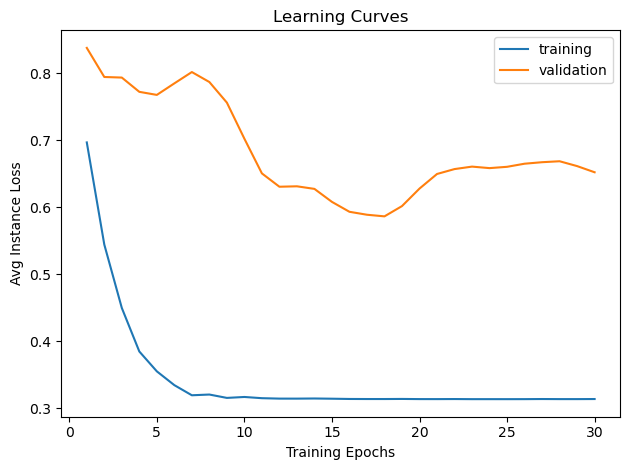

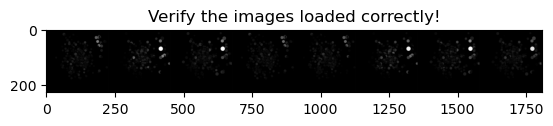

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7110
new best train!
val Loss: 0.6786
new best val!

Epoch 1/29
----------
train Loss: 0.5508
new best train!
val Loss: 0.6914

Epoch 2/29
----------
train Loss: 0.4615
new best train!
val Loss: 0.7553

Epoch 3/29
----------
train Loss: 0.3882
new best train!
val Loss: 0.7812

Epoch 4/29
----------
train Loss: 0.3517
new best train!
val Loss: 0.7741

Epoch 5/29
----------
train Loss: 0.3309
new best train!
val Loss: 0.8101

Epoch 6/29
----------
train Loss: 0.3259
new best train!
val Loss: 0.8016

Epoch 7/29
----------
train Loss: 0.3204
new best train!
val Loss: 0.7264

Epoch 8/29
----------
train Loss: 0.3199
new best train!
val Loss: 0.7201

Epoch 9/29
----------
train Loss: 0.3186
new best train!
val Loss: 0.7117

Epoch 10/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.7318

Epoch 11/29
----------
train Loss: 0.3163
val Loss: 0.7938

Epoch 12/29
----------
train Loss: 0.3155
val Loss: 0.7679

Epoch 13/29
----------
train Loss: 0.3140
new best train!
val 

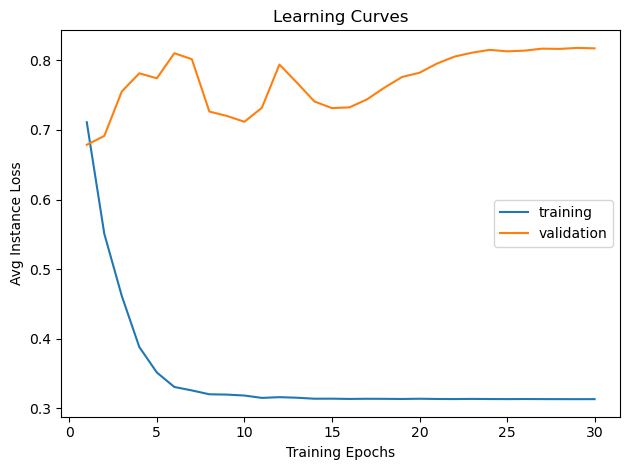

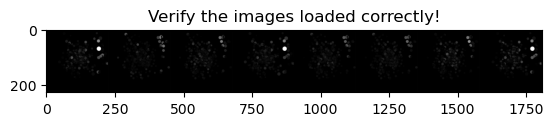

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6839
new best train!
val Loss: 0.6374
new best val!

Epoch 1/29
----------
train Loss: 0.5478
new best train!
val Loss: 0.6815

Epoch 2/29
----------
train Loss: 0.4483
new best train!
val Loss: 0.7377

Epoch 3/29
----------
train Loss: 0.3884
new best train!
val Loss: 0.8256

Epoch 4/29
----------
train Loss: 0.3547
new best train!
val Loss: 0.8878

Epoch 5/29
----------
train Loss: 0.3474
new best train!
val Loss: 0.9009

Epoch 6/29
----------
train Loss: 0.3393
new best train!
val Loss: 0.9399

Epoch 7/29
----------
train Loss: 0.3314
new best train!
val Loss: 0.9038

Epoch 8/29
----------
train Loss: 0.3280
new best train!
val Loss: 0.8772

Epoch 9/29
----------
train Loss: 0.3235
new best train!
val Loss: 0.9164

Epoch 10/29
----------
train Loss: 0.3170
new best train!
val Loss: 0.8146

Epoch 11/29
----------
train Loss: 0.3181
val Loss: 0.8167

Epoch 12/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.8907

Epoch 13/29
----------
train Loss: 0.3143
new 

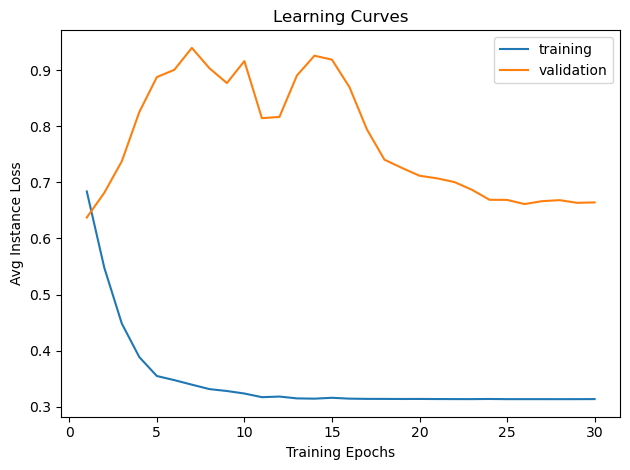

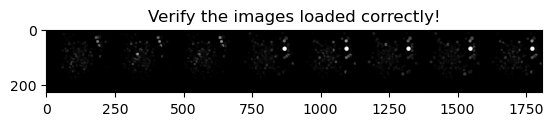

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6871
new best train!
val Loss: 0.6787
new best val!

Epoch 1/29
----------
train Loss: 0.5470
new best train!
val Loss: 0.6858

Epoch 2/29
----------
train Loss: 0.4371
new best train!
val Loss: 0.7613

Epoch 3/29
----------
train Loss: 0.3822
new best train!
val Loss: 0.7876

Epoch 4/29
----------
train Loss: 0.3477
new best train!
val Loss: 0.7563

Epoch 5/29
----------
train Loss: 0.3424
new best train!
val Loss: 0.7250

Epoch 6/29
----------
train Loss: 0.3276
new best train!
val Loss: 0.7232

Epoch 7/29
----------
train Loss: 0.3201
new best train!
val Loss: 0.6392
new best val!

Epoch 8/29
----------
train Loss: 0.3153
new best train!
val Loss: 0.6313
new best val!

Epoch 9/29
----------
train Loss: 0.3170
val Loss: 0.6365

Epoch 10/29
----------
train Loss: 0.3162
val Loss: 0.6684

Epoch 11/29
----------
train Loss: 0.3141
new best train!
val Loss: 0.6826

Epoch 12/29
----------
train Loss: 0.3147
val Loss: 0.6672

Epoch 13/29
----------
train Loss: 0.3140
new best

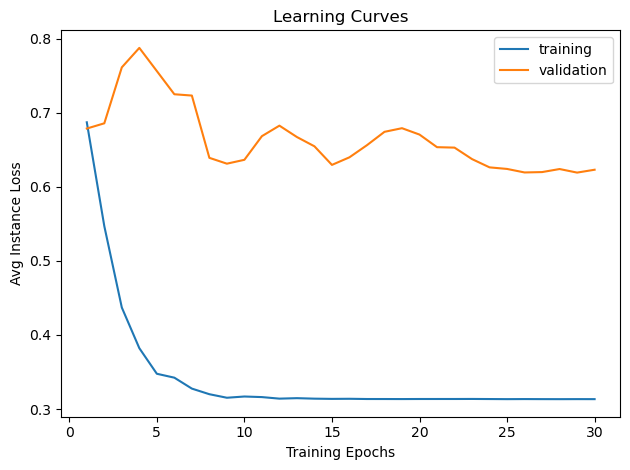

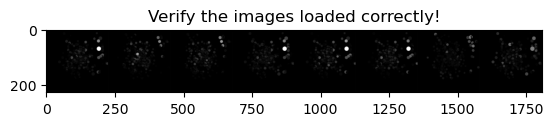

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.7152
new best train!
val Loss: 0.7226
new best val!

Epoch 1/29
----------
train Loss: 0.5522
new best train!
val Loss: 0.7100
new best val!

Epoch 2/29
----------
train Loss: 0.4601
new best train!
val Loss: 0.7299

Epoch 3/29
----------
train Loss: 0.3928
new best train!
val Loss: 0.7197

Epoch 4/29
----------
train Loss: 0.3496
new best train!
val Loss: 0.7409

Epoch 5/29
----------
train Loss: 0.3407
new best train!
val Loss: 0.7827

Epoch 6/29
----------
train Loss: 0.3298
new best train!
val Loss: 0.8059

Epoch 7/29
----------
train Loss: 0.3258
new best train!
val Loss: 0.8425

Epoch 8/29
----------
train Loss: 0.3221
new best train!
val Loss: 0.8770

Epoch 9/29
----------
train Loss: 0.3211
new best train!
val Loss: 0.8867

Epoch 10/29
----------
train Loss: 0.3188
new best train!
val Loss: 0.8807

Epoch 11/29
----------
train Loss: 0.3144
new best train!
val Loss: 0.8895

Epoch 12/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.8950

Epoch 13/29
----

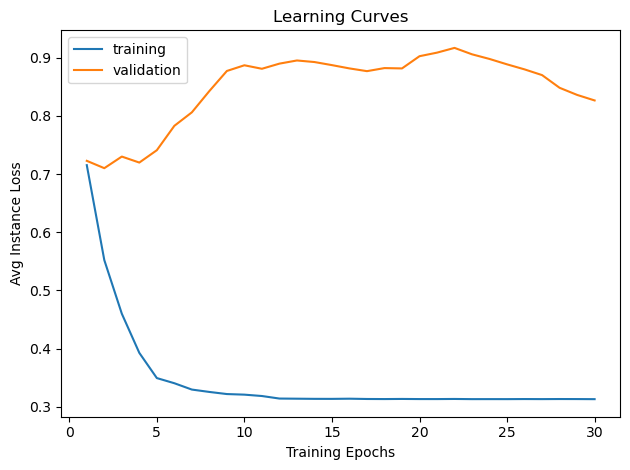

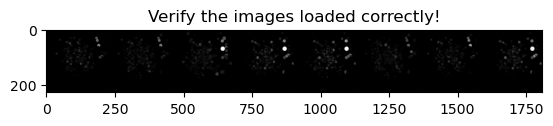

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6935
new best train!
val Loss: 0.6379
new best val!

Epoch 1/29
----------
train Loss: 0.5411
new best train!
val Loss: 0.6423

Epoch 2/29
----------
train Loss: 0.4723
new best train!
val Loss: 0.6237
new best val!

Epoch 3/29
----------
train Loss: 0.3925
new best train!
val Loss: 0.6252

Epoch 4/29
----------
train Loss: 0.3535
new best train!
val Loss: 0.5999
new best val!

Epoch 5/29
----------
train Loss: 0.3308
new best train!
val Loss: 0.5912
new best val!

Epoch 6/29
----------
train Loss: 0.3222
new best train!
val Loss: 0.5838
new best val!

Epoch 7/29
----------
train Loss: 0.3170
new best train!
val Loss: 0.5853

Epoch 8/29
----------
train Loss: 0.3169
new best train!
val Loss: 0.6041

Epoch 9/29
----------
train Loss: 0.3152
new best train!
val Loss: 0.6147

Epoch 10/29
----------
train Loss: 0.3150
new best train!
val Loss: 0.6347

Epoch 11/29
----------
train Loss: 0.3150
val Loss: 0.6979

Epoch 12/29
----------
train Loss: 0.3146
new best train!
val Loss

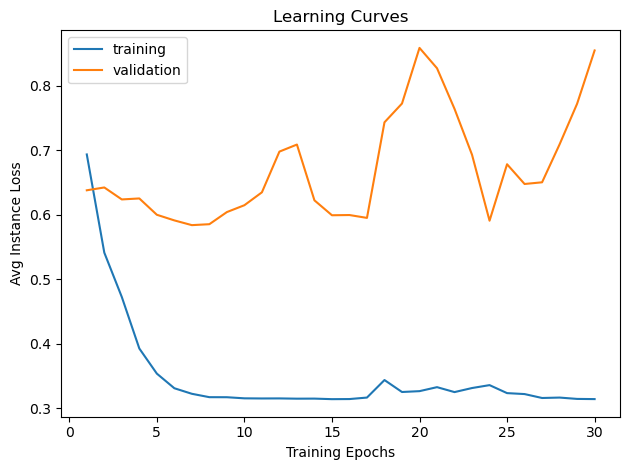

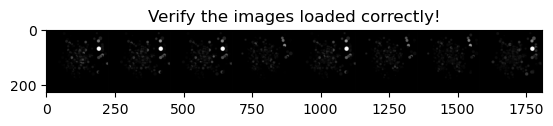

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6975
new best train!
val Loss: 0.7095
new best val!

Epoch 1/29
----------
train Loss: 0.5594
new best train!
val Loss: 0.7084
new best val!

Epoch 2/29
----------
train Loss: 0.4496
new best train!
val Loss: 0.7209

Epoch 3/29
----------
train Loss: 0.3921
new best train!
val Loss: 0.7130

Epoch 4/29
----------
train Loss: 0.3556
new best train!
val Loss: 0.7529

Epoch 5/29
----------
train Loss: 0.3308
new best train!
val Loss: 0.7550

Epoch 6/29
----------
train Loss: 0.3207
new best train!
val Loss: 0.7266

Epoch 7/29
----------
train Loss: 0.3179
new best train!
val Loss: 0.7689

Epoch 8/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.7948

Epoch 9/29
----------
train Loss: 0.3152
val Loss: 0.7756

Epoch 10/29
----------
train Loss: 0.3142
new best train!
val Loss: 0.7426

Epoch 11/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.7209

Epoch 12/29
----------
train Loss: 0.3138
val Loss: 0.7146

Epoch 13/29
----------
train Loss: 0.3136
new be

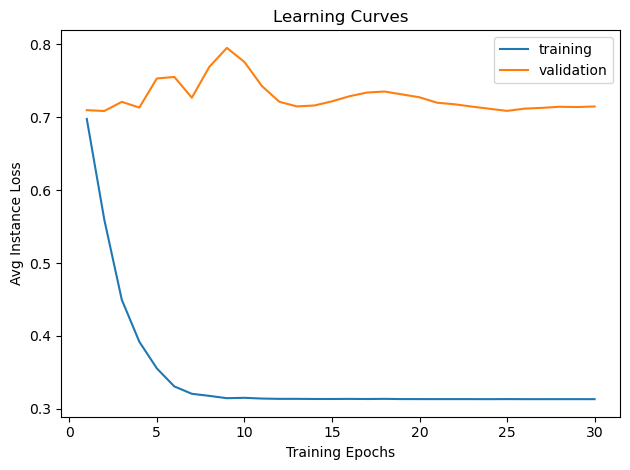

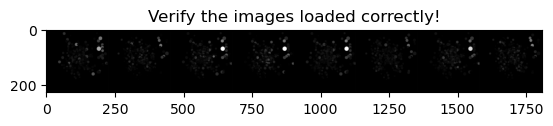

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6821
new best train!
val Loss: 0.7154
new best val!

Epoch 1/29
----------
train Loss: 0.5365
new best train!
val Loss: 0.7483

Epoch 2/29
----------
train Loss: 0.4389
new best train!
val Loss: 0.7406

Epoch 3/29
----------
train Loss: 0.3795
new best train!
val Loss: 0.6845
new best val!

Epoch 4/29
----------
train Loss: 0.3421
new best train!
val Loss: 0.6742
new best val!

Epoch 5/29
----------
train Loss: 0.3301
new best train!
val Loss: 0.6424
new best val!

Epoch 6/29
----------
train Loss: 0.3221
new best train!
val Loss: 0.5740
new best val!

Epoch 7/29
----------
train Loss: 0.3168
new best train!
val Loss: 0.5821

Epoch 8/29
----------
train Loss: 0.3148
new best train!
val Loss: 0.6292

Epoch 9/29
----------
train Loss: 0.3156
val Loss: 0.6381

Epoch 10/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.6016

Epoch 11/29
----------
train Loss: 0.3139
new best train!
val Loss: 0.5853

Epoch 12/29
----------
train Loss: 0.3139
new best train!
val Loss

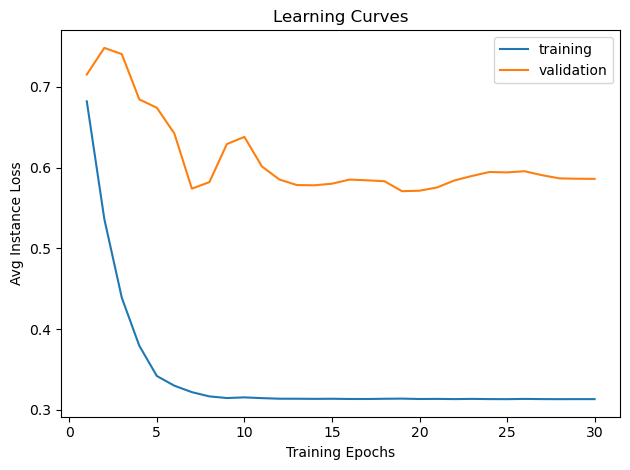

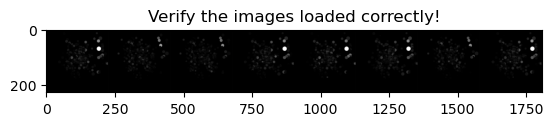

Epoch 0/29
----------


/home/rbain/anaconda3/lib/python3.11/site-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


train Loss: 0.6765
new best train!
val Loss: 0.6848
new best val!

Epoch 1/29
----------
train Loss: 0.5532
new best train!
val Loss: 0.7067

Epoch 2/29
----------
train Loss: 0.4482
new best train!
val Loss: 0.7169

Epoch 3/29
----------
train Loss: 0.3902
new best train!
val Loss: 0.7283

Epoch 4/29
----------
train Loss: 0.3530
new best train!
val Loss: 0.6915

Epoch 5/29
----------
train Loss: 0.3325
new best train!
val Loss: 0.7015

Epoch 6/29
----------
train Loss: 0.3207
new best train!
val Loss: 0.6960

Epoch 7/29
----------
train Loss: 0.3163
new best train!
val Loss: 0.6882

Epoch 8/29
----------
train Loss: 0.3151
new best train!
val Loss: 0.6823
new best val!

Epoch 9/29
----------
train Loss: 0.3147
new best train!
val Loss: 0.6860

Epoch 10/29
----------
train Loss: 0.3145
new best train!
val Loss: 0.6864

Epoch 11/29
----------
train Loss: 0.3143
new best train!
val Loss: 0.6847

Epoch 12/29
----------
train Loss: 0.3138
new best train!
val Loss: 0.6875

Epoch 13/29
----

KeyboardInterrupt: 

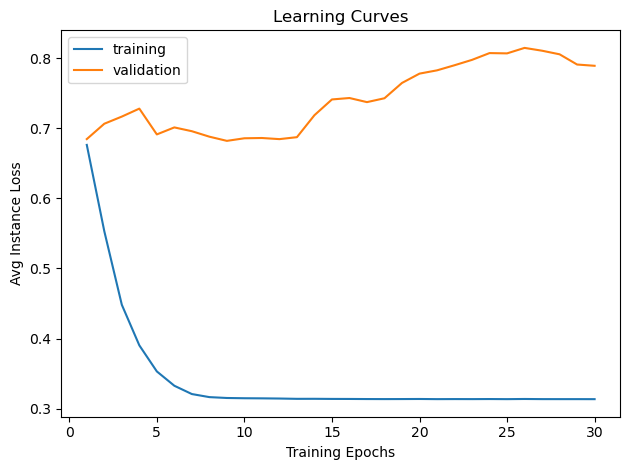

In [6]:
import shutil
from itertools import combinations

# I made 3 copies of this notebook and ran each with diff label_modes
label_mode = "turn_dir"
replicates = 4
split = 0.0
min_train_size = 90
# for prompting the user just once
overwrite = None 
results = []
for m_id in mice_ids:
    # get all the dates for this mouse
    csv_f = os.path.join(data_dir, "dataset.csv")
    trials = pd.read_csv(csv_f, index_col=0)
    m_trials = trials[trials['mouse id'] == m_id]
    m_dates = m_trials['session time']
    m_dates = list(set(m_dates))

    # if there are multiple dates, we train on all possible sets
    if len(m_dates) > 1:
        # check that there's enough data for a good sized test set
        # need it big enough for confidence in generalizability
        filtered_dates = []
        for d in m_dates:
            print()
            train_data = LocalizeDataset(data_dir,
                                        train=True,
                                        label_mode=label_mode,
                                        shuffle=False,
                                        split=split,
                                        _m_ids=[m_id],
                                        dates=[d])

            if len(train_data) < min_train_size:
                print(f'minimum number of training images: {min_train_size}')
                print(f'skipping {m_id} on {d}')
                continue
    
            filtered_dates.append(d)

        # continue if no single datasets are large enough
        if len(filtered_dates) == 0:
            print(f'mouse {m_id} skipped as no sessions were long enough')
            continue

        # every combination of multiple sessions should be added
        # in addition to the single sessions already in m_dates
        def get_combinations(nums):
          result = []
          for i in range(1, len(nums) + 1):
            result.extend(combinations(nums, i))
          return [list(comb) for comb in result]

        date_ids = list(range(len(filtered_dates)))
        date_id_sets = get_combinations(date_ids)
        new_dates = []
        for date_id_set in date_id_sets:
            dates = []
            for date_id in date_id_set:
                dates.append(filtered_dates[date_id])
            new_dates.append(dates)
        m_dates = new_dates

    for dates in m_dates:
        for _ith_run in range(replicates):
            # allows us to sometimes just grab prev results
            skip_train = False
            print()
            
            ch_means, ch_stds = get_norm_pms([m_id], [dates])
            train_trans = T.Compose([
                T.Resize(224, antialias=True),
                T.Normalize(ch_means, ch_stds),
            ])
            val_trans = T.Compose([
                T.Resize(224, antialias=True),
                T.Normalize(ch_means, ch_stds)
            ])

            train_d = LocalizeDataset(data_dir,
                                      train=True,
                                      label_mode=label_mode,
                                      transform=train_trans,
                                      shuffle=_ith_run,
                                      split=split,
                                      _m_ids=[m_id],
                                      dates=[dates])
            test_d = LocalizeDataset(data_dir,
                                    train=False,
                                    label_mode=label_mode,
                                    transform=val_trans,
                                    shuffle=_ith_run,
                                    split=split,
                                    _m_ids=[m_id],
                                    dates=[dates])                                   
            train_dl = torch.utils.data.DataLoader(train_d,
                                                  batch_size=64,
                                                  shuffle=True,
                                                  num_workers=2,
                                                  pin_memory=False)
            test_dl = torch.utils.data.DataLoader(test_d,
                                                  batch_size=64,
                                                  shuffle=False,
                                                  num_workers=2,
                                                  pin_memory=False)

            sub_dir = f'{m_id}__{label_mode}__{split}__{dates[0]}__iter{_ith_run}'
            sub_save = os.path.join(save_dir, sub_dir)
            if os.path.isdir(sub_save):
                if overwrite == None:
                    overwrite = input("Previously trained model results found. Overwrite? [Y/n] ")
                    overwrite = ('y' in overwrite) or ('Y' in overwrite)
                elif overwrite:
                    shutil.rmtree(sub_save)
                else:
                    skip_train = True
            os.makedirs(sub_save, exist_ok=True)

            # Get a batch of training data
            inputs, _1 = next(iter(train_dl))
            inputs = inputs[:8,...]
            plt.figure()
            out = torchvision.utils.make_grid(inputs)
            imshow(out, title="Verify the images loaded correctly!")
            plt.show()

            model_conv = torchvision.models.resnet18(weights='IMAGENET1K_V1')
            num_ftrs = model_conv.fc.in_features
            model_conv.fc = nn.Sequential(
                nn.Linear(num_ftrs, 2),
                nn.Softmax(),
            )
            model_conv = model_conv.to(device)

            criterion = nn.CrossEntropyLoss()
            optimizer_conv = optim.Adam(model_conv.parameters(), lr=1e-4)
            lr_schedule = None
            n_epochs = 30
            if skip_train:
                n_epochs = 0
            best_train, best_val = train_model(model_conv, sub_save, train_dl, test_dl, criterion, 
                                               optimizer_conv, lr_schedule, num_epochs=n_epochs)

            train_acc = get_acc(best_train, train_dl, split="train")
            val_acc = get_acc(best_val, test_dl, split="val")
            date_str = dates
            if type(dates) == type([]):
                date_str = "+++".join(dates)
            results.append([m_id, date_str, train_acc, val_acc])

        results_fn = os.path.join(save_dir, f"{label_mode}_results.npy")
        np.save(results_fn, np.array(results))

INFERENCE ON TRAINING IMAGES:


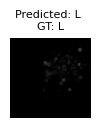

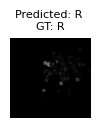

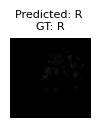

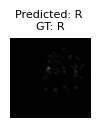

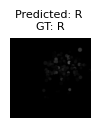

...

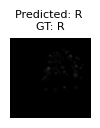

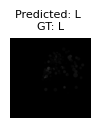

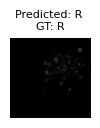

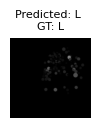

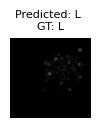







INFERENCE ON TESTING IMAGES:


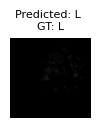

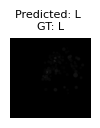

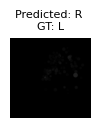

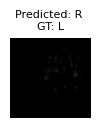

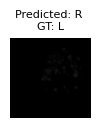

...

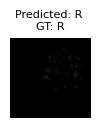

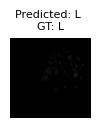

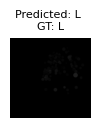

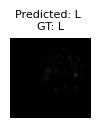

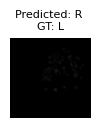

In [77]:
print("INFERENCE ON TRAINING IMAGES:")
visualize_model(best_train, train_dl, split="train")
plt.show()
print("\n\n\n\n\n")
print("INFERENCE ON TESTING IMAGES:")
visualize_model(best_val, test_dl)
plt.show()

### PLOTTING

In [ ]:
import copy
import numpy as np

def get_results(label_mode, replicates=5):
    results_path = os.path.join(save_dir, f"{label_mode}_results.npy")
    results = np.load(results_path, allow_pickle=True)
    # aggregate results from identical parameter sets
    cpy_results = list(copy.deepcopy(results))
    top_1_train, top_1_val = [], []
    
    # find the top-1 of replicate trials
    while len(cpy_results) != 0:
        rep_trains = []
        rep_vals = []
        for r in cpy_results[:replicates]:
            rep_trains.append(r[2])
            rep_vals.append(r[3])
        top_1_train.append(max(rep_trains))
        top_1_val.append(max(rep_vals))
        del cpy_results[:replicates]
    
    # print(f"top-1 train: {top_1_train}")
    # print(f"top-1 val: {top_1_val}")
    
    # take the average among replicate trials
    cpy_results = list(copy.deepcopy(results))
    avg_train = []
    avg_train_len = round(len(cpy_results) / replicates)
    for _ in range(int(avg_train_len)):
        avg_train.append(0)
    
    m_and_sess = []
    k = 0
    while len(cpy_results) != 0:
        _m_id = cpy_results[0][0]
        _date = cpy_results[0][1]
        m_and_sess.append(f'{_m_id} {_date}')
        for r in range(replicates):
            avg_train[k] += float(cpy_results[0][2])
            del cpy_results[0]
        avg_train[k] = avg_train[k] / replicates
        # print("avg train --- " + str(m_and_sess[-1]) + " : " + str(avg_train[k]))
        k += 1
    
    cpy_results = list(copy.deepcopy(results))
    avg_val = []
    avg_val_len = round(len(cpy_results) / replicates)
    for _ in range(int(avg_val_len)):
        avg_val.append(0)
    
    k = 0
    while len(cpy_results) != 0:
        _m_id = cpy_results[0][0]
        _date = cpy_results[0][1]
        for r in range(replicates):
            avg_val[k] += float(cpy_results[0][3])
            del cpy_results[0]
        avg_val[k] = avg_val[k] / replicates
        # print("avg val --- " + f'{_m_id} {_date}' + " : " + str(avg_val[k]))
        k += 1

    cpy_results = list(copy.deepcopy(results))
    return top_1_train, top_1_val, avg_train, avg_val, m_and_sess, cpy_results

In [ ]:
import statistics
import matplotlib.pyplot as plt 

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
plt.suptitle('Average Best Accuracy', fontweight='bold', fontsize=13) 
acc_mins = []
#for ax_i, label_mode in enumerate(['stim_dir', 'turn_dir', 'correctness']):   
for ax_i, label_mode in enumerate(['stim_dir']):   
    top_1_train, top_1_val, avg_train, avg_val, m_and_sess, results = get_results(label_mode, replicates=replicates)
    
    best_val_singles, best_val_combined = [], []
    for i, acc in enumerate(top_1_val):
        acc = float(acc)
        if "+++" in m_and_sess[i]:
            best_val_combined.append(acc)
        else:
            best_val_singles.append(acc)
    
    best_train_singles, best_train_combined = [], []
    for i, acc in enumerate(top_1_train):
        acc = float(acc)
        if "+++" in m_and_sess[i]:
            best_train_combined.append(acc)
        else:
            best_train_singles.append(acc)
    
    avg_best_train_single = sum(best_train_singles) / len(best_train_singles)
    avg_best_val_single = sum(best_val_singles) / len(best_val_singles)
    single_sessions = [avg_best_train_single, avg_best_val_single] 
    a = statistics.stdev(best_train_singles) / (len(best_train_singles) ** 0.5)
    b = statistics.stdev(best_val_singles) / (len(best_val_singles) ** 0.5)
    single_sem = [a, b]
    
    avg_best_train_combo = sum(best_train_combined) / len(best_train_combined)
    avg_best_val_combo = sum(best_val_combined) / len(best_val_combined)
    all_sessions = [avg_best_train_combo, avg_best_val_combo] 
    a = 0 statistics.stdev(best_train_combined) / (len(best_train_combined) ** 0.5)
    b = 0 statistics.stdev(best_val_combined) / (len(best_val_combined) ** 0.5)
    all_sem = [a, b]
    
    # Set position of bar on X axis 
    barWidth = 0.45
    br1 = np.arange(2) 
    br2 = [x + barWidth for x in br1] 
    
    axes[ax_i].bar(br1, single_sessions, color='orange', width=barWidth, yerr=single_sem,
                   edgecolor='black', label='single long sessions') 
    axes[ax_i].bar(br2, all_sessions, color='teal', width=barWidth, yerr=all_sem,
                   edgecolor='black', label='all sessions combined') 

    if label_mode == "turn_dir":
        axes[ax_i].title.set_text("Turn Direction")
    elif label_mode == "stim_dir":
        axes[ax_i].title.set_text("Visual Stimulus")
    else:
        axes[ax_i].title.set_text("Turn Correctness")
    
    axes[0].set_ylabel('Accuracy (%)', fontsize=13) 
    acc_min = min(single_sessions + all_sessions)
    acc_mins.append(acc_min)
    axes[ax_i].set_yticks([10,20,30,40,50,60,70,80,90,100])
    if ax_i == 2: # i.e. the last time
        axes[ax_i].set_ylim([min(acc_mins) - 5, 100+5])
    axes[ax_i].set_xticks([r + barWidth/2 for r in range(len(single_sessions))], 
               ['training', 'validation'])
     
plt.legend()
plt.show()
save_path = os.path.join(save_dir, f"avg_best_acc_combined.png")
fig.savefig(save_path)

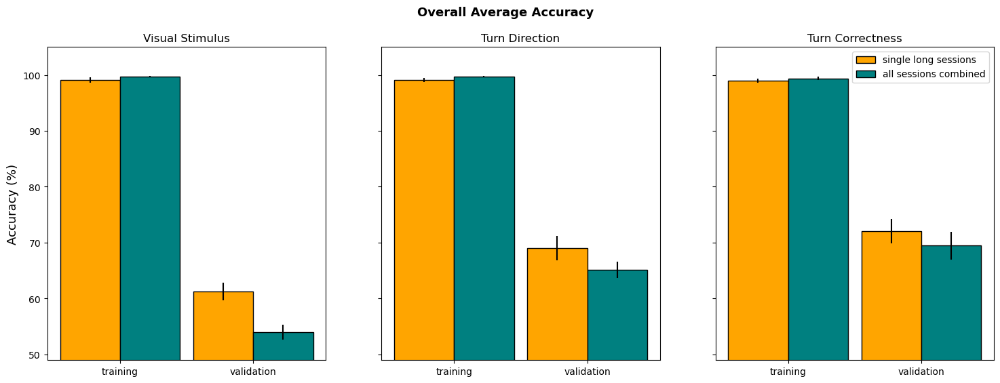

In [130]:
import statistics
import matplotlib.pyplot as plt 

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
plt.suptitle('Overall Average Accuracy', fontweight='bold', fontsize=13) 
acc_mins = []
for ax_i, label_mode in enumerate(['stim_dir', 'turn_dir', 'correctness']):
    top_1_train, top_1_val, avg_train, avg_val, m_and_sess, results = get_results(label_mode)
    
    val_singles, val_combined = [], []
    for i, acc in enumerate(avg_val):
        acc = float(acc)
        if m_and_sess[i][-5:] == "False":
            val_combined.append(acc)
        else:
            val_singles.append(acc)
    
    train_singles, train_combined = [], []
    for i, acc in enumerate(avg_train):
        acc = float(acc)
        if m_and_sess[i][-5:] == "False":
            train_combined.append(acc)
        else:
            train_singles.append(acc)
    
    avg_train_single = sum(train_singles) / len(train_singles)
    avg_val_single = sum(val_singles) / len(val_singles)
    single_sessions = [avg_train_single, avg_val_single] 
    a = statistics.stdev(train_singles) / (len(train_singles) ** 0.5)
    b = statistics.stdev(val_singles) / (len(val_singles) ** 0.5)
    single_sem = [a, b]
    
    avg_train_combo = sum(train_combined) / len(train_combined)
    avg_val_combo = sum(val_combined) / len(val_combined)
    all_sessions = [avg_train_combo, avg_val_combo] 
    a = statistics.stdev(train_combined) / (len(train_combined) ** 0.5)
    b = statistics.stdev(val_combined) / (len(val_combined) ** 0.5)
    all_sem = [a, b]
    
    # Set position of bar on X axis 
    barWidth = 0.45
    br1 = np.arange(2) 
    br2 = [x + barWidth for x in br1] 
    
    axes[ax_i].bar(br1, single_sessions, color='orange', width=barWidth, yerr=single_sem,
                   edgecolor='black', label='single long sessions') 
    axes[ax_i].bar(br2, all_sessions, color='teal', width=barWidth, yerr=all_sem,
                   edgecolor='black', label='all sessions combined') 

    if label_mode == "turn_dir":
        axes[ax_i].title.set_text("Turn Direction")
    elif label_mode == "stim_dir":
        axes[ax_i].title.set_text("Visual Stimulus")
    else:
        axes[ax_i].title.set_text("Turn Correctness")
    
    axes[0].set_ylabel('Accuracy (%)', fontsize=13) 
    acc_min = min(single_sessions + all_sessions)
    acc_mins.append(acc_min)
    axes[ax_i].set_yticks([10,20,30,40,50,60,70,80,90,100])
    if ax_i == 2: # i.e. the last time
        axes[ax_i].set_ylim([min(acc_mins) - 5, 100+5])
    axes[ax_i].set_xticks([r + barWidth/2 for r in range(len(single_sessions))], 
               ['training', 'validation'])
     
plt.legend()
plt.show()
save_path = os.path.join(save_dir, f"avg_avg_acc_combined.png")
fig.savefig(save_path)

this_m_dates: 05_20_2022___15_58_30
n_l1: 47
n_l2: 49
dataset already roughly class balanced :)
number of train images: 96
this_m_dates: 05_19_2022___14_54_17
n_l1: 40
n_l2: 31
dataset already roughly class balanced :)
number of train images: 71
this_m_dates: ['05_20_2022___15_58_30', '05_19_2022___14_54_17']
n_l1: 87
n_l2: 80
dataset already roughly class balanced :)
number of train images: 167


/tmp/ipykernel_8899/1267402719.py:81: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


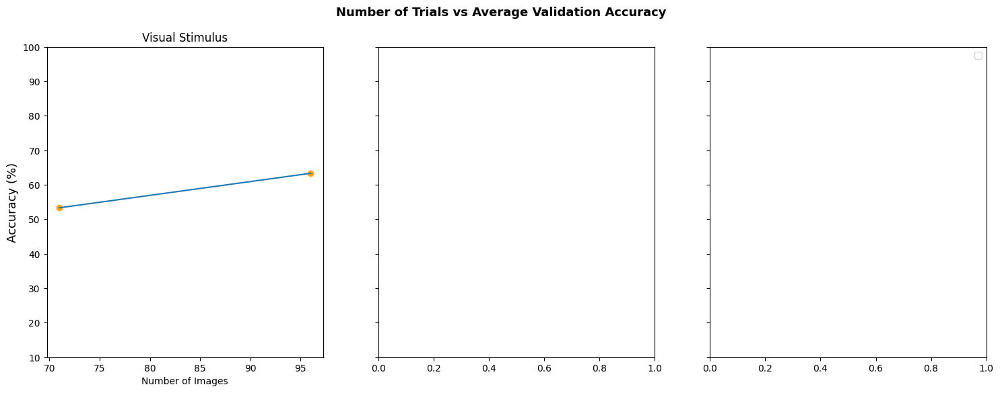

this_m_dates: 05_20_2022___15_58_30
n_l1: 47
n_l2: 49
dataset already roughly class balanced :)
number of train images: 96
this_m_dates: 05_19_2022___14_54_17
n_l1: 40
n_l2: 31
dataset already roughly class balanced :)
number of train images: 71
this_m_dates: ['05_20_2022___15_58_30', '05_19_2022___14_54_17']
n_l1: 87
n_l2: 80
dataset already roughly class balanced :)
number of train images: 167


/tmp/ipykernel_8899/1267402719.py:81: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


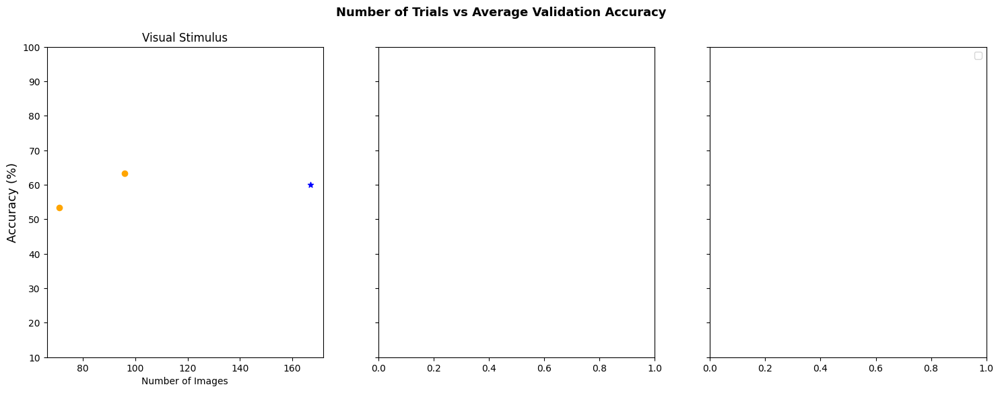

In [98]:
import statistics
import matplotlib.pyplot as plt 

def best_fit(X, Y):
    xbar = sum(X)/len(X)
    ybar = sum(Y)/len(Y)
    n = len(X) # or len(Y)
    numer = sum([xi*yi for xi,yi in zip(X, Y)]) - n * xbar * ybar
    denum = sum([xi**2 for xi in X]) - n * xbar**2
    b = numer / denum
    a = ybar - b * xbar
    # print('best fit line:\ny = {:.2f} + {:.2f}x'.format(a, b))
    return a, b

for _i in range(2):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    plt.suptitle('Number of Trials vs Average Validation Accuracy', fontweight='bold', fontsize=13)
    acc_mins = []
    #for ax_i, label_mode in enumerate(['stim_dir', 'turn_dir', 'correctness']):
    for ax_i, label_mode in enumerate(['stim_dir']):
        results = get_results(label_mode, replicates=replicates)
        top_1_train, top_1_val, avg_train, avg_val, m_and_sess, results = results
        
        val_singles_acc, val_combined_acc = [], []
        val_singles_len, val_combined_len = [], []
        for i, acc in enumerate(avg_val):
            acc = float(acc)
            bits = m_and_sess[i].split(" ")
            m_id = bits[0]
            date = bits[1]
            multiple_sess = False
            if "+++" in date:
                multiple_sess = True
                date = date.split("+++")
            all_data = LocalizeDataset(data_dir,
                                       train=True,
                                       label_mode=label_mode,
                                       transform=None,
                                       shuffle=False,
                                       split=1.0,
                                       _m_ids=[m_id],
                                       dates=[date])
            val_len = len(all_data)
            # indicator of combined sessions
            if multiple_sess:
                val_combined_len.append(val_len)
                val_combined_acc.append(acc)
            else:
                val_singles_len.append(val_len)
                val_singles_acc.append(acc)
        
        axes[ax_i].scatter(val_singles_len, val_singles_acc, color='orange', 
                           label='single long sessions')
        if _i == 0:
            # plot line of best fit (excluding combined)
            a, b = best_fit(val_singles_len, val_singles_acc)
            y_fit = [a + b * xi for xi in val_singles_len]
            axes[ax_i].plot(val_singles_len, y_fit)
        else:
            axes[ax_i].scatter(val_combined_len, val_combined_acc, color='blue', 
                               marker='*', label='all sessions combined')         
    
        if label_mode == "turn_dir":
            axes[ax_i].title.set_text("Turn Direction")
        elif label_mode == "stim_dir":
            axes[ax_i].title.set_text("Visual Stimulus")
        else:
            axes[ax_i].title.set_text("Turn Correctness")
    
        axes[ax_i].set_xlabel('Number of Images') # fontsize=13
        axes[0].set_ylabel('Accuracy (%)', fontsize=13) 
        if _i == 0:
            acc_min = min(val_singles_acc)
        else:
            acc_min = min(val_singles_acc + val_combined_acc)
        acc_mins.append(acc_min)
        axes[ax_i].set_yticks([10,20,30,40,50,60,70,80,90,100])
        if ax_i == 2: # i.e. the last for loop iteration
            axes[ax_i].set_ylim([min(acc_mins) - 5, 100+5])
         
    plt.legend()
    plt.show()
    save_path = os.path.join(save_dir, f"data_size_vs_avg_val_acc_combined_{_i}.png")
    fig.savefig(save_path)

this_m_dates: 05_20_2022___15_58_30
n_l1: 47
n_l2: 49
dataset already roughly class balanced :)
number of train images: 96
this_m_dates: 05_19_2022___14_54_17
n_l1: 40
n_l2: 31
dataset already roughly class balanced :)
number of train images: 71
this_m_dates: ['05_20_2022___15_58_30', '05_19_2022___14_54_17']
n_l1: 87
n_l2: 80
dataset already roughly class balanced :)
number of train images: 167


/tmp/ipykernel_8899/636942882.py:81: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


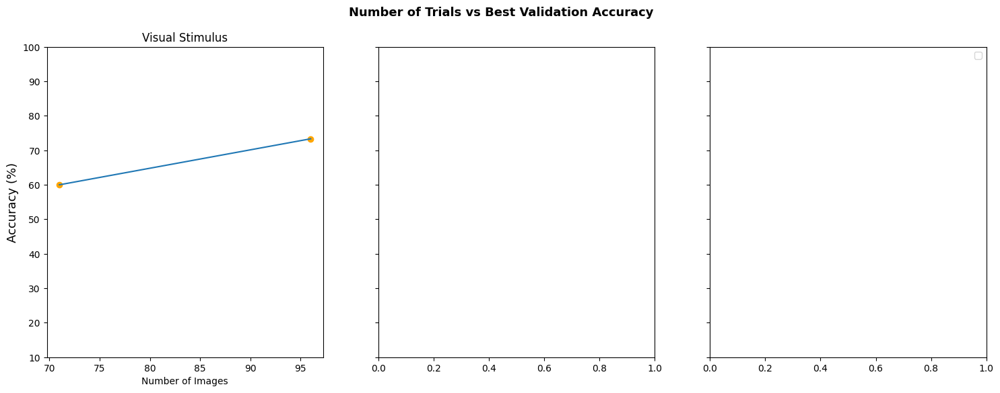

this_m_dates: 05_20_2022___15_58_30
n_l1: 47
n_l2: 49
dataset already roughly class balanced :)
number of train images: 96
this_m_dates: 05_19_2022___14_54_17
n_l1: 40
n_l2: 31
dataset already roughly class balanced :)
number of train images: 71
this_m_dates: ['05_20_2022___15_58_30', '05_19_2022___14_54_17']
n_l1: 87
n_l2: 80
dataset already roughly class balanced :)
number of train images: 167


/tmp/ipykernel_8899/636942882.py:81: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


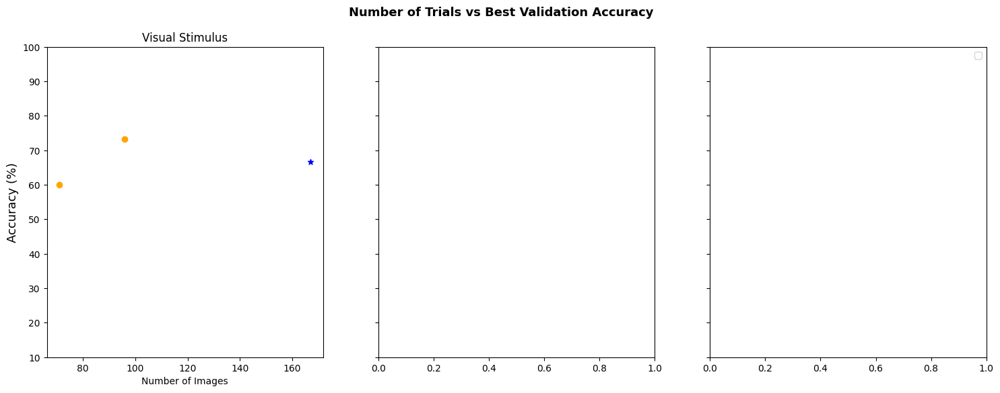

In [99]:
import statistics
import matplotlib.pyplot as plt 

def best_fit(X, Y):
    xbar = sum(X)/len(X)
    ybar = sum(Y)/len(Y)
    n = len(X) # or len(Y)
    numer = sum([xi*yi for xi,yi in zip(X, Y)]) - n * xbar * ybar
    denum = sum([xi**2 for xi in X]) - n * xbar**2
    b = numer / denum
    a = ybar - b * xbar
    # print('best fit line:\ny = {:.2f} + {:.2f}x'.format(a, b))
    return a, b

for _i in range(2):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
    plt.suptitle('Number of Trials vs Best Validation Accuracy', fontweight='bold', fontsize=13)
    acc_mins = []
    #for ax_i, label_mode in enumerate(['stim_dir', 'turn_dir', 'correctness']):
    for ax_i, label_mode in enumerate(['stim_dir']):
        results = get_results(label_mode, replicates=replicates)
        top_1_train, top_1_val, avg_train, avg_val, m_and_sess, results = results
        
        val_singles_acc, val_combined_acc = [], []
        val_singles_len, val_combined_len = [], []
        for i, acc in enumerate(top_1_val):
            acc = float(acc)
            bits = m_and_sess[i].split(" ")
            m_id = bits[0]
            date = bits[1]
            multiple_sess = False
            if "+++" in date:
                multiple_sess = True
                date = date.split("+++")
            all_data = LocalizeDataset(data_dir,
                                       train=True,
                                       label_mode=label_mode,
                                       transform=None,
                                       shuffle=False,
                                       split=1.0,
                                       _m_ids=[m_id],
                                       dates=[date])
            val_len = len(all_data)
            # indicator of combined sessions
            if multiple_sess:
                val_combined_len.append(val_len)
                val_combined_acc.append(acc)
            else:
                val_singles_len.append(val_len)
                val_singles_acc.append(acc)
        
        axes[ax_i].scatter(val_singles_len, val_singles_acc, color='orange', 
                           label='single long sessions')
        if _i == 0:
            # plot line of best fit (excluding combined)
            a, b = best_fit(val_singles_len, val_singles_acc)
            y_fit = [a + b * xi for xi in val_singles_len]
            axes[ax_i].plot(val_singles_len, y_fit)
        else:
            axes[ax_i].scatter(val_combined_len, val_combined_acc, color='blue', 
                               marker='*', label='all sessions combined')         
    
        if label_mode == "turn_dir":
            axes[ax_i].title.set_text("Turn Direction")
        elif label_mode == "stim_dir":
            axes[ax_i].title.set_text("Visual Stimulus")
        else:
            axes[ax_i].title.set_text("Turn Correctness")
    
        axes[ax_i].set_xlabel('Number of Images') # fontsize=13
        axes[0].set_ylabel('Accuracy (%)', fontsize=13) 
        if _i == 0:
            acc_min = min(val_singles_acc)
        else:
            acc_min = min(val_singles_acc + val_combined_acc)
        acc_mins.append(acc_min)
        axes[ax_i].set_yticks([10,20,30,40,50,60,70,80,90,100])
        if ax_i == 2: # i.e. the last for loop iteration
            axes[ax_i].set_ylim([min(acc_mins) - 5, 100+5])
         
    plt.legend()
    plt.show()
    save_path = os.path.join(save_dir, f"data_size_vs_best_val_acc_combined_{_i}.png")
    fig.savefig(save_path)

/tmp/ipykernel_8899/3065101071.py:67: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


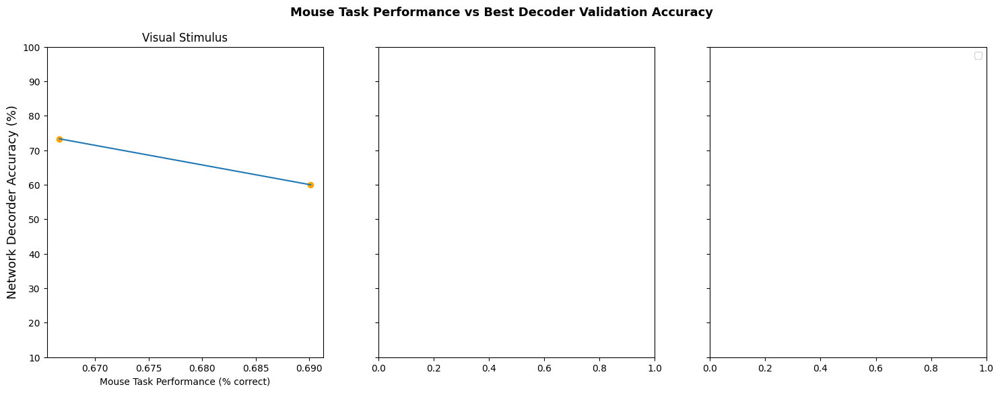

In [101]:
import statistics
import matplotlib.pyplot as plt 

def best_fit(X, Y):
    xbar = sum(X)/len(X)
    ybar = sum(Y)/len(Y)
    n = len(X) # or len(Y)
    numer = sum([xi*yi for xi,yi in zip(X, Y)]) - n * xbar * ybar
    denum = sum([xi**2 for xi in X]) - n * xbar**2
    b = numer / denum
    a = ybar - b * xbar
    # print('best fit line:\ny = {:.2f} + {:.2f}x'.format(a, b))
    return a, b

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
plt.suptitle('Mouse Task Performance vs Best Decoder Validation Accuracy', fontweight='bold', fontsize=13)
acc_mins = []
#for ax_i, label_mode in enumerate(['stim_dir', 'turn_dir', 'correctness']):
for ax_i, label_mode in enumerate(['stim_dir']):
    results = get_results(label_mode, replicates=replicates)
    top_1_train, top_1_val, avg_train, avg_val, m_and_sess, results = results

    acc_f = os.path.join(data_dir, "acc.csv")
    acc_df = pd.read_csv(acc_f)
    mouse_ids = acc_df[['mouse id']]
    dates = acc_df[['session time']]
    acc_s = acc_df[['accuracy']]
    
    singles_perf = []
    singles_acc = []
    for i, acc in enumerate(top_1_val):
        acc = float(acc)
        bits = m_and_sess[i].split(" ")
        m_id = bits[0]
        date = bits[1]
        if "+++" in date:
            continue
        # sorry, pandas notation is horribly unintuitive, I know...
        perf = acc_df.loc[(acc_df['mouse id'] == m_id) & (acc_df['session time'] == date)]
        perf = float(perf['accuracy'].values[0])
        singles_perf.append(perf)
        singles_acc.append(acc)
    
    axes[ax_i].scatter(singles_perf, singles_acc, color='orange', 
                       label='single long sessions')
    
    # plot line of best fit (excluding combined)
    a, b = best_fit(singles_perf, singles_acc)
    y_fit = [a + b * xi for xi in singles_perf]
    axes[ax_i].plot(singles_perf, y_fit)        

    if label_mode == "turn_dir":
        axes[ax_i].title.set_text("Turn Direction")
    elif label_mode == "stim_dir":
        axes[ax_i].title.set_text("Visual Stimulus")
    else:
        axes[ax_i].title.set_text("Turn Correctness")

    axes[ax_i].set_xlabel('Mouse Task Performance (% correct)') 
    axes[0].set_ylabel('Network Decorder Accuracy (%)', fontsize=13) 
    acc_min = min(singles_acc)
    acc_mins.append(acc_min)
    axes[ax_i].set_yticks([10,20,30,40,50,60,70,80,90,100])
    if ax_i == 2: # i.e. the last for loop iteration
        axes[ax_i].set_ylim([min(acc_mins) - 5, 100+5])
     
plt.legend()
plt.show()
save_path = os.path.join(save_dir, f"mouse_performance_vs_best_val.png")
fig.savefig(save_path)

Training complete in 0m 0s
this_m_dates: 05_19_2022___14_54_17
n_l1: 40
n_l2: 31
dataset already roughly class balanced :)
number of train images: 71
channel means: [0.00658893 0.006686   0.00684353]
channel stdevs: [0.02914778 0.02956453 0.03070614]
this_m_dates: 05_20_2022___15_58_30
n_l1: 47
n_l2: 49
dataset already roughly class balanced :)
number of val images: 15


/home/rbain/anaconda3/envs/ali_1p/lib/python3.9/site-packages/torch/nn/modules/module.py:1553: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)
/tmp/ipykernel_8899/2769587271.py:142: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


number correct: 4
total number: 15
val accuracy: 26.7


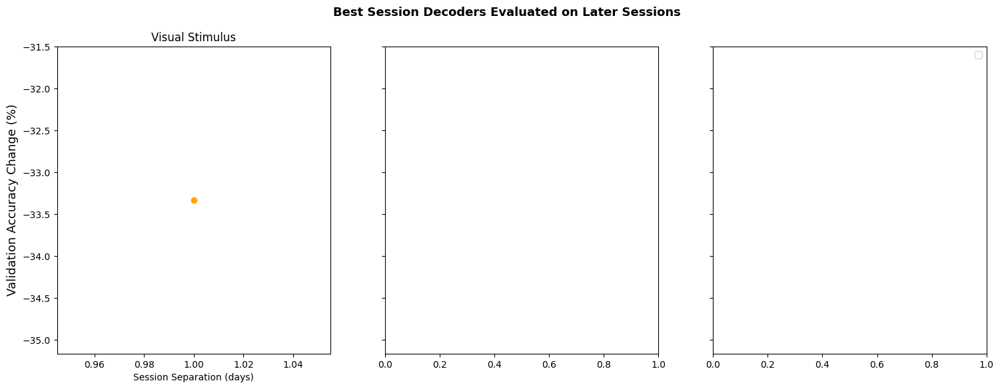

In [105]:
import datetime
import matplotlib.pyplot as plt 

def best_fit(X, Y):
    xbar = sum(X)/len(X)
    ybar = sum(Y)/len(Y)
    n = len(X) # or len(Y)
    numer = sum([xi*yi for xi,yi in zip(X, Y)]) - n * xbar * ybar
    denum = sum([xi**2 for xi in X]) - n * xbar**2
    b = numer / denum
    a = ybar - b * xbar
    return a, b

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
plt.suptitle('Best Session Decoders Evaluated on Later Sessions', fontweight='bold', fontsize=13)
#for ax_i, label_mode in enumerate(['stim_dir', 'turn_dir', 'correctness']):
for ax_i, label_mode in enumerate(['stim_dir']):
    results = get_results(label_mode, replicates=replicates)
    top_1_train, top_1_val, avg_train, avg_val, m_and_sess, results = results

    acc_deltas, time_deltas = [], []
    # load a mouse's best val model for a day & eval it on other day's.
    for m_id in mice_ids:
        
        m_dates = []
        for m_s in m_and_sess:
            bits = m_s.split(" ")
            _m_id = bits[0]
            date = bits[1]
            if _m_id != m_id:
                continue
            if "+++" in date:
                continue
            m_dates.append(date)
            
        if len(m_dates) == 0:
            continue

        # sort days in chronological order
        days_unordered = m_dates
        as_datetimes = []
        for day in days_unordered:
            t = day.split("/")[-1]
            t = t.split("___")[0]
            MM = t.split("_")[0]
            DD = t.split("_")[1]
            YY = t.split("_")[2]
            dt = datetime.date(int(YY), int(MM), int(DD))
            as_datetimes.append(dt)
        
        # combine the parallel lists
        zipped_pairs = zip(as_datetimes, m_dates)
        # days sorted in chronological order now
        m_dates = [x for _, x in sorted(zipped_pairs)]
        
        for i, d1 in enumerate(m_dates[:-1]):
            t = d1.split("/")[-1]
            t = t.split("___")[0]
            MM = t.split("_")[0]
            DD = t.split("_")[1]
            YY = t.split("_")[2]
            t1 = datetime.date(int(YY), int(MM), int(DD))
            
            __accs = []
            for r in results:
                if r[0] == m_id:
                    if r[1] == d1:
                        __accs.append(float(r[-1]))

            _ith_run = __accs.index(max(__accs))
            baseline_acc = __accs[_ith_run]

            split = 0.0
            sub_dir = f'{m_id}__{label_mode}__{split}__{d1}__iter{_ith_run}'
            sub_save = os.path.join(save_dir, sub_dir)
            
            model_conv = torchvision.models.resnet18(weights='IMAGENET1K_V1')
            num_ftrs = model_conv.fc.in_features
            model_conv.fc = nn.Sequential(
                nn.Linear(num_ftrs, 2),
                nn.Softmax(),
            )
            model_conv = model_conv.to(device)
            model_conv.train(False)
            _best_train, best_val = train_model(model_conv, sub_save, None, None, None, 
                                                None, None, num_epochs=0, save_curves=False)
            
            # load later day's data & eval old decoder on it
            for d2 in m_dates[1+i:]:
                t = d2.split("/")[-1]
                t = t.split("___")[0]
                MM = t.split("_")[0]
                DD = t.split("_")[1]
                YY = t.split("_")[2]
                t2 = datetime.date(int(YY), int(MM), int(DD))
                td = (t2 - t1).total_seconds()
                td = round(td / 86400) # seconds in a day
                time_deltas.append(td)
                
                # normalize using the pms it was trained on.
                ch_means, ch_stds = get_norm_pms([m_id], [d1])
                val_trans = T.Compose([
                    T.Resize(224, antialias=True),
                    T.Normalize(ch_means, ch_stds)
                ])
    
                test_d = LocalizeDataset(data_dir,
                                        train=False,
                                        label_mode=label_mode,
                                        transform=val_trans,
                                        shuffle=0,
                                        split=split,
                                        _m_ids=[m_id],
                                        dates=[d2])
                test_dl = torch.utils.data.DataLoader(test_d,
                                                      batch_size=256,
                                                      shuffle=True,
                                                      num_workers=2,
                                                      pin_memory=False)
                diff_day_acc = get_acc(model_conv, test_dl, split="val") 
                # calculate relative change wrt original acc
                acc_delta = diff_day_acc - baseline_acc
                acc_deltas.append(acc_delta)

    axes[ax_i].scatter(time_deltas, acc_deltas, color='orange')
    
    # plot line of best fit
    a, b = best_fit(time_deltas, acc_deltas)
    y_fit = [a + b * xi for xi in time_deltas]
    axes[ax_i].plot(time_deltas, y_fit)        

    if label_mode == "turn_dir":
        axes[ax_i].title.set_text("Turn Direction")
    elif label_mode == "stim_dir":
        axes[ax_i].title.set_text("Visual Stimulus")
    else:
        axes[ax_i].title.set_text("Turn Correctness")

    axes[ax_i].set_xlabel('Session Separation (days)') 
    axes[0].set_ylabel('Validation Accuracy Change (%)', fontsize=13) 

plt.legend()
plt.show()
save_path = os.path.join(save_dir, f"delta_time_vs_delta_val_acc.png")
fig.savefig(save_path)

#### Train the MEGA model with all mice and all S2 sessions:

In [ ]:
m_id = False
replicates = 5
results = []
for label_mode in ["turn_dir", "stim_dir", "correctness"]:
    dates = [False]
    for _ith_run in range(replicates):
        ch_means, ch_stds = get_norm_pms(m_id, dates)
        train_trans = T.Compose([
            T.Resize(224, antialias=True),
            T.Normalize(ch_means, ch_stds),
        ])
        val_trans = T.Compose([
            T.Resize(224, antialias=True),
            T.Normalize(ch_means, ch_stds)
        ])

        split = 0.9
        train_d = LocalizeDataset(data_dir,
                                  train=True,
                                  label_mode=label_mode,
                                  transform=train_trans,
                                  shuffle=True,
                                  split=split,
                                  _m_ids=m_id,
                                  dates=dates)
        test_d = LocalizeDataset(data_dir,
                                train=False,
                                label_mode=label_mode,
                                transform=val_trans,
                                shuffle=True,
                                split=split,
                                _m_ids=m_id,
                                dates=dates)
        train_dl = torch.utils.data.DataLoader(train_d,
                                              batch_size=64,
                                              shuffle=True,
                                              num_workers=2,
                                              pin_memory=False)
        test_dl = torch.utils.data.DataLoader(test_d,
                                              batch_size=64,
                                              shuffle=True,
                                              num_workers=2,
                                              pin_memory=False)

        sub_dir = f'{m_id}__{label_mode}__{split}__{dates[0]}__iter{_ith_run}'
        sub_save = os.path.join(save_dir, sub_dir)
        os.makedirs(sub_save, exist_ok=True)

        model_conv = torchvision.models.resnet18(weights='IMAGENET1K_V1')
        num_ftrs = model_conv.fc.in_features
        model_conv.fc = nn.Sequential(
            nn.Linear(num_ftrs, 2),
            nn.Softmax(),
        )
        model_conv = model_conv.to(device)

        criterion = nn.CrossEntropyLoss()
        optimizer_conv = optim.Adam(model_conv.parameters(), lr=1e-4)
        lr_schedule = None
        n_epochs = 35
        best_train, best_val = train_model(model_conv, sub_save, train_dl, test_dl, criterion, 
                                           optimizer_conv, lr_schedule, num_epochs=n_epochs)

        train_acc = get_acc(best_train, train_dl, split="train")
        val_acc = get_acc(best_val, test_dl, split="val")
        results.append([m_id, dates[0], train_acc, val_acc])

In [58]:
print(results)
print()
print("Best validation for turn_dir: ", max([results[0][-1], results[1][-1], results[2][-1], results[3][-1], results[4][-1]]))
print("Avg validation for turn_dir: ", sum([results[0][-1], results[1][-1], results[2][-1], results[3][-1], results[4][-1]])/5)
print("Best validation for stim_dir: ", max([results[5][-1], results[6][-1], results[7][-1], results[8][-1], results[9][-1]]))
print("Avg validation for stim_dir: ", sum([results[5][-1], results[6][-1], results[7][-1], results[8][-1], results[9][-1]])/5)
print("Best validation for correctness: ", max([results[10][-1], results[11][-1], results[12][-1], results[13][-1], results[14][-1]]))
print("Avg validation for correctness: ", sum([results[10][-1], results[11][-1], results[12][-1], results[13][-1], results[14][-1]])/5)

[[False, False, 95.77651515151516, 64.05451448040887], [False, False, 98.125, 64.73594548551958], [False, False, 97.51893939393939, 61.499148211243615], [False, False, 98.03030303030303, 63.03236797274276], [False, False, 97.12121212121212, 60.81771720613288], [False, False, 98.31439393939394, 52.640545144804086], [False, False, 97.72727272727273, 56.218057921635435], [False, False, 97.72727272727273, 50.4258943781942], [False, False, 98.61742424242425, 55.195911413969334], [False, False, 98.35227272727273, 55.5366269165247], [False, False, 96.93181818181819, 71.20954003407155], [False, False, 94.46969696969697, 70.18739352640544], [False, False, 95.98484848484848, 70.52810902896081], [False, False, 96.76136363636364, 71.37989778534923], [False, False, 95.81439393939394, 71.20954003407155]]

Best validation for turn_dir:  64.73594548551958
Avg validation for turn_dir:  62.82793867120954
Best validation for stim_dir:  56.218057921635435
Avg validation for stim_dir:  54.00340715502555
Be